### Imports

In [2]:
# base and metaprogramming imports
from __future__ import annotations
import os
import shutil
import sys
import itertools as it
import pprint as pp
from typing import Optional
import warnings

# analysis imports
import h5py
import numpy as np
import pandas as pd
import pandas
from pandas.api.types import CategoricalDtype
import scipy
import scipy.ndimage
import skimage as ski
import ants

# visualization imports
import napari
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns

# ipynb-specific imports
try:
    import ipynbname
except Exception as e:
    warnings.warn(f'`ipynbname` module import failed with error: {e!r}')
    ipynbname = None
    
if ipynbname is not None:
    _file = ipynbname.path()
else:
    # manually set the full path to the current notebook below if `ipynbname` 
    # import fails
    _file = ''
    
jobs_dir = os.path.split(_file)[0]
sources_dir = os.path.abspath(os.path.join(jobs_dir, '..'))
repo_dir = os.path.abspath(os.path.join(sources_dir, '..'))
config_dir = os.path.abspath(os.path.join(repo_dir, 'configs'))

# add sources directory to path
if sources_dir not in sys.path:
    sys.path.append(sources_dir)

# local imports
import c_swain_python_utils as csutils
from utilities import *
import imaging_dataset as imd
import prairie_view_imports as pvi

_basename = os.path.basename(_file)
_name = csutils.no_ext_basename(_file)


### Plotting Defaults

In [3]:
# plotting defaults
# plotting defaults
mpl.font_manager.fontManager.addfont('C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Black.otf')
mpl.font_manager.fontManager.addfont('C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Bold.otf')
mpl.font_manager.fontManager.addfont('C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf')
sns.set_style(
    'ticks',
    {'font.sans-serif': ['Helvetica LT Pro', ],
     'mathtext.fontset': ['cm',],
     'axes.linewidth': 2,
     }
)
axes_lw = 2
mpl.rcParams['axes.linewidth'] = axes_lw
mpl.rcParams['xtick.major.width'] = axes_lw
mpl.rcParams['xtick.minor.width'] = axes_lw
mpl.rcParams['ytick.major.width'] = axes_lw
mpl.rcParams['ytick.minor.width'] = axes_lw
mpl.rcParams['axes.facecolor'] = 'none'
mpl.rcParams['figure.frameon'] = False
mpl.rcParams['figure.facecolor'] = 'none'
mpl.rcParams['figure.edgecolor'] = 'none'

In [4]:
# logging setup
log = csutils.get_logger(_name)

debug_mode = False
default_window_level = 'debug'

log_path = os.path.join(sources_dir, '..', 'logs', f'{_basename}.log')
csutils.apply_standard_logging_config(
    file_path=log_path,
    window_level='debug' if debug_mode else default_window_level,
    window_format='debug' if debug_mode else 'default')

# Multi-Experiment Integrated Analysis
## Load in All Dataframes

In [5]:
multi_experiment_output_dir = os.path.join(
    r'G:\c_swain\zf_correlative_microscopy\analyzed_and_generated_data',
    'cs-ii-[29,33,34]_outputs')
csutils.touchdir(multi_experiment_output_dir)

activity_traces_fname = 'cs-ii-[29,33,24]_all-traces-dataframe_v1.pkl'
activity_traces_path = os.path.join(multi_experiment_output_dir, activity_traces_fname)
activity_traces_df: pd.DataFrame = csutils.load_from_disk(activity_traces_path)
log.info(f'Activity Traces Dataframe loaded...')
activity_traces_df.info()
activity_traces_df.head()

local-nb_cs-ii-[29,33,34]_integration_figures (   9): INFO : Activity Traces Dataframe loaded...
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7428722 entries, 0 to 7428721
Data columns (total 16 columns):
 #   Column                    Dtype   
---  ------                    -----   
 0   region                    category
 1   super-region              category
 2   lateral-side              category
 3   time                      float64 
 4   fluorescence-quantile_95  float64 
 5   fluorescence-quantile_75  float64 
 6   fluorescence-quantile_50  float64 
 7   fluorescence-quantile_25  float64 
 8   fluorescence-quantile_05  float64 
 9   fluorescence-mean         float64 
 10  fluorescence-variance     float64 
 11  dorsoventral-position     float64 
 12  lateral-position          float64 
 13  anteroposterior-position  float64 
 14  experiment-id             category
 15  run-id                    category
dtypes: category(5), float64(11)
memory usage: 666.0 MB


,region,super-region,lateral-side,time,fluorescence-quantile_95,fluorescence-quantile_75,fluorescence-quantile_50,fluorescence-quantile_25,fluorescence-quantile_05,fluorescence-mean,fluorescence-variance,dorsoventral-position,lateral-position,anteroposterior-position,experiment-id,run-id
0,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,0.000000,0.063899,0.011842,0.000244,0.000000,0.0,0.014311,0.000750,0.470211,-0.043734,0.540266,cs-ii-29,395
1,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,0.994207,0.047589,0.012086,0.007569,0.000000,0.0,0.013443,0.000340,0.470211,-0.043734,0.540266,cs-ii-29,395
2,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,1.988415,0.121988,0.046759,0.027835,0.001099,0.0,0.039732,0.002103,0.470211,-0.043734,0.540266,cs-ii-29,395
3,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,2.982622,0.069222,0.037846,0.005005,0.000000,0.0,0.020185,0.000785,0.470211,-0.043734,0.540266,cs-ii-29,395
4,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,3.976829,0.133879,0.042486,0.003296,0.000488,0.0,0.038335,0.002717,0.470211,-0.043734,0.540266,cs-ii-29,395


In [6]:
stimulation_log_fname = 'full_experiment_stim_config_df.csv.pkl'
stimulation_log_path = os.path.join(multi_experiment_output_dir, stimulation_log_fname)
stimulation_log_df: pd.DataFrame = csutils.load_from_disk(stimulation_log_path)
log.info(f'Stimulation Log Dataframe loaded...')
stimulation_log_df.info()
stimulation_log_df

local-nb_cs-ii-[29,33,34]_integration_figures (   4): INFO : Stimulation Log Dataframe loaded...
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   description              250 non-null    object  
 1   duration_s               250 non-null    float64 
 2   left                     222 non-null    category
 3   middle                   234 non-null    category
 4   right                    222 non-null    category
 5   flag                     250 non-null    bool    
 6   stim-type                250 non-null    category
 7   actual-rel-start-time_s  250 non-null    float64 
 8   experiment-id            250 non-null    category
 9   run-id                   250 non-null    category
 10  stim-step-index          250 non-null    int64   
dtypes: bool(1), category(6), float64(2), int64(1), object(1)
memory usage: 10.0+ K

,description,duration_s,left,middle,right,flag,stim-type,actual-rel-start-time_s,experiment-id,run-id,stim-step-index
0,break-1,300.0,NaN,NaN,NaN,False,equilibration,0.000000,cs-ii-29,395,0
1,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,299.999816,cs-ii-29,395,1
2,break-2,120.0,NaN,NaN,NaN,False,break,360.000666,cs-ii-29,395,2
3,pulse-2,60.0,NaN,fish water,NaN,False,tactile-pulse,480.001961,cs-ii-29,395,3
4,break-3,120.0,NaN,NaN,NaN,False,break,540.002058,cs-ii-29,395,4
...,...,...,...,...,...,...,...,...,...,...,...
245,wash,120.0,fish water,fish water,fish water,False,break,848.006102,cs-ii-34,209,19
246,aa sustain,30.0,amino acid (1.3 mM),fish water,amino acid (1.3 mM),False,aa-1.3mM,968.005482,cs-ii-34,209,20
247,wash,120.0,fish water,fish water,fish water,False,break,998.005913,cs-ii-34,209,21
248,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,1118.006394,cs-ii-34,209,22


In [7]:
swim_bout_stat_fname = 'cs-ii-[29,33,34]_swim-bout-statistics.pd.pkl'
swim_bout_stat_path = os.path.join(
    multi_experiment_output_dir, swim_bout_stat_fname)
swim_bout_stat_df: pd.DataFrame = (
    csutils.load_from_disk(swim_bout_stat_path))
log.info(f'Swim Bout Statistics Dataframe loaded...')
swim_bout_stat_df.info()
swim_bout_stat_df.head()

local-nb_cs-ii-[29,33,34]_integration_figures (   6): INFO : Swim Bout Statistics Dataframe loaded...
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2714 entries, 0 to 2713
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   experiment_id         2714 non-null   object 
 1   run_id                2714 non-null   int64  
 2   fish_id               2714 non-null   object 
 3   bout_index            2714 non-null   int64  
 4   bout_timestamp        2714 non-null   float64
 5   bout_framestamp       2714 non-null   int64  
 6   bout_duration         2714 non-null   float64
 7   bout_max_curvature    2714 non-null   float64
 8   bout_max_angle_range  2714 non-null   float64
 9   bout_duration_ms      2714 non-null   float64
 10  unique_run_id         2714 non-null   object 
 11  count_col             2714 non-null   int64  
dtypes: float64(5), int64(4), object(3)
memory usage: 254.6+ KB


,experiment_id,run_id,fish_id,bout_index,bout_timestamp,bout_framestamp,bout_duration,bout_max_curvature,bout_max_angle_range,bout_duration_ms,unique_run_id,count_col
0,cs-ii-29,395,cs-ii-29B,0,23.637,5623,0.210,0.029499,104.740924,210.0,cs-ii-29_395,1
1,cs-ii-29,395,cs-ii-29B,1,48.073,11463,0.250,0.097845,85.426512,250.0,cs-ii-29_395,1
2,cs-ii-29,395,cs-ii-29B,2,48.502,11566,0.288,0.197285,139.522245,288.0,cs-ii-29_395,1
3,cs-ii-29,395,cs-ii-29B,3,195.123,46548,0.198,0.035623,86.689587,198.0,cs-ii-29_395,1
4,cs-ii-29,396,cs-ii-29B,0,48.291,12067,0.370,0.029650,70.336598,370.0,cs-ii-29_396,1


In [8]:
tail_movement_timecourse_fname = 'cs-ii-[29,33,34]_tail-movement-timecourses.pd.pkl'
tail_movement_timecourse_path = os.path.join(
    multi_experiment_output_dir, tail_movement_timecourse_fname)
tail_movement_timecourse_df: pd.DataFrame = (
    csutils.load_from_disk(tail_movement_timecourse_path))
log.info(f'Tail Movement Timecourse Dataframe loaded...')
tail_movement_timecourse_df.info()
tail_movement_timecourse_df.head()

local-nb_cs-ii-[29,33,34]_integration_figures (   6): INFO : Tail Movement Timecourse Dataframe loaded...
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6902992 entries, 0 to 6902991
Data columns (total 41 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   time                    float64
 1   HeadPosX                float64
 2   HeadPosY                float64
 3   Heading                 float64
 4   TailAngle               float64
 5   TailLength              float64
 6   TailPosX1               float64
 7   TailPosX2               float64
 8   TailPosX3               float64
 9   TailPosX4               float64
 10  TailPosX5               float64
 11  TailPosX6               float64
 12  TailPosX7               float64
 13  TailPosX8               float64
 14  TailPosX9               float64
 15  TailPosY1               float64
 16  TailPosY2               float64
 17  TailPosY3               float64
 18  TailPosY4               float64
 19 

,time,HeadPosX,HeadPosY,Heading,TailAngle,TailLength,TailPosX1,TailPosX2,TailPosX3,TailPosX4,...,tail_c07,tail_c08,tail_max_abs_curvature,baseline_tail_angle,movement_flag,bout_index,experiment_id,run_id,fish_id,unique_run_id
0,0.000,211.005567,266.519228,3.164222,-0.652486,186.053070,231.490431,252.015929,272.622453,293.292741,...,0.000325,0.000273,0.002225,-0.338951,False,NaN,cs-ii-29,395,cs-ii-29B,cs-ii-29_395
1,0.002,211.004454,266.536520,3.164130,-0.579131,186.308302,231.531654,252.101342,272.744496,293.445230,...,0.000436,0.000350,0.001988,-0.295292,False,NaN,cs-ii-29,395,cs-ii-29B,cs-ii-29_395
2,0.004,211.003358,266.554801,3.164033,-0.492650,186.575942,231.575559,252.192100,272.873966,293.606739,...,0.000571,0.000447,0.001729,-0.255962,False,NaN,cs-ii-29,395,cs-ii-29B,cs-ii-29_395
3,0.006,211.002347,266.573480,3.163934,-0.395919,186.841561,231.619893,252.283405,273.003976,293.768658,...,0.000728,0.000564,0.001458,-0.221958,False,NaN,cs-ii-29,395,cs-ii-29B,cs-ii-29_395
4,0.008,211.001484,266.591917,3.163836,-0.293480,187.093191,231.662576,252.370785,273.128168,293.923126,...,0.000899,0.000695,0.001196,-0.193998,False,NaN,cs-ii-29,395,cs-ii-29B,cs-ii-29_395


In [9]:
# COLUMN NAMES (CN)
REGION_CN = 'region'
SUPER_REGION_CN = 'super-region'
LAT_SIDE_CN = 'lateral-side'
TIME_CN = 'time'
Q95_CN = 'fluorescence-quantile_95'
Q75_CN = 'fluorescence-quantile_75'
Q50_CN = 'fluorescence-quantile_50'
Q25_CN = 'fluorescence-quantile_25'
Q05_CN = 'fluorescence-quantile_05'
MEAN_CN = 'fluorescence-mean'       
VAR_CN = 'fluorescence-variance'   
DV_POS_CN = 'dorsoventral-position'   
LAT_POS_CN = 'lateral-position'        
AP_POS_CN = 'anteroposterior-position'
EXPERIMENT_ID_CN = 'experiment-id'           
RUN_ID_CN = 'run-id'                  
DESCRIPTION_CN = 'description'             
STIM_DURATION_CN = 'duration_s'              

MANIFOLD_LEFT_CN = 'left'                   
MANIFOLD_MIDDLE_CN = 'middle'                  
MANIFOLD_RIGHT_CN = 'right'                   
FLAG_CN = 'flag'                    
STIM_TYPE_CN = 'stim-type'               
REL_START_TIME_CN = 'actual-rel-start-time_s'                 
STIM_STEP_INDEX_CN = 'stim-step-index' 

BOUT_INDEX_CN = 'bout_index'
TAIL_ANGLE_CN = 'TailAngle'
BOUT_MAX_ANGLE_CN = 'bout_max_angle_range'
BOUT_DURATION_CN = 'bout_duration'
BOUT_TIMESTAMP_CN = 'bout_timestamp'

UNIQUE_RUN_ID_CN = 'unique_run_id'

### Renaming Issues

In [10]:
underscore_rename_dict = {
    'experiment_id': EXPERIMENT_ID_CN,
    'run_id': RUN_ID_CN}

swim_bout_stat_df = swim_bout_stat_df.rename(
    columns=underscore_rename_dict)
tail_movement_timecourse_df = tail_movement_timecourse_df.rename(
    columns=underscore_rename_dict)

In [11]:
def chunks(seq, size, drop_tail=False):
    _it = iter(seq)
    while True:
        out_list = []
        try:            
            for _ in range(size):
                out_list.append(next(_it))            
        except StopIteration:                    
            if not drop_tail:
                yield tuple(out_list)
            break            
        else:
            yield tuple(out_list)
        
[log.info(c) for c in chunks(range(10), 3)]

local-nb_cs-ii-[29,33,34]_integration_figures (  15): INFO : (0, 1, 2)
local-nb_cs-ii-[29,33,34]_integration_figures (  15): INFO : (3, 4, 5)
local-nb_cs-ii-[29,33,34]_integration_figures (  15): INFO : (6, 7, 8)
local-nb_cs-ii-[29,33,34]_integration_figures (  15): INFO : (9,)


[None, None, None, None]

## Sort Brain Regions by Anteroposterior Position

In [12]:
all_regions = activity_traces_df[REGION_CN].unique()

reg = all_regions[0]

loc_arr = np.zeros((len(all_regions),))
for i, reg in enumerate(all_regions):
    res = (activity_traces_df
           .loc[activity_traces_df[REGION_CN] == reg, :]
           .reset_index()
           .loc[0, AP_POS_CN])
    loc_arr[i] = res
    
all_regions = all_regions[np.argsort(loc_arr)]
all_regions, loc_arr[np.argsort(loc_arr)]

(['Lateral Line Neuromast N, Ganglia', 'Olfactory Epithelium, Ganglia', 'Olfactory Bulb, Telencephalon', 'Olfactory bulb dopaminergic neuron areas, Tel..., 'Olig2 Cluster, Telencephalon', ..., 'Isl1 stripe - motorneurons, Spinal Cord', 'Dorsal Sparse Isl1 cluster, Spinal Cord', 'Gad1b Stripe 2, Spinal Cord', 'Spinal Cord', 'Vmat2 Stripe2, Spinal Cord']
 Length: 293
 Categories (293, object): ['6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon', '6.7FDhcrtR-Gal4 Cluster 2 Sparse, Rhombenceph..., '6.7FDhcrtR-Gal4 Cluster 3, Rhombencephalon', '6.7FDhcrtR-Gal4 Cluster 4, Rhombencephalon', ..., 'Vmat2 cluster of paraventricular organ, Mesen..., 'Vmat2 cluster, Telencephalon', 'Vmat2 cluster2, Mesencephalon', 'X Vagus motorneuron cluster, Rhombencephalon'],
 array([0.06344404, 0.08408829, 0.10214415, 0.10937681, 0.12268165,
        0.13710157, 0.13935534, 0.14849849, 0.14956865, 0.1571719 ,
        0.15886315, 0.16027254, 0.16265537, 0.16408585, 0.16958026,
        0.17162645, 0.17439997, 0.1853449

## Compute Delta F Over F and Uniform Time Sampling For all Experiments

In [13]:
DF_BY_F_CN = 'delta-f-over-f'
BASELINE_CN = 'baseline'

activity_traces_df[UNIQUE_RUN_ID_CN] = (
    activity_traces_df[EXPERIMENT_ID_CN].astype(str) + '_' + 
    activity_traces_df[RUN_ID_CN].astype(str))

unique_run_ids = activity_traces_df[UNIQUE_RUN_ID_CN].unique()

keep_cols = [
    UNIQUE_RUN_ID_CN, 
    EXPERIMENT_ID_CN, 
    RUN_ID_CN, 
    REGION_CN, 
    SUPER_REGION_CN,
    LAT_SIDE_CN]

baseline_time_sec = 250
baseline_quantile = 0.05

MASTER_SAMPLING_PITCH_SEC = 0.2

def resample_df(df):
    new_vector = np.arange(
        0, 
        df.index.max() + MASTER_SAMPLING_PITCH_SEC,
        MASTER_SAMPLING_PITCH_SEC)
    new_df = pd.DataFrame(
        index=pd.Index(new_vector, name=TIME_CN),
        columns=df.columns)
    for col in df.columns:
        new_df[col] = np.interp(
            new_vector,
            df.index,
            df[col])
    return new_df
    

df_by_f_stack = []
for unique_run_id in unique_run_ids:
    activity_traces_subset_df: pd.DataFrame = activity_traces_df.loc[
        activity_traces_df[UNIQUE_RUN_ID_CN] == unique_run_id, :]
    
    pivot = activity_traces_subset_df.pivot(
        index=TIME_CN,
        columns=keep_cols,
        values=MEAN_CN)
    log.info('Resampling Dataframe...')
    pivot = resample_df(pivot)
    
    median_time_pitch = (
        pivot
        .index
        .to_series()
        .diff()
        .median())
    log.info(f'{median_time_pitch = }')
    
    baseline_window_samples = int(baseline_time_sec / median_time_pitch)
    
    log.info('Computing Delta F Over F...')
    baseline_pivot = (
        pivot
        .rolling(
            window=baseline_window_samples,
            center=False,
            axis=0,
            closed='both')
        .quantile(baseline_quantile)
        .bfill())
    
    df_pivot = (
        pivot
        .sub(baseline_pivot)
        .div(baseline_pivot)
        .clip(0, None))
    
    new_df = (
        df_pivot
        .melt(
            value_name=DF_BY_F_CN, 
            ignore_index=False)
        .reset_index())
    
    # FIXME - this step should be done with indexes to prevent mismatches
    new_df[MEAN_CN] = (
        pivot.melt(
            value_name=MEAN_CN, 
            ignore_index=False)
        .reset_index()
        [MEAN_CN]
        .values)
    new_df[BASELINE_CN] = (
        baseline_pivot.melt(
            value_name=BASELINE_CN, 
            ignore_index=False)
        .reset_index()
        [BASELINE_CN]
        .values)
    
    df_by_f_stack.append(new_df)
    
multi_exp_df_by_f = pd.concat(df_by_f_stack, axis=0, ignore_index=True)
multi_exp_df_by_f.info()
multi_exp_df_by_f.head()

local-nb_cs-ii-[29,33,34]_integration_figures (  48): INFO : Resampling Dataframe...
local-nb_cs-ii-[29,33,34]_integration_figures (  57): INFO : median_time_pitch = 0.19999999999998863
local-nb_cs-ii-[29,33,34]_integration_figures (  61): INFO : Computing Delta F Over F...
local-nb_cs-ii-[29,33,34]_integration_figures (  48): INFO : Resampling Dataframe...
local-nb_cs-ii-[29,33,34]_integration_figures (  57): INFO : median_time_pitch = 0.19999999999998863
local-nb_cs-ii-[29,33,34]_integration_figures (  61): INFO : Computing Delta F Over F...
local-nb_cs-ii-[29,33,34]_integration_figures (  48): INFO : Resampling Dataframe...
local-nb_cs-ii-[29,33,34]_integration_figures (  57): INFO : median_time_pitch = 0.19999999999998863
local-nb_cs-ii-[29,33,34]_integration_figures (  61): INFO : Computing Delta F Over F...
local-nb_cs-ii-[29,33,34]_integration_figures (  48): INFO : Resampling Dataframe...
local-nb_cs-ii-[29,33,34]_integration_figures (  57): INFO : median_time_pitch = 0.1999999

,time,unique_run_id,experiment-id,run-id,region,super-region,lateral-side,delta-f-over-f,fluorescence-mean,baseline
0,0.0,cs-ii-29_395,cs-ii-29,395,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,2.461307,0.014311,0.004135
1,0.2,cs-ii-29_395,cs-ii-29,395,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,2.419067,0.014136,0.004135
2,0.4,cs-ii-29_395,cs-ii-29,395,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,2.376828,0.013962,0.004135
3,0.6,cs-ii-29_395,cs-ii-29,395,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,2.334588,0.013787,0.004135
4,0.8,cs-ii-29_395,cs-ii-29,395,"Mauthner Cell Axon Cap, Rhombencephalon",Rhombencephalon,left,2.292348,0.013613,0.004135


In [14]:
baseline_window_samples

1250

# Generating Plots for Neural Responses to Tactile Pulses

## Data Wrangling

In [14]:
selected_stim_type = 'tactile-pulse'
stim_log_subset_df: pd.DataFrame = stimulation_log_df.loc[stimulation_log_df[STIM_TYPE_CN] == selected_stim_type, :]
stim_log_subset_df.info()
stim_log_subset_df

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12 entries, 1 to 26
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   description              12 non-null     object  
 1   duration_s               12 non-null     float64 
 2   left                     0 non-null      category
 3   middle                   12 non-null     category
 4   right                    0 non-null      category
 5   flag                     12 non-null     bool    
 6   stim-type                12 non-null     category
 7   actual-rel-start-time_s  12 non-null     float64 
 8   experiment-id            12 non-null     category
 9   run-id                   12 non-null     category
 10  stim-step-index          12 non-null     int64   
dtypes: bool(1), category(6), float64(2), int64(1), object(1)
memory usage: 2.3+ KB


,description,duration_s,left,middle,right,flag,stim-type,actual-rel-start-time_s,experiment-id,run-id,stim-step-index
1,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,299.999816,cs-ii-29,395,1
3,pulse-2,60.0,NaN,fish water,NaN,False,tactile-pulse,480.001961,cs-ii-29,395,3
5,pulse-3,60.0,NaN,fish water,NaN,False,tactile-pulse,660.002661,cs-ii-29,395,5
8,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,299.999124,cs-ii-29,396,1
10,pulse-2,60.0,NaN,fish water,NaN,False,tactile-pulse,479.998784,cs-ii-29,396,3
12,pulse-3,60.0,NaN,fish water,NaN,False,tactile-pulse,659.999918,cs-ii-29,396,5
15,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,299.999802,cs-ii-29,398,1
17,pulse-2,60.0,NaN,fish water,NaN,False,tactile-pulse,480.000258,cs-ii-29,398,3
19,pulse-3,60.0,NaN,fish water,NaN,False,tactile-pulse,659.999595,cs-ii-29,398,5
22,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,300.001012,cs-ii-29,399,1


In [15]:
unique_stim_durations = stim_log_subset_df.loc[:, STIM_DURATION_CN].unique()
unique_stim_durations

array([60.])

### Generate Traces Synced to Stimulus

In [16]:
stim_duration = unique_stim_durations[0]
time_pre_stim_start = 30
time_post_stim = 60
time_post_stim_start = stim_duration + time_post_stim

ref_time_array = np.arange(-1 * time_pre_stim_start, 
                           time_post_stim_start, 
                           MASTER_SAMPLING_PITCH_SEC)

ref_time_index = pd.Index(ref_time_array, name=TIME_CN)
log.info(f'{ref_time_array.shape = }')
log.info(f'{ref_time_index = }')

stim_seq_dfs = []
for _, stim_loc_row in stim_log_subset_df.iterrows():
    log.info(f'{stim_loc_row[EXPERIMENT_ID_CN] = }, {stim_loc_row[RUN_ID_CN] = }')
    
    activity_traces_subset_df: pd.DataFrame = multi_exp_df_by_f.loc[
        (multi_exp_df_by_f[EXPERIMENT_ID_CN] == stim_loc_row[EXPERIMENT_ID_CN])
        & (multi_exp_df_by_f[RUN_ID_CN] == stim_loc_row[RUN_ID_CN]), :].copy()
    activity_traces_subset_df[TIME_CN] = (
            activity_traces_subset_df[TIME_CN] 
            - stim_loc_row[REL_START_TIME_CN])
    activity_traces_subset_df = (
        activity_traces_subset_df.loc[(
            activity_traces_subset_df[TIME_CN]
            .between(-1.01 * time_pre_stim_start, 1.01 * time_post_stim_start)),
        :])
    
    log.info(f' >>> {activity_traces_subset_df.shape = }')
    
    # this `pivot_table` call aggregates left and right
    activity_traces_subset_data = activity_traces_subset_df.pivot_table(
        index=TIME_CN,
        columns=[REGION_CN, SUPER_REGION_CN, EXPERIMENT_ID_CN, RUN_ID_CN],
        values=DF_BY_F_CN,
        aggfunc='mean')
    log.info(f' >>> PIVOT {activity_traces_subset_data.shape = }')
    
    activity_traces_subset_data = (
        activity_traces_subset_data
        .reindex(ref_time_index, method='nearest', axis=0))
    log.info(f' >>> PIVOT {activity_traces_subset_data.shape = }')
    
    activity_traces_subset_df = (
        activity_traces_subset_data
        .melt(value_name=DF_BY_F_CN, ignore_index=False)
        .reset_index())    
    activity_traces_subset_df[REL_START_TIME_CN] = stim_loc_row[REL_START_TIME_CN]
    activity_traces_subset_df[STIM_TYPE_CN] = stim_loc_row[STIM_TYPE_CN]
    activity_traces_subset_df[STIM_STEP_INDEX_CN] = stim_loc_row[STIM_STEP_INDEX_CN]
    log.info(f' >>> {activity_traces_subset_df.shape = }')
    
    stim_seq_dfs.append(activity_traces_subset_df)
    
stim_seq_df = pd.concat(stim_seq_dfs, axis=0, ignore_index=True)

stim_seq_df.info()
stim_seq_df.head()

local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : ref_time_array.shape = (750,)
local-nb_cs-ii-[29,33,34]_integration_figures (  12): INFO : ref_time_index = Float64Index([              -30.0,               -29.8,               -29.6,
              -29.400000000000002, -29.200000000000003, -29.000000000000004,
              -28.800000000000004, -28.600000000000005, -28.400000000000006,
              -28.200000000000006,
              ...
               117.99999999999949,  118.19999999999948,  118.39999999999947,
               118.59999999999948,  118.79999999999947,  118.99999999999946,
               119.19999999999948,  119.39999999999947,  119.59999999999945,
               119.79999999999947],
             dtype='float64', name='time', length=750)
local-nb_cs-ii-[29,33,34]_integration_figures (  16): INFO : stim_loc_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_loc_row[RUN_ID_CN] = 395
local-nb_cs-ii-[29,33,34]_integration_figures (  30): INFO :  >>> activity_traces_subset_

,time,region,super-region,experiment-id,run-id,delta-f-over-f,actual-rel-start-time_s,stim-type,stim-step-index
0,-30.0,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,cs-ii-29,395,0.000000,299.999816,tactile-pulse,1
1,-29.8,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,cs-ii-29,395,0.001342,299.999816,tactile-pulse,1
2,-29.6,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,cs-ii-29,395,0.005246,299.999816,tactile-pulse,1
3,-29.4,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,cs-ii-29,395,0.008483,299.999816,tactile-pulse,1
4,-29.2,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,cs-ii-29,395,0.013342,299.999816,tactile-pulse,1


### Test Statistical Significance of Responses

In [17]:
bin_edges = [-30, -1 , 1, 10, 30, 59, 61, 70, 100]
TIME_BIN_CN = 'time-bin'

stim_seq_df[TIME_BIN_CN] = (
    pd.cut(
        stim_seq_df[TIME_CN],
        bins=bin_edges,
        labels=[
            '1:pre-stim',
            pd.NA,
            '2:0-10s',
            '3:10-30s',
            '4:30-60s',
            pd.NA,
            '5:post-stim 10s',
            '6:post-stim 10-40s'],
        include_lowest=True,
        ordered=False))
stim_seq_cat_df = (
    stim_seq_df
    .dropna(subset=[TIME_BIN_CN])
    .copy())

In [18]:
# NOTE - left and right being combined here
time_bin_df = (
    stim_seq_cat_df
    .groupby([
        TIME_BIN_CN, 
        REGION_CN, 
        SUPER_REGION_CN, 
        STIM_TYPE_CN, 
        EXPERIMENT_ID_CN,
        RUN_ID_CN,
        STIM_STEP_INDEX_CN],
        observed=True)
    .agg({DF_BY_F_CN: 'mean'})
    .reset_index()
    .dropna())

time_bin_df

,time-bin,region,super-region,stim-type,experiment-id,run-id,stim-step-index,delta-f-over-f
0,1:pre-stim,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,395,1,0.021888
1,1:pre-stim,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,395,3,0.050565
2,1:pre-stim,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,395,5,0.070009
3,1:pre-stim,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,396,1,0.033548
4,1:pre-stim,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,396,3,0.049732
...,...,...,...,...,...,...,...,...
20281,6:post-stim 10-40s,"X Vagus motorneuron cluster, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,398,3,0.078741
20282,6:post-stim 10-40s,"X Vagus motorneuron cluster, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,398,5,0.086440
20283,6:post-stim 10-40s,"X Vagus motorneuron cluster, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,399,1,0.020155
20284,6:post-stim 10-40s,"X Vagus motorneuron cluster, Rhombencephalon",Rhombencephalon,tactile-pulse,cs-ii-29,399,3,0.035041


In [19]:
unique_time_bins = time_bin_df[TIME_BIN_CN].unique()

iterator = it.product(
    unique_time_bins,
    all_regions)

output_list = []

for time_bin, region in iterator:
    test_df = time_bin_df.loc[
        (time_bin_df[TIME_BIN_CN] == time_bin)
        & (time_bin_df[REGION_CN] == region), 
        :]
    ref_values = time_bin_df.loc[
        (time_bin_df[TIME_BIN_CN] == '1:pre-stim')
        & (time_bin_df[REGION_CN] == region), 
        DF_BY_F_CN]
    
    effect_size = np.mean(test_df[DF_BY_F_CN]) - np.mean(ref_values)
    stat_result = scipy.stats.ttest_ind(
        test_df[DF_BY_F_CN], ref_values, equal_var=False)    
    
    try:
        super_reg = test_df[SUPER_REGION_CN].tolist()[0]
    except IndexError:
        super_reg = pd.NA
    
    results_dict = {
        TIME_BIN_CN: time_bin,
        REGION_CN: region,
        SUPER_REGION_CN: super_reg,
        'effect-size': effect_size,
        't-statistic': stat_result.statistic,
        'p-value': stat_result.pvalue}
    
    output_list.append(results_dict)
    
stats_comparison_df = pd.DataFrame(output_list)

stats_comparison_df['abs-t'] = stats_comparison_df['t-statistic'].abs()
stats_comparison_df['neg-log10-p'] = -1 * np.log10(stats_comparison_df['p-value'])

stats_comparison_df

,time-bin,region,super-region,effect-size,t-statistic,p-value,abs-t,neg-log10-p
0,1:pre-stim,"Lateral Line Neuromast N, Ganglia",Ganglia,0.000000,0.000000,1.000000,0.000000,-0.000000
1,1:pre-stim,"Olfactory Epithelium, Ganglia",Ganglia,0.000000,0.000000,1.000000,0.000000,-0.000000
2,1:pre-stim,"Olfactory Bulb, Telencephalon",Telencephalon,0.000000,0.000000,1.000000,0.000000,-0.000000
3,1:pre-stim,"Olfactory bulb dopaminergic neuron areas, Tele...",Telencephalon,0.000000,0.000000,1.000000,0.000000,-0.000000
4,1:pre-stim,"Olig2 Cluster, Telencephalon",Telencephalon,0.000000,0.000000,1.000000,0.000000,-0.000000
...,...,...,...,...,...,...,...,...
1753,6:post-stim 10-40s,"Isl1 stripe - motorneurons, Spinal Cord",Spinal Cord,0.001829,0.046308,0.963561,0.046308,0.016121
1754,6:post-stim 10-40s,"Dorsal Sparse Isl1 cluster, Spinal Cord",<NA>,NaN,NaN,NaN,NaN,NaN
1755,6:post-stim 10-40s,"Gad1b Stripe 2, Spinal Cord",<NA>,NaN,NaN,NaN,NaN,NaN
1756,6:post-stim 10-40s,Spinal Cord,<NA>,NaN,NaN,NaN,NaN,NaN


In [20]:
filt = (
    (stats_comparison_df['neg-log10-p'] > 2)
    & (stats_comparison_df['effect-size'].abs() > 0.1))
subset = stats_comparison_df.loc[filt, :]

log.info('Num Significant: {}, Num Insignificant: {}',
         filt.sum(), (~filt).sum())

subset

local-nb_cs-ii-[29,33,34]_integration_figures (   6): INFO : Num Significant: 39, Num Insignificant: 1719


,time-bin,region,super-region,effect-size,t-statistic,p-value,abs-t,neg-log10-p
296,2:0-10s,"Olfactory bulb dopaminergic neuron areas, Tele...",Telencephalon,0.118093,3.771659,1.469780e-03,3.771659,2.832748
303,2:0-10s,"Subpallial Otpb Cluster 2, Telencephalon",Telencephalon,0.103603,6.249428,2.757678e-06,6.249428,5.559456
306,2:0-10s,"Vmat2 cluster, Telencephalon",Telencephalon,0.157215,6.671658,1.445369e-05,6.671658,4.840021
309,2:0-10s,"Subpallial dopaminergic cluster, Telencephalon",Telencephalon,0.150796,6.094327,7.786553e-06,6.094327,5.108655
403,2:0-10s,"Ptf1a Cluster, Mesencephalon",Mesencephalon,0.109924,5.546748,1.474849e-05,5.546748,4.831252
404,2:0-10s,"Dopaminergic Cluster 6 - hypothalamus, Diencep...",Diencephalon,0.171773,8.899133,1.276218e-08,8.899133,7.894075
409,2:0-10s,"Hypothalamus Olig2 cluster 2, Diencephalon",Diencephalon,0.105190,4.669640,2.637267e-04,4.669640,3.578846
432,2:0-10s,"RoM1, Rhombencephalon",Rhombencephalon,0.212865,3.310311,3.208930e-03,3.310311,2.493640
447,2:0-10s,"Gad1b Cluster 18, Rhombencephalon",Rhombencephalon,0.119781,5.354985,2.286787e-05,5.354985,4.640774
455,2:0-10s,"Ptf1a Cluster 1, Rhombencephalon",Rhombencephalon,0.106472,6.834024,1.204341e-06,6.834024,5.919250


#### Format Table for Latex

In [62]:
csutils.touchdir(os.path.join(multi_experiment_output_dir, 'tables'))

def time_bin_formatter(val):
    return {
        '1:pre-stim': 'Pre-Stim',
        '2:0-10s': 'Early Stim',
        '3:10-30s': 'Mid Stim',
        '4:30-60s': 'Late Stim',
        '5:post-stim 10s': 'Early Post',
        '6:post-stim 10-40s': 'Late Post'}[val]

styler = (
    subset
    [[REGION_CN, TIME_BIN_CN, 'effect-size', 'neg-log10-p']]
    .sort_values(by='neg-log10-p', ascending=False)
    .reset_index(drop=True)
    .style
    .format({
        'effect-size': lambda s: '{:+.1f}\%'.format(s * 100),
        'neg-log10-p': '{:.1f}',
        TIME_BIN_CN: time_bin_formatter})
    .relabel_index(['Region', 'Time Bin', r'$\Delta \left(\Delta F / F\right)$', r'$-log_{{10}}\left(p\right)$'],
                   axis='columns')
    .format_index(lambda x: x + 1, axis='index')
)

styler.to_latex(
    buf=os.path.join(multi_experiment_output_dir, 'tables', 'stimulation-tactile-pulse-significant-regions.tex'),
    siunitx=True,
    hrules=True,
    caption='Brain regions and time windows with significant responses to tactile stimulation relative to a pre-stimulus baseline.')

styler

,Region,Time Bin,$\Delta \left(\Delta F / F\right)$,$-log_{10}\left(p\right)$
1,"Dopaminergic Cluster 6 - hypothalamus, Diencephalon",Early Stim,+17.2\%,7.9
2,"Preoptic Otpb Cluster, Diencephalon",Early Post,+19.4\%,7.4
3,"Vmat2 Cluster 1, Rhombencephalon",Early Stim,+12.1\%,6.6
4,"Dopaminergic Cluster 6 - hypothalamus, Diencephalon",Mid Stim,+11.5\%,6.3
5,"Hypothalamus - Caudal Hypothalamus Neural Cluster, Diencephalon",Early Post,+13.4\%,6.1
6,"Caudal Hypothalamus, Diencephalon",Early Post,+10.2\%,6.0
7,"Ptf1a Cluster 1, Rhombencephalon",Early Stim,+10.6\%,5.9
8,"Hypothalamus Vglut2 Cluster 4, Diencephalon",Late Post,+15.3\%,5.8
9,"Preoptic area Vglut2 cluster, Diencephalon",Early Post,+15.1\%,5.7
10,"Subpallial Otpb Cluster 2, Telencephalon",Early Stim,+10.4\%,5.6


In [63]:
chosen_regions = {
    'low': ['Olfactory Bulb, Telencephalon',
            'Olfactory Epithelium, Ganglia',
            'Subpallial dopaminergic cluster, Telencephalon'],
    'high': ['Caudal Hypothalamus, Diencephalon',
             'Vglut2 cluster 3, Rhombencephalon',
             'Preoptic Otpb Cluster, Diencephalon']
}


### Preview Plots

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.font_manager (1411): DEBUG : findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-BoldOblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='sc

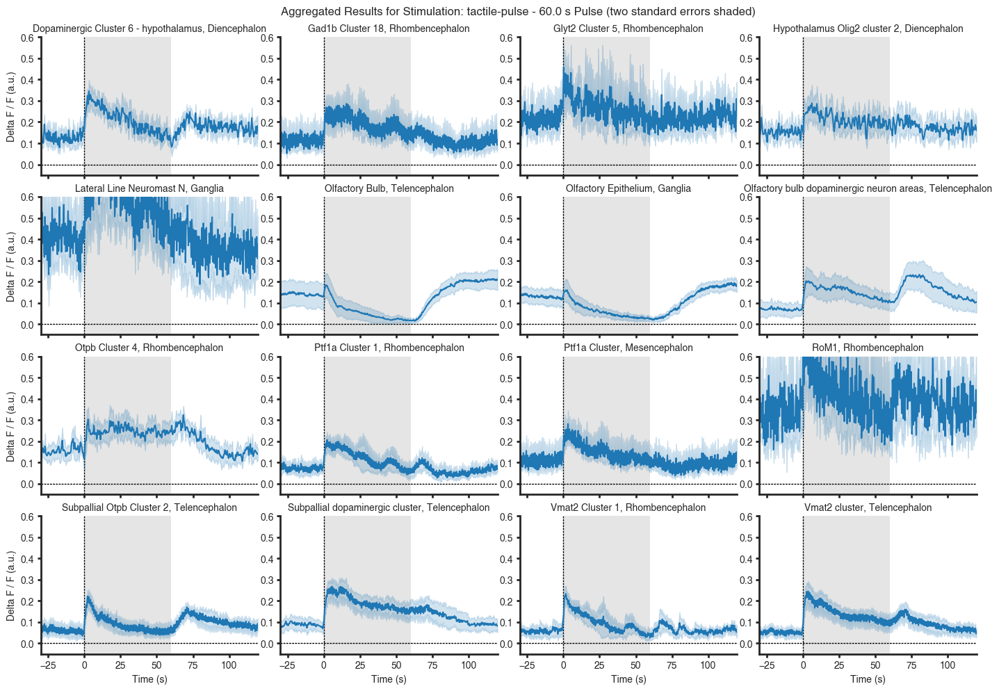

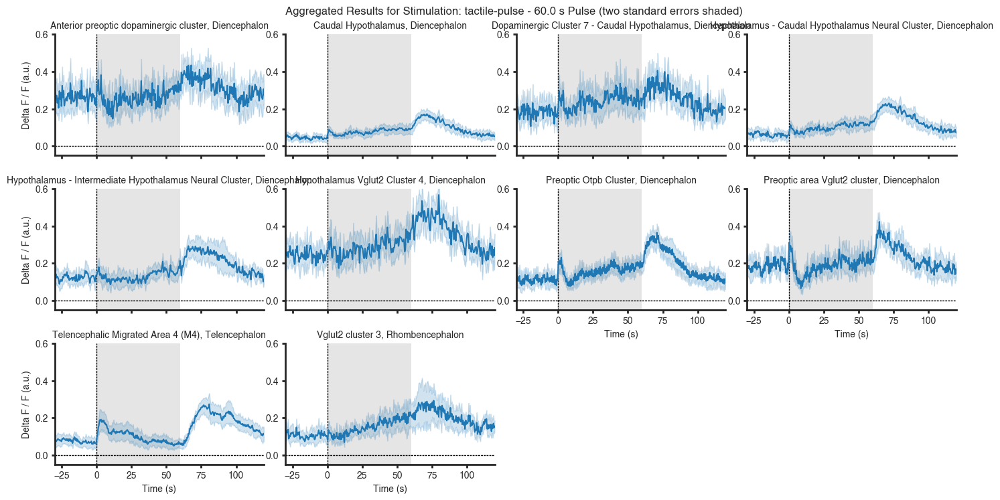

In [64]:
%matplotlib inline

for i, region_chunk in enumerate(chunks(subset[REGION_CN].unique(), 16)):
    # log.info(f'{region_chunk = }')
    
    subset_df = (
        stim_seq_df
        .loc[stim_seq_df[REGION_CN].isin(region_chunk), 
        :]
        .copy())
    
    subset_df['unique_timecourse_id'] = (
        subset_df[EXPERIMENT_ID_CN].astype(str) + '_' + 
        subset_df[RUN_ID_CN].astype(str) + '_' + 
        subset_df[STIM_STEP_INDEX_CN].astype(str))
    
    fig = sns.relplot(
        data=subset_df,
        x=TIME_CN,
        y=DF_BY_F_CN,
        col=REGION_CN,
        legend=False,
        col_wrap=4,
        kind='line',
        facet_kws={'sharey': False, 'sharex': True},
        errorbar=('se', 2),
        height=2.5,
        aspect=1.5)

    (fig
     .map(plt.axvline, x=0, color='k', dashes=(2, 1), linewidth=1, zorder=0)
     .map(plt.axhline, y=0, color='k', dashes=(2, 1), linewidth=1, zorder=0)
     .map(plt.fill_between, x=[0, stim_duration], y1=[-5, -5], y2=[5, 5], 
          color='k', alpha=0.1, linewidth=0, zorder=-1)
     .set_axis_labels('Time (s)', 'Delta F / F (a.u.)')
     .set_titles('{col_name}')
     .set(xlim=(-1 * time_pre_stim_start, time_post_stim_start),
          ylim=(-0.05, 0.6))
     .tight_layout(h_pad=0.5, w_pad=0.2, rect=(0, 0, 0.95, 0.98)))
    
    fig.fig.suptitle(f'Aggregated Results for Stimulation: '
                     f'{selected_stim_type} - {stim_duration} s Pulse '
                     f'(two standard errors shaded)', 
                     y=0.99)
    fig.figure.set(facecolor='white')
    
    # sns.despine(offset=2, trim=True)
    # save_path = os.path.join(multi_experiment_output_dir, 
    #                          'figures',
    #                          f'stimulation-{selected_stim_type}',
    #                          f'{selected_stim_type}_'
    #                          f'{stim_duration:.0f}s-pulse_'
    #                          f'{i:03d}-region-set_'
    #                          f'aggregated-results.png')
    # csutils.touchdir(os.path.dirname(save_path))
    # log.info(f'Saving figure to disk...')
    # fig.savefig(save_path, dpi=300)

## Plots For Figure

In [65]:
sns.color_palette('muted')

[(0.2823529411764706, 0.47058823529411764, 0.8156862745098039),
 (0.9333333333333333, 0.5215686274509804, 0.2901960784313726),
 (0.41568627450980394, 0.8, 0.39215686274509803),
 (0.8392156862745098, 0.37254901960784315, 0.37254901960784315),
 (0.5843137254901961, 0.4235294117647059, 0.7058823529411765),
 (0.5490196078431373, 0.3803921568627451, 0.23529411764705882),
 (0.8627450980392157, 0.49411764705882355, 0.7529411764705882),
 (0.4745098039215686, 0.4745098039215686, 0.4745098039215686),
 (0.8352941176470589, 0.7333333333333333, 0.403921568627451),
 (0.5098039215686274, 0.7764705882352941, 0.8862745098039215)]

### High-Low Timecourses

In [28]:
def activity_timecourses_overlay():
    figure, axs = plt.subplots(
        2, 1,
        figsize=(5, 6),
        gridspec_kw=dict(
            bottom=0.1, top=0.98,
            left=0.13, right=0.95,
        ),
    )
    
    palette = sns.color_palette([
        sns.color_palette('muted')[i]
        for i in [0, 1, 2, 5, 9, 3]])
    
    hue_order = []
    for v in chosen_regions.values():
        hue_order.extend(v)
    line_sets = []
    
    for i, regions in enumerate(chosen_regions.values()):
        ax = axs.flat[i]        
        
        subset_df = (
            stim_seq_df.loc[
                stim_seq_df[REGION_CN].isin(regions), 
                :]
            .copy())
        
        for region in regions:
            subsubset_df = (
                subset_df
                .loc[subset_df[REGION_CN] == region, :])
            exp_list = subsubset_df[[EXPERIMENT_ID_CN, RUN_ID_CN, STIM_STEP_INDEX_CN]]
            exp_list = exp_list.drop_duplicates()
            log.info(f'{region= }, {exp_list.shape = }')
        
        log.info(f'{subset_df[REGION_CN].unique() = }')
        
        subset_df['unique_timecourse_id'] = (
            subset_df[EXPERIMENT_ID_CN].astype(str) + '_' + 
            subset_df[RUN_ID_CN].astype(str) + '_' + 
            subset_df[STIM_STEP_INDEX_CN].astype(str))
        
        lines = sns.lineplot(
            data=subset_df,
            x=TIME_CN,
            y=DF_BY_F_CN,
            hue=REGION_CN,
            hue_order=hue_order,
            ax=axs[i],
            palette=palette,
            linewidth=2.5,
            errorbar=None,
            zorder=11)
        line_sets.append(lines)
        
        sns.lineplot(
            data=subset_df,
            x=TIME_CN,
            y=DF_BY_F_CN,
            hue=REGION_CN,
            hue_order=hue_order,
            style='unique_timecourse_id',
            dashes=False,
            ax=axs[i],
            palette=palette,
            linewidth=1,
            alpha=0.1,
            zorder=10,
            legend=False)
        
        ax.fill_between(
            x=[0, stim_duration], y1=[-5, -5], y2=[5, 5], 
            color='k', alpha=0.1, linewidth=0, zorder=0)
        ax.axhline(
            0, color='k', linestyle=':', linewidth=1, zorder=1,
            alpha=0.5)
        ax.axvline(
            0, color='k', linestyle=':', linewidth=1, zorder=1,
            alpha=0.5)
        
        ax.set(
            xticks=[-30, 0, 60, 120],
            yticks=[0, 0.2],
            yticklabels=['0', '20'],
            xlim=(-34, 120),
            ylim=(-0.02, 0.4))
        if i == 1:
            ax.set_xlabel('Time (s)', loc='left')
            ax.set_ylabel('$\mathdefault{\Delta F / F}$ (%)', loc='bottom')
        else:
            ax.set_xlabel('')
            ax.set_ylabel('')
        ax.legend().remove()
        sns.despine(
            ax=ax, trim=True, right=True, top=True)
        
    fig_key, axs = plt.subplots(2, 1)
    sns.set_palette(palette)
    axs.flat[0].legend(
        handles=line_sets[0].get_lines(),
        labels=hue_order[:3],
        loc='center',
        bbox_to_anchor=(0.5, 0.5),
        title_fontsize='large',
        fontsize='medium',
        ncol=1,
        frameon=False)
    
    axs.flat[1].legend(
        handles=line_sets[1].get_lines(),
        labels=hue_order[3:],
        loc='center',
        bbox_to_anchor=(0.5, 0.5),
        title_fontsize='large',
        fontsize='medium',
        ncol=1,
        frameon=False)
    
    yield 'cs-ii-29_activity-timecourses-overlay_KEY', fig_key
    yield 'cs-ii-29_activity-timecourses-overlay', figure


matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO : region= 'Olfactory Bulb, Telencephalon', exp_list.shape = (12, 3)
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO : region= 'Olfactory Epithelium, Ganglia', exp_list.shape = (12, 3)
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO : region= 'Subpallial dopaminergic cluster, Telencephalon', exp_list.shape = (12, 3)
local-nb_cs-ii-[29,33,34]_integration_figures (  37): INFO : subset_df[REGION_CN].unique() = array(['Olfactory Bulb, Telencephalon', 'Olfactory Epithelium, Ganglia',
       'Subpallial dopaminergic cluster, Telencephalon'], dtype=object)
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO : region= 'Caudal Hypothalamus, Diencephalon', exp_list.shape = (12, 3)
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO : region= 'Vglut2 cluster 3, Rhombencephalon', exp_list.shape = (1

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\isocteui.ttf', name='ISOCTEUR', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BELLI.TTF', name='Bell MT', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_B.TTF', name='Bodoni MT', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Advocate C45 Regular.ttf', name='Advocate C45', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Equity Text A Bold.ttf', name='Equit

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Advocate C53 Tab Bold.ttf', name='Advocate C53 Tab', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\MTCORSVA.TTF', name='Monotype Corsiva', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Concourse T8 Tab Regular.ttf', name='Concourse T8 Tab', style='normal', variant='normal', weight=800, stretch='normal', size='scalable')) = 10.43
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Advocate C65 Tab Regular.ttf', name='Advocate C65 Tab', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEn

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\mmrtextb.ttf', name='Myanmar Text', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Advocate C41 Bold.ttf', name='Advocate C41', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Advocate C43 Tab Regular.ttf', name='Advocate C43 Tab', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRSCRIPT.TTF', name='French Script MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Font

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\isoct3_IV50.ttf', name='ISOCT3', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\Advocate Slab C45 Mid Bold.ttf', name='Advocate Slab C45 Mid', style='normal', variant='normal', weight=600, stretch='normal', size='scalable')) = 10.24
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\BOD_R.TTF', name='Bodoni MT', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\FRAHVIT.TTF', name='Franklin Gothic Heavy', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='C:\\Windows\\Fonts\\GOTHI

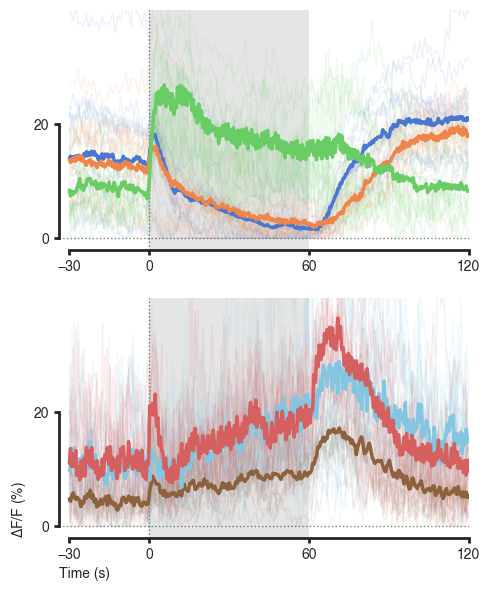

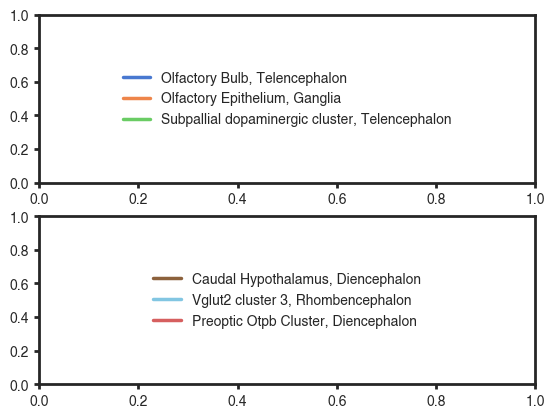

In [29]:
%matplotlib inline
for _, fig in activity_timecourses_overlay():
    fig.set(facecolor='white')

### Volcano of All Regions

In [26]:
def activity_stat_volcano():
    hue_order = []
    for v in chosen_regions.values():
        hue_order.extend(v)
    line_sets = []
    
    palette = sns.color_palette([
        sns.color_palette('muted')[i]
        for i in [0, 1, 2, 5, 9, 3]])
    
    figure, ax = plt.subplots(
        1, 1,
        figsize=(4, 6),
        gridspec_kw=dict(
            bottom=0.1, top=0.98,
            left=0.13, right=0.98,
        ),
    )
    
    no_pre_stim_filt = stats_comparison_df[TIME_BIN_CN] != '1:pre-stim'
    filt = ((stats_comparison_df['neg-log10-p'] > 2)
            & (stats_comparison_df['effect-size'].abs() > 0.1))
    
    stats_comparison_significant = (
        stats_comparison_df.loc[no_pre_stim_filt & filt, :]).copy()
    
    stats_comparison_insignificant = (
        stats_comparison_df.loc[~filt & no_pre_stim_filt, :]).copy()
    
    sns.scatterplot(
        ax=ax,
        data=stats_comparison_significant,
        x='effect-size',
        y='neg-log10-p',
        color='k',
        alpha=0.8,
        edgecolor='none',
        s=30)
    sns.scatterplot(
        ax=ax,
        data=stats_comparison_insignificant,
        x='effect-size',
        y='neg-log10-p',
        s=9,
        alpha=0.5,
        marker='o',
        facecolor='none',
        edgecolor='gray',
        linewidth=0.5)
    
    
    def replacer(val):
        return {
            '2:0-10s': 'early stim',
            '3:10-30s': 'mid stim',
            '4:30-60s': 'late stim',
            '5:post-stim 10s': 'early post',
            '6:post-stim 10-40s': 'late post'}[val]
    
    for i, region in enumerate(hue_order):
        filt = stats_comparison_significant[REGION_CN] == region
        subset = stats_comparison_significant.loc[filt, :]
        sns.scatterplot(
            ax=ax,
            data=subset,
            x='effect-size',
            y='neg-log10-p',
            s=300,
            marker='*',
            edgecolor='k',
            linewidth=0.5,
            color=palette[i])
        
        for row in subset.iterrows():
            is_neg_effect = row[1]['effect-size'] < 0
            if is_neg_effect:
                ha = 'right'
                offset_pos = [-45, 10]
            else:
                ha = 'left'
                offset_pos = [40, 25]
    
            logp_val = row[1]['neg-log10-p']
            if logp_val < 2.38:
                offset_pos[1] = -25
            elif 4.6 > logp_val > 3.5:
                offset_pos[1] = 10
            elif logp_val > 6.5:
                offset_pos[0] = 20
                offset_pos[1] = 35
    
            if i == 3:
                offset_pos[0] = -offset_pos[0]
                
            row[1][TIME_BIN_CN] = replacer(row[1][TIME_BIN_CN])
            
            ax.annotate(
                f'R{i + 1:d}\n{row[1][TIME_BIN_CN]}',
                (row[1]['effect-size'], row[1]['neg-log10-p']),
                xytext=offset_pos,
                textcoords='offset points',
                fontsize='small',
                color='k',
                ha='center',
                va='center',
                arrowprops=dict(
                    arrowstyle='->',
                    connectionstyle='arc3,rad=0.2',
                    color='k',
                    lw=1,
                    shrinkA=0,
                    shrinkB=9),
            )
    
    ax.axhline(
        2, color='k', linestyle=':', linewidth=1, zorder=0,
        alpha=0.5)
    ax.axvline(
        0.1, color='k', linestyle=':', linewidth=1, zorder=0,
        alpha=0.5)
    ax.axvline(
        -0.1, color='k', linestyle=':', linewidth=1, zorder=0,
        alpha=0.5)
    ax.set(
        xlabel='Effect Size (%)',
        ylabel=r'$\mathdefault{-\log_{10}\left(p\right)}$',
        xticks=[-0.2, -0.1, 0, 0.1, 0.2],
        xticklabels=['-20', '-10', '0', '10', '20'],
        yticks=[0, 2, 4, 6, 8],
        xlim=(-0.35, 0.35),
        ylim=(-0.1, 9))
    sns.despine(
        ax=ax, trim=True, right=True, top=True)
    
    yield 'cs-ii-29_activity-stat-volcano', figure

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.font_manager (1411): DEBUG : findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.33.
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-BoldOblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\

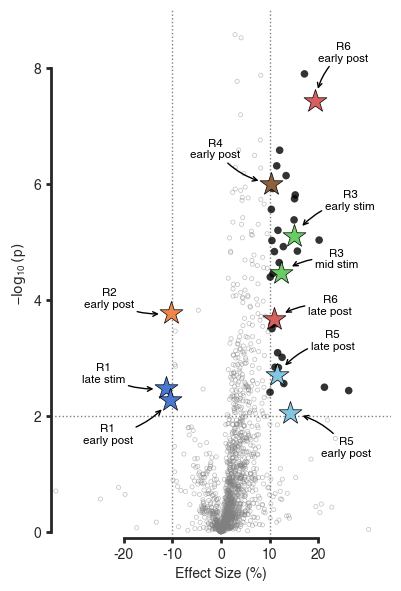

In [27]:
%matplotlib inline
for _, fig in activity_stat_volcano():
    fig.set(facecolor='white')

### Swim Bouts WRT Stimulus

In [28]:
swim_bout_stat_df.head()

,experiment-id,run-id,fish_id,bout_index,bout_timestamp,bout_framestamp,bout_duration,bout_max_curvature,bout_max_angle_range,bout_duration_ms,unique_run_id,count_col
0,cs-ii-29,395,cs-ii-29B,0,23.637,5623,0.210,0.029499,104.740924,210.0,cs-ii-29_395,1
1,cs-ii-29,395,cs-ii-29B,1,48.073,11463,0.250,0.097845,85.426512,250.0,cs-ii-29_395,1
2,cs-ii-29,395,cs-ii-29B,2,48.502,11566,0.288,0.197285,139.522245,288.0,cs-ii-29_395,1
3,cs-ii-29,395,cs-ii-29B,3,195.123,46548,0.198,0.035623,86.689587,198.0,cs-ii-29_395,1
4,cs-ii-29,396,cs-ii-29B,0,48.291,12067,0.370,0.029650,70.336598,370.0,cs-ii-29_396,1


In [29]:
stim_log_subset_df.head()

,description,duration_s,left,middle,right,flag,stim-type,actual-rel-start-time_s,experiment-id,run-id,stim-step-index
1,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,299.999816,cs-ii-29,395,1
3,pulse-2,60.0,NaN,fish water,NaN,False,tactile-pulse,480.001961,cs-ii-29,395,3
5,pulse-3,60.0,NaN,fish water,NaN,False,tactile-pulse,660.002661,cs-ii-29,395,5
8,pulse-1,60.0,NaN,fish water,NaN,False,tactile-pulse,299.999124,cs-ii-29,396,1
10,pulse-2,60.0,NaN,fish water,NaN,False,tactile-pulse,479.998784,cs-ii-29,396,3


In [30]:

bout_dfs = []
for row_index, stim_log_row in stim_log_subset_df.iterrows():
    log.info(f'{stim_log_row[EXPERIMENT_ID_CN] = }, {stim_log_row[RUN_ID_CN] = }')
    
    bout_subset_df = (
        swim_bout_stat_df.loc[
        (swim_bout_stat_df[EXPERIMENT_ID_CN] == stim_log_row[EXPERIMENT_ID_CN])
        & (swim_bout_stat_df[RUN_ID_CN] == stim_log_row[RUN_ID_CN]), 
        :]
        .copy())
    
    bout_subset_df[BOUT_TIMESTAMP_CN] = (
        bout_subset_df[BOUT_TIMESTAMP_CN]
        .sub(stim_log_row[REL_START_TIME_CN]))
    
    bout_subset_df = (
        bout_subset_df.loc[
        bout_subset_df[BOUT_TIMESTAMP_CN]
        .between(-1 * time_pre_stim_start, time_post_stim_start), 
        :])

    bout_subset_df[STIM_STEP_INDEX_CN] = stim_log_row[STIM_STEP_INDEX_CN]
    bout_subset_df[STIM_TYPE_CN] = stim_log_row[STIM_TYPE_CN]
    bout_dfs.append(bout_subset_df)
    
stim_sync_bout_df = pd.concat(bout_dfs, axis=0, ignore_index=True)
stim_sync_bout_df.info()
stim_sync_bout_df

local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 395
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 395
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 395
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 396
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 396
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 396
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-29', stim_log_row[RUN_ID_CN] = 398
local-nb_cs-ii-[29,33,34]_integration_figures ( 

,experiment-id,run-id,fish_id,bout_index,bout_timestamp,bout_framestamp,bout_duration,bout_max_curvature,bout_max_angle_range,bout_duration_ms,unique_run_id,count_col,stim-step-index,stim-type
0,cs-ii-29,396,cs-ii-29B,2,89.940876,97421,0.272,0.028922,141.057701,272.0,cs-ii-29_396,1,1,tactile-pulse
1,cs-ii-29,396,cs-ii-29B,3,90.423876,97541,0.302,0.537921,190.263882,302.0,cs-ii-29_396,1,1,tactile-pulse
2,cs-ii-29,396,cs-ii-29B,4,79.683216,139835,0.504,0.738810,172.935430,504.0,cs-ii-29_396,1,3,tactile-pulse
3,cs-ii-29,396,cs-ii-29B,5,80.295216,139988,0.188,0.043698,86.039635,188.0,cs-ii-29_396,1,3,tactile-pulse
4,cs-ii-29,396,cs-ii-29B,6,80.763216,140104,0.268,0.090186,181.708246,268.0,cs-ii-29_396,1,3,tactile-pulse
5,cs-ii-29,396,cs-ii-29B,7,0.559082,165038,0.330,0.049422,121.382179,330.0,cs-ii-29_396,1,5,tactile-pulse
6,cs-ii-29,396,cs-ii-29B,8,42.781082,175588,0.402,0.613232,148.610298,402.0,cs-ii-29_396,1,5,tactile-pulse
7,cs-ii-29,396,cs-ii-29B,9,63.182082,180686,0.320,0.030229,123.662103,320.0,cs-ii-29_396,1,5,tactile-pulse
8,cs-ii-29,396,cs-ii-29B,10,63.866082,180857,0.200,0.038326,94.773539,200.0,cs-ii-29_396,1,5,tactile-pulse
9,cs-ii-29,396,cs-ii-29B,11,64.737082,181074,0.178,0.022466,73.481497,178.0,cs-ii-29_396,1,5,tactile-pulse


In [31]:


def swim_bout_timing():    
    fig, ax = plt.subplots(
        1, 1,
        figsize=(5, 1.8),
        gridspec_kw=dict(
            bottom=0.25, top=0.98,
            left=0.13, right=0.95,
        ),
    )
    
    sns_cmap = sns.color_palette('crest', as_cmap=True)
    
    sns.swarmplot(
        ax=ax,
        data=stim_sync_bout_df,
        x=BOUT_TIMESTAMP_CN,
        hue=BOUT_MAX_ANGLE_CN,
        palette=sns_cmap,
        size=14,
        edgecolor='none',
        linewidth=0,
        legend=False)
    
    ax.set_ylim(*ax.get_ylim())
    ax.fill_between(
        x=[0, stim_duration], y1=[-5, -5], y2=[5, 5], 
        color='k', alpha=0.1, linewidth=0, zorder=0)
    ax.axvline(
        0, color='k', linestyle=':', linewidth=1, zorder=1,
        alpha=0.5)
    
    ax.set(
        xticks=[-30, 0, 60, 120],
        yticks=[],
        xlim=(-34, 120))
    ax.set_xlabel('Time (s)', loc='left')
    sns.despine(
        ax=ax, trim=True, right=True, top=True, left=True)
    
    cax = fig.add_axes([.02, .25, .02, .65])
    cmap = mpl.cm.ScalarMappable(
        norm=mpl.colors.Normalize(vmin=30, vmax=185),
        cmap=sns_cmap,)
    cb = fig.colorbar(
        cmap,
        cax=cax, 
        orientation='vertical', 
        ticks=[45, 180],
        drawedges=False,
        label='Bout Angle Range ($\mathdefault{\degree}$)')        
    cb.outline.set_visible(False)
    sns.despine(
        ax=cax, 
        left=True, right=True, top=True, bottom=True)
    
    plt.show()
    yield 'cs-ii-29_swim-bout-timing', fig

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.FixedLocator object at 0x0000025BC73CFFA0>


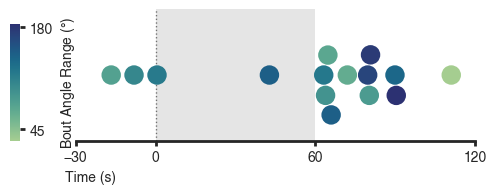

In [32]:
%matplotlib inline
for _, fig in swim_bout_timing():
    fig.set(facecolor='white')
    plt.show()

### Tail Movement Statistics

In [33]:
intervals = pd.IntervalIndex.from_tuples(
    [(-30, -1), (1, 30), (61, 90)],
    closed='both')

stim_sync_bout_df['time-interval'] = (
    pd.cut(
        stim_sync_bout_df[BOUT_TIMESTAMP_CN],
        bins=intervals))

stim_sync_bout_df

,experiment-id,run-id,fish_id,bout_index,bout_timestamp,bout_framestamp,bout_duration,bout_max_curvature,bout_max_angle_range,bout_duration_ms,unique_run_id,count_col,stim-step-index,stim-type,time-interval
0,cs-ii-29,396,cs-ii-29B,2,89.940876,97421,0.272,0.028922,141.057701,272.0,cs-ii-29_396,1,1,tactile-pulse,"[61.0, 90.0]"
1,cs-ii-29,396,cs-ii-29B,3,90.423876,97541,0.302,0.537921,190.263882,302.0,cs-ii-29_396,1,1,tactile-pulse,NaN
2,cs-ii-29,396,cs-ii-29B,4,79.683216,139835,0.504,0.738810,172.935430,504.0,cs-ii-29_396,1,3,tactile-pulse,"[61.0, 90.0]"
3,cs-ii-29,396,cs-ii-29B,5,80.295216,139988,0.188,0.043698,86.039635,188.0,cs-ii-29_396,1,3,tactile-pulse,"[61.0, 90.0]"
4,cs-ii-29,396,cs-ii-29B,6,80.763216,140104,0.268,0.090186,181.708246,268.0,cs-ii-29_396,1,3,tactile-pulse,"[61.0, 90.0]"
5,cs-ii-29,396,cs-ii-29B,7,0.559082,165038,0.330,0.049422,121.382179,330.0,cs-ii-29_396,1,5,tactile-pulse,NaN
6,cs-ii-29,396,cs-ii-29B,8,42.781082,175588,0.402,0.613232,148.610298,402.0,cs-ii-29_396,1,5,tactile-pulse,NaN
7,cs-ii-29,396,cs-ii-29B,9,63.182082,180686,0.320,0.030229,123.662103,320.0,cs-ii-29_396,1,5,tactile-pulse,"[61.0, 90.0]"
8,cs-ii-29,396,cs-ii-29B,10,63.866082,180857,0.200,0.038326,94.773539,200.0,cs-ii-29_396,1,5,tactile-pulse,"[61.0, 90.0]"
9,cs-ii-29,396,cs-ii-29B,11,64.737082,181074,0.178,0.022466,73.481497,178.0,cs-ii-29_396,1,5,tactile-pulse,"[61.0, 90.0]"


In [34]:
agg_sync_bout_df = (
    stim_sync_bout_df
    .groupby(
        [UNIQUE_RUN_ID_CN, STIM_STEP_INDEX_CN, 'time-interval'],
        observed=True)
    .agg({BOUT_INDEX_CN: 'count'})
    .reset_index())

time_intervals = agg_sync_bout_df['time-interval'].unique()

ref_interval = time_intervals[0]
ref_subset = agg_sync_bout_df.loc[
        agg_sync_bout_df['time-interval'] == ref_interval, :]

output_results = []
for time_interval in time_intervals:
    subset = agg_sync_bout_df.loc[
        agg_sync_bout_df['time-interval'] == time_interval, :]

    stats_result = scipy.stats.ttest_ind(
        subset[BOUT_INDEX_CN], ref_subset[BOUT_INDEX_CN], equal_var=False)
    
    output_results.append({
        'time-interval': time_interval,
        't-statistic': stats_result.statistic,
        'p-value': stats_result.pvalue,
        'avg-bout-count': np.mean(subset[BOUT_INDEX_CN]),
        'effect-size': np.mean(subset[BOUT_INDEX_CN]) - np.mean(ref_subset[BOUT_INDEX_CN]),
        'with-respect-to': ref_interval})
    
tail_movement_stats_df = pd.DataFrame(output_results)
tail_movement_stats_df

I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\scipy\stats\_axis_nan_policy.py:531: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



,time-interval,t-statistic,p-value,avg-bout-count,effect-size,with-respect-to
0,"[61, 90]",0.000000,1.000000,3.0,0.0,"[61, 90]"
1,"[-30, -1]",-1.732051,0.225403,1.0,-2.0,"[61, 90]"


In [35]:
def swim_bout_barplot():
    figure, ax = plt.subplots(
        1, 1,
        figsize=(4, 1.8),
        gridspec_kw=dict(
            bottom=0.15, top=0.95,
            left=0.13, right=0.95,
        ),
    )
    
    sns.barplot(
        ax=ax,
        data=tail_movement_stats_df,
        x='time-interval',
        y='avg-bout-count',
        color='gray',
        edgecolor='k',
        linewidth=1)
    sns.swarmplot(
        ax=ax,
        data=agg_sync_bout_df,
        x='time-interval',
        y=BOUT_INDEX_CN,
        color='w',
        size=10,
        edgecolor='k',
        linewidth=1,
        alpha=0.8)
    ax.axvline(
        .5, color='k', linestyle=':', linewidth=1, alpha=0.5)
    
    ax.set(
        xticks=[0, 1, 2],
        xticklabels=[
            'Pre Stim', 
            'Stim', 
            'Post Stim End'],
        xlabel='',
        ylabel='Swim Bout Count',
        ylim=(-0.4, 5.5))
    sns.despine(
        ax=ax, trim=True, right=True, top=True)
    
    yield 'cs-ii-29_swim-bout-count', figure

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.


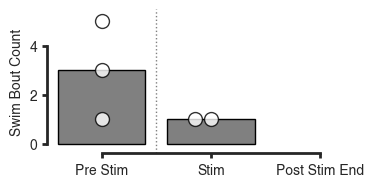

In [36]:
%matplotlib inline
for _, fig in swim_bout_barplot():
    fig.set(facecolor='white')
    plt.show()

### Correlation Figure

In [66]:
agg_brain_timecourses_df = (
    stim_seq_df
    .pivot_table(
        index=TIME_CN,
        columns=REGION_CN,
        values=DF_BY_F_CN,
        aggfunc='mean'))

agg_brain_timecourses_df = (
    agg_brain_timecourses_df
    .div(agg_brain_timecourses_df.values.max(axis=0)))

agg_brain_timecourses_df.head()

region,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon","6.7FDhcrtR-Gal4 Cluster 2 Sparse, Rhombencephalon","6.7FDhcrtR-Gal4 Cluster 3, Rhombencephalon","6.7FDhcrtR-Gal4 Cluster 4, Rhombencephalon","6.7FDhcrtR-Gal4 Cluster 5, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 1, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 2, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 3, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 4, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe, Spinal Cord",...,"Vmat2 Cluster 4, Rhombencephalon","Vmat2 Cluster 5, Rhombencephalon","Vmat2 Stripe1, Rhombencephalon","Vmat2 Stripe1, Spinal Cord","Vmat2 Stripe2, Rhombencephalon","Vmat2 Stripe3, Rhombencephalon","Vmat2 cluster of paraventricular organ, Mesencephalon","Vmat2 cluster, Telencephalon","Vmat2 cluster2, Mesencephalon","X Vagus motorneuron cluster, Rhombencephalon"
time,,,,,,,,,,,,,,,,,,,,,
-30.0,0.317212,0.357969,0.694231,0.725606,0.365335,0.331713,0.417695,0.437835,0.515827,0.263882,...,0.425515,0.331602,0.350392,0.180085,0.318252,0.324220,0.516327,0.229133,0.313737,0.235842
-29.8,0.382599,0.546775,0.704134,0.624178,0.478701,0.442806,0.585056,0.427519,0.364640,0.375384,...,0.547566,0.442736,0.453062,0.298973,0.296518,0.341219,0.432640,0.180075,0.362783,0.321671
-29.6,0.432275,0.669365,0.717477,0.567298,0.562430,0.519172,0.707461,0.450338,0.274044,0.461542,...,0.639677,0.540597,0.525521,0.392893,0.285234,0.370334,0.384760,0.156560,0.403365,0.390156
-29.4,0.384176,0.494971,0.754062,0.639695,0.476915,0.413258,0.588067,0.418178,0.399108,0.365336,...,0.583195,0.451571,0.449534,0.271623,0.315175,0.376942,0.414435,0.192718,0.352858,0.323584
-29.2,0.340351,0.307508,0.814347,0.718687,0.388443,0.309670,0.465482,0.416383,0.564039,0.261200,...,0.518460,0.359593,0.364379,0.145632,0.354600,0.384680,0.453537,0.238690,0.314662,0.249448


#### Get Anteroposterio Color

In [67]:
anteroposterior_series = (
    activity_traces_df
    .groupby(REGION_CN, observed=True)
    [AP_POS_CN]
    .mean())

anteroposterior_series = (
    anteroposterior_series[agg_brain_timecourses_df.columns])

rename_dict = {
    'Neurons with descending projections labelled by spinal backfills, Spinal Cord':
    'Spinal backfill, Spinal Cord',}
agg_brain_timecourses_df.rename(columns=rename_dict, inplace=True)
anteroposterior_series.rename(index=rename_dict, inplace=True)

resorted_regions = anteroposterior_series.sort_values().index

min_val = anteroposterior_series.min()
max_val = anteroposterior_series.max()

cmap = mpl.cm.ScalarMappable(
    norm=mpl.colors.Normalize(vmin=min_val, vmax=max_val),
    cmap='turbo')

color_series = anteroposterior_series.apply(cmap.to_rgba)
color_series

region
6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon               (0.96049, 0.77181, 0.22811, 1.0)
6.7FDhcrtR-Gal4 Cluster 2 Sparse, Rhombencephalon         (0.89112, 0.85826, 0.2188, 1.0)
6.7FDhcrtR-Gal4 Cluster 3, Rhombencephalon               (0.99535, 0.65341, 0.19577, 1.0)
6.7FDhcrtR-Gal4 Cluster 4, Rhombencephalon               (0.99672, 0.60977, 0.17842, 1.0)
6.7FDhcrtR-Gal4 Cluster 5, Rhombencephalon               (0.99419, 0.56386, 0.15918, 1.0)
                                                                       ...               
Vmat2 Stripe3, Rhombencephalon                            (0.9859, 0.50479, 0.13367, 1.0)
Vmat2 cluster of paraventricular organ, Mesencephalon    (0.18491, 0.94484, 0.60713, 1.0)
Vmat2 cluster, Telencephalon                             (0.27691, 0.44145, 0.91328, 1.0)
Vmat2 cluster2, Mesencephalon                            (0.10738, 0.81381, 0.83484, 1.0)
X Vagus motorneuron cluster, Rhombencephalon             (0.95398, 0.38836, 0.08362, 1.0)
Nam

In [78]:
linkage = scipy.cluster.hierarchy.linkage(
    agg_brain_timecourses_df.T,
    method='average',
    metric='correlation',
    optimal_ordering=False)

linkage

array([[1.80000000e+01, 8.20000000e+01, 1.03738021e-02, 2.00000000e+00],
       [2.14000000e+02, 2.15000000e+02, 1.35580190e-02, 2.00000000e+00],
       [1.66000000e+02, 1.75000000e+02, 1.50636333e-02, 2.00000000e+00],
       ...,
       [5.53000000e+02, 5.61000000e+02, 9.81992872e-01, 2.79000000e+02],
       [1.17000000e+02, 5.62000000e+02, 1.00932049e+00, 2.80000000e+02],
       [5.60000000e+02, 5.63000000e+02, 1.01970116e+00, 2.83000000e+02]])

In [99]:
clustergrid = sns.clustermap(
        agg_brain_timecourses_df.T,
        row_linkage=linkage,
        col_cluster=False,
        row_cluster=True)

list_of_rows = clustergrid.dendrogram_row.reordered_ind
start = 61
end = start + 16
select = list_of_rows[start:end]
regions_1 = (
    agg_brain_timecourses_df
    .T
    .index[select]
    .to_frame()
    .reset_index(drop=True))

styler = (
    regions_1
    .style
    .relabel_index(['Region'], axis='columns')
    .format_index(lambda x: x + start, axis='index'))

styler.to_latex(
    buf=os.path.join(multi_experiment_output_dir, 'tables', 'clustered-regions-1.tex'),
    siunitx=True,
    hrules=True,
    caption='Correlated cluster of brain regions showing a marked increase in calcium activity at both stimulus onset and stimulus cessation.')

styler

matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x0000023712B2F490>


,Region
61,"Olig2 Cluster, Telencephalon"
62,"Subpallial Otpb strip, Telencephalon"
63,"Olfactory Bulb, Telencephalon"
64,"Olfactory Epithelium, Ganglia"
65,"Lobus caudalis cerebelli, Rhombencephalon"
66,Telencephalon
67,"Pallium, Telencephalon"
68,"Vglut2 rind, Telencephalon"
69,"Subpallial Otpb Cluster 2, Telencephalon"
70,"Subpallial Gad1b cluster, Telencephalon"


In [98]:
list_of_rows = clustergrid.dendrogram_row.reordered_ind
start = 212
end = start + 24
select = list_of_rows[start:end]
regions_2 = (
    agg_brain_timecourses_df
    .T
    .index[select]
    .to_frame()
    .reset_index(drop=True))

styler = (
    regions_2
    .style
    .relabel_index(['Region'], axis='columns')
    .format_index(lambda x: x + start, axis='index'))

styler.to_latex(
    buf=os.path.join(multi_experiment_output_dir, 'tables', 'clustered-regions-2.tex'),
    siunitx=True,
    hrules=True,
    caption='Correlated cluster of brain regions showing a synchronized pulsing calcium activity.')

styler

,Region
212,"Glyt2 Stripe 3, Rhombencephalon"
213,"Hypothalamus Gad1b Cluster 3 Sparse, Diencephalon"
214,"Hypothalamus Vglut2 Cluster 6, Diencephalon"
215,"Isl1 Stripe 1, Rhombencephalon"
216,"VII' Facial Motor and octavolateralis efferent neurons, Rhombencephalon"
217,"Gad1b Stripe 3, Rhombencephalon"
218,"Vglut2 Stripe 4, Rhombencephalon"
219,"Vmat2 Stripe3, Rhombencephalon"
220,"Ptf1a Stripe, Rhombencephalon"
221,"Gad1b Stripe 1, Rhombencephalon"


In [79]:
y_locs_for_dendrogram = (np.arange(agg_brain_timecourses_df.shape[1]) + 0.5) * 10
def subfig_clustermap_traces():
    linkage = scipy.cluster.hierarchy.linkage(
        agg_brain_timecourses_df.T,
        method='average',
        metric='correlation',
        optimal_ordering=False)

    clustergrid = sns.clustermap(
        agg_brain_timecourses_df.T,
        cmap='rocket',
        vmin=0,
        row_linkage=linkage,
        col_cluster=False,
        row_cluster=True,
        row_colors=color_series,
        figsize=(9.2, 7),
        yticklabels='auto',
        xticklabels=False)
    
    ax_hmap = clustergrid.ax_heatmap
    ax_row_dgram = clustergrid.ax_row_dendrogram
    
    log.info(f'{ax_hmap.get_xlim() = }')
    
    ax_hmap.set_xlabel('Time (s)')
    ax_hmap.tick_params(
        axis='y', 
        length=5,
        labelsize='small',
        width=0.5)
    ax_hmap.set_xticks([
        0., 
        750./150. * 30., 
        750./150. * 90., 
        750./150. * 150.])
    ax_hmap.set_xticklabels(['-30', '0', '60', '120'])
    ax_hmap.spines['bottom'].set_visible(True)
    
    log.info(f'{ax_hmap.get_xlim()}')
    
    plt.setp(ax_hmap.get_xticklabels(),
             rotation='horizontal',
             )
    
    plt.show()
    
    yield 'cs-ii-29_clustermap-traces', clustergrid.figure

In [80]:
%matplotlib qt
for _, fig in subfig_clustermap_traces():
    fig.set(facecolor='white')

matplotlib.pyplot ( 414): DEBUG : Loaded backend QtAgg version 5.15.4.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x00000235D0035FF0>
local-nb_cs-ii-[29,33,34]_integration_figures (  24): INFO : ax_hmap.get_xlim() = (0.0, 750.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  40): INFO : (0.0, 750.0)


In [41]:
def subfig_heatmap_traces():
    clustergrid = sns.clustermap(
        agg_brain_timecourses_df[resorted_regions].T,
        cmap='rocket',
        vmin=0,
        metric='correlation',
        col_cluster=False,
        row_cluster=False,
        row_colors=color_series[resorted_regions],
        figsize=(11, 15),
        yticklabels='auto',
        xticklabels=False)
    
    ax_hmap = clustergrid.ax_heatmap
    ax_row_dgram = clustergrid.ax_row_dendrogram
    
    log.info(f'{ax_hmap.get_xlim() = }')
    
    ax_hmap.set_xlabel('Time (s)')
    ax_hmap.tick_params(
        axis='y', 
        length=5,
        labelsize='small',
        width=0.5)
    ax_hmap.set_xticks([
        0., 
        750./150. * 30., 
        750./150. * 90., 
        750./150. * 150.])
    ax_hmap.set_xticklabels(['-30', '0', '60', '120'])
    ax_hmap.spines['bottom'].set_visible(True)
    
    log.info(f'{ax_hmap.get_xlim()}')
    
    plt.setp(ax_hmap.get_xticklabels(),
             rotation='horizontal',
             )
    
    plt.show()
    
    yield 'cs-ii-29_heatmap-traces', clustergrid.figure

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x0000025CDAC1B7C0>
local-nb_cs-ii-[29,33,34]_integration_figures (  17): INFO : ax_hmap.get_xlim() = (0.0, 750.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  33): INFO : (0.0, 750.0)


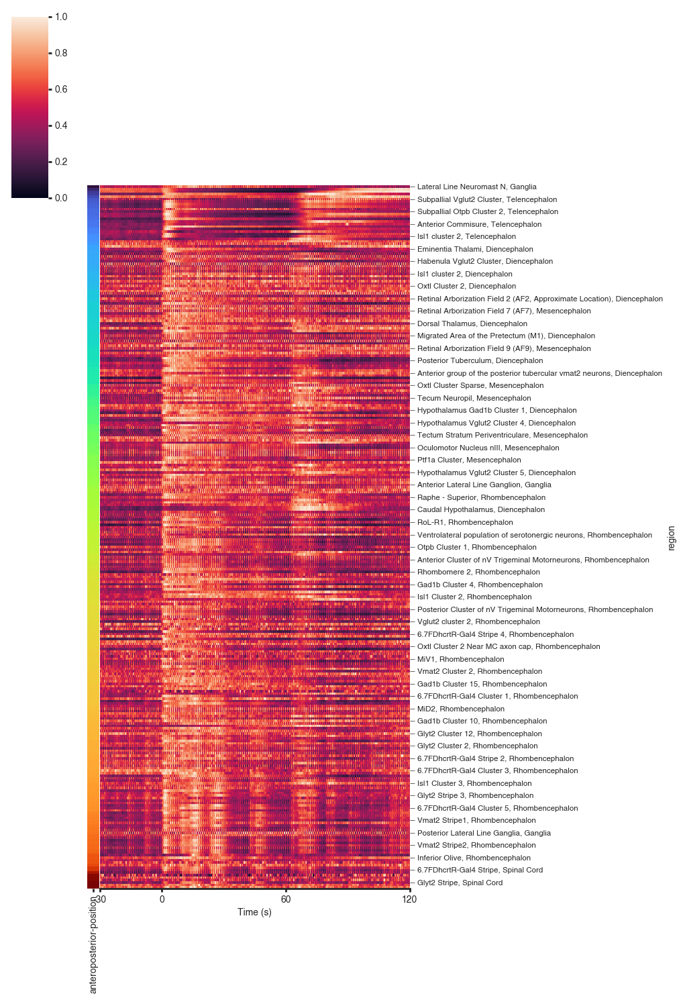

In [42]:
%matplotlib inline
for _, fig in subfig_heatmap_traces():
    fig.set(facecolor='white')

### Save Figures

local-nb_cs-ii-[29,33,34]_integration_figures (  30): INFO : subset_df[REGION_CN].unique() = array(['Olfactory Bulb, Telencephalon', 'Olfactory Epithelium, Ganglia',
       'Subpallial dopaminergic cluster, Telencephalon'], dtype=object)
local-nb_cs-ii-[29,33,34]_integration_figures (  30): INFO : subset_df[REGION_CN].unique() = array(['Caudal Hypothalamus, Diencephalon',
       'Preoptic Otpb Cluster, Diencephalon',
       'Vglut2 cluster 3, Rhombencephalon'], dtype=object)
matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Font

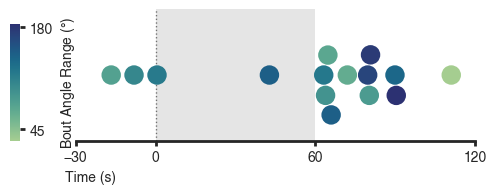

matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x0000025BC73F53F0>


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



local-nb_cs-ii-[29,33,34]_integration_figures (  18): INFO : ax_hmap.get_xlim() = (0.0, 750.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  34): INFO : (0.0, 750.0)


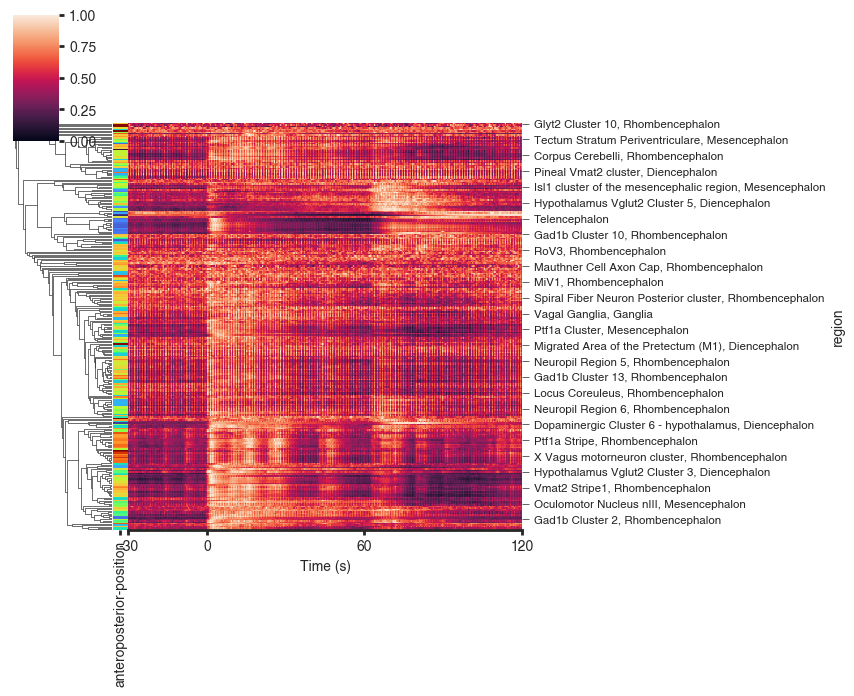

matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x0000025C38EE0520>
local-nb_cs-ii-[29,33,34]_integration_figures (  17): INFO : ax_hmap.get_xlim() = (0.0, 750.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  33): INFO : (0.0, 750.0)


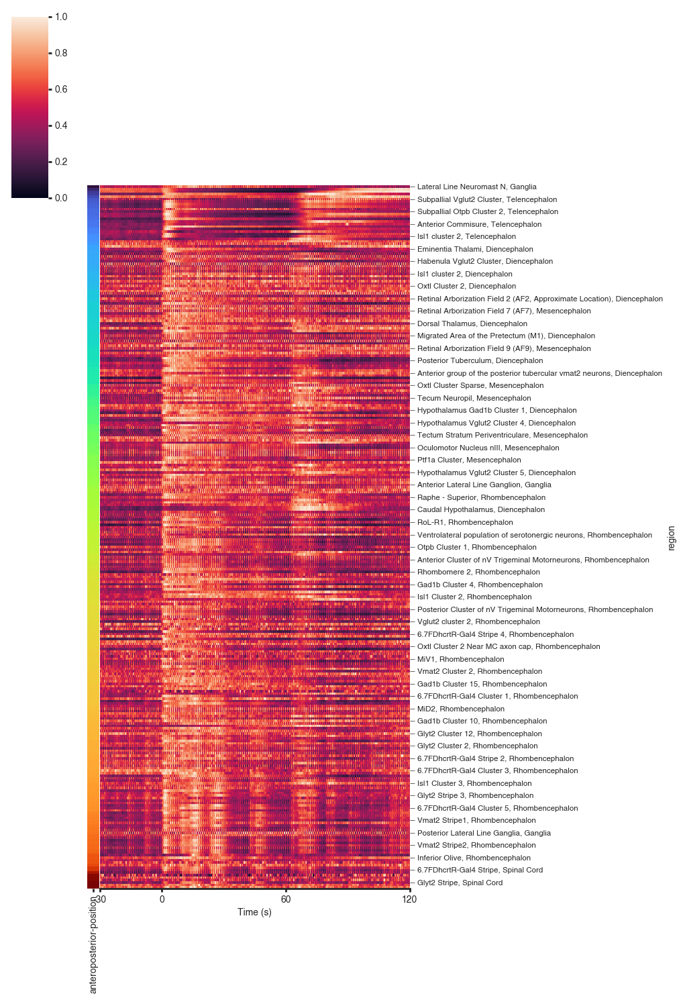

matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.


In [43]:
all_subfigs = it.chain(
    activity_timecourses_overlay(),
    activity_stat_volcano(),
    swim_bout_timing(),
    swim_bout_barplot(),
    subfig_clustermap_traces(),
    subfig_heatmap_traces())

output_dir = os.path.join(multi_experiment_output_dir,
                          'cs-ii-29_integrated-analysis-figures')
csutils.touchdir(output_dir)

overwrite = True  # <<<<<<<<<<<<<<< FALSE (only change temporarily)

for fig_name, fig in all_subfigs:
    for ext in ('png', 'pdf'):
        fig_path = os.path.join(
            output_dir, 
            f'{ext.upper()}s', 
            f'{fig_name}.{ext}')
        csutils.touchdir(os.path.dirname(fig_path))
        if not os.path.exists(fig_path) or overwrite:
            fig.savefig(
                fig_path, dpi=300,
                bbox_inches='tight', pad_inches=0.25)
    plt.close(fig)

# Generating Plots for Neural Responses to Control, AA, and Cadaverine Stimulation
## Data Wrangling
### Stimulus Log Subset

In [15]:
selected_stim_types = ['control', 'cdv-2mM', 'aa-1.3mM']
duration_selections = [10., 30., 40.]
row_select = (
    stimulation_log_df[STIM_DURATION_CN].isin(duration_selections)
    & stimulation_log_df[STIM_TYPE_CN].isin(selected_stim_types)
)
stim_log_subset_df: pd.DataFrame = (
    stimulation_log_df.loc[row_select, :]
    .reset_index(drop=True)
    .copy())
stim_log_subset_df.info()
stim_log_subset_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   description              60 non-null     object  
 1   duration_s               60 non-null     float64 
 2   left                     60 non-null     category
 3   middle                   60 non-null     category
 4   right                    60 non-null     category
 5   flag                     60 non-null     bool    
 6   stim-type                60 non-null     category
 7   actual-rel-start-time_s  60 non-null     float64 
 8   experiment-id            60 non-null     category
 9   run-id                   60 non-null     category
 10  stim-step-index          60 non-null     int64   
dtypes: bool(1), category(6), float64(2), int64(1), object(1)
memory usage: 4.2+ KB


,description,duration_s,left,middle,right,flag,stim-type,actual-rel-start-time_s,experiment-id,run-id,stim-step-index
0,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,668.007909,cs-ii-33,188,16
1,aa sustain,30.0,amino acid (1.3 mM),fish water,amino acid (1.3 mM),False,aa-1.3mM,818.009439,cs-ii-33,188,18
2,aa sustain,30.0,amino acid (1.3 mM),fish water,amino acid (1.3 mM),False,aa-1.3mM,968.010798,cs-ii-33,188,20
3,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,1118.010576,cs-ii-33,188,22
4,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,668.003620,cs-ii-33,189,16


### Add Stimulation Direction Column

In [16]:
SPATIAL_LAYOUT_CN = 'stimulus-direction'
stim_log_subset_df[SPATIAL_LAYOUT_CN] = (
    (stim_log_subset_df[MANIFOLD_LEFT_CN] != 'fish water') * 1
    + (stim_log_subset_df[MANIFOLD_RIGHT_CN] != 'fish water') * 2)
stim_log_subset_df[SPATIAL_LAYOUT_CN] = (
    stim_log_subset_df[SPATIAL_LAYOUT_CN]
    .astype(CategoricalDtype(categories=[1, 2, 3]))
    .cat.rename_categories(['left', 'right', 'both']))

stim_log_subset_df.info()
stim_log_subset_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   description              60 non-null     object  
 1   duration_s               60 non-null     float64 
 2   left                     60 non-null     category
 3   middle                   60 non-null     category
 4   right                    60 non-null     category
 5   flag                     60 non-null     bool    
 6   stim-type                60 non-null     category
 7   actual-rel-start-time_s  60 non-null     float64 
 8   experiment-id            60 non-null     category
 9   run-id                   60 non-null     category
 10  stim-step-index          60 non-null     int64   
 11  stimulus-direction       60 non-null     category
dtypes: bool(1), category(7), float64(2), int64(1), object(1)
memory usage: 4.4+ KB


,description,duration_s,left,middle,right,flag,stim-type,actual-rel-start-time_s,experiment-id,run-id,stim-step-index,stimulus-direction
0,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,668.007909,cs-ii-33,188,16,both
1,aa sustain,30.0,amino acid (1.3 mM),fish water,amino acid (1.3 mM),False,aa-1.3mM,818.009439,cs-ii-33,188,18,both
2,aa sustain,30.0,amino acid (1.3 mM),fish water,amino acid (1.3 mM),False,aa-1.3mM,968.010798,cs-ii-33,188,20,both
3,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,1118.010576,cs-ii-33,188,22,both
4,cadaverine sustain,30.0,cadaverine (2 mM),fish water,cadaverine (2 mM),False,cdv-2mM,668.003620,cs-ii-33,189,16,both


In [17]:
unique_stim_durations_dict = dict()
for stim_type in selected_stim_types:
    unique_stim_durations_dict[stim_type] = (
        stim_log_subset_df
        .loc[stim_log_subset_df[STIM_TYPE_CN] == stim_type, STIM_DURATION_CN]
        .unique())

unique_stim_durations_dict

{'control': array([10., 40.]),
 'cdv-2mM': array([30., 10., 40.]),
 'aa-1.3mM': array([30., 10., 40.])}

### Generate Stimulus-Synchronized Activity Traces

In [18]:
REF_STIM_TIME = 30
time_pre_stim_start = 30
time_post_stim = 60

time_post_stim_start = REF_STIM_TIME + time_post_stim
ref_time_array = np.arange(
    -1 * time_pre_stim_start, 
    time_post_stim_start, 
    MASTER_SAMPLING_PITCH_SEC)
ref_time_index = pd.Index(ref_time_array, name=TIME_CN)

stim_seq_dfs = []
for _, stim_loc_row in stim_log_subset_df.iterrows():
    log.info(
        f'** {stim_loc_row[EXPERIMENT_ID_CN]}'
        f'-{stim_loc_row[RUN_ID_CN]}, '
        f'{stim_loc_row[STIM_TYPE_CN]} '
        f'on {stim_loc_row[SPATIAL_LAYOUT_CN]} side(s) '
        f'for {stim_loc_row[STIM_DURATION_CN]} s **')
    
    row_select = (
        (multi_exp_df_by_f[EXPERIMENT_ID_CN] == stim_loc_row[EXPERIMENT_ID_CN])
        & (multi_exp_df_by_f[RUN_ID_CN] == stim_loc_row[RUN_ID_CN]))
    
    if not row_select.any():
        log.debug(' >>> No data for this experiment-run combination.')
        continue
    
    activity_traces_subset_df: pd.DataFrame = (
        multi_exp_df_by_f.loc[row_select, :]
        .copy())    
    
    activity_traces_subset_df[TIME_CN] = (
        activity_traces_subset_df[TIME_CN]
        .sub(stim_loc_row[REL_START_TIME_CN]))
    
    stim_duration = stim_loc_row[STIM_DURATION_CN]            
    actual_end_time = stim_duration + time_post_stim
    
    row_select = (
        activity_traces_subset_df[TIME_CN]
        .between(-1 * (2 + time_pre_stim_start), 2 + actual_end_time))
    activity_traces_subset_df = activity_traces_subset_df.loc[row_select, :]
    
    # fictive time remapping to `REF_STIM_TIME` length stim
    if stim_duration > REF_STIM_TIME:
        drop_select = (
            activity_traces_subset_df[TIME_CN]
            .between(REF_STIM_TIME, stim_duration, inclusive='right'))
        log.info(
            ' >>> Dropping {:d} time points after REF_STIM_TIME on '
            '[{:.1f}, {:.1f}).', 
            drop_select.sum(), REF_STIM_TIME, stim_duration)
        activity_traces_subset_df = (
            activity_traces_subset_df.loc[~drop_select, :])
    
    row_select = (
        activity_traces_subset_df[TIME_CN]
        .gt(stim_duration))
    activity_traces_subset_df.loc[row_select, TIME_CN] = (
        activity_traces_subset_df.loc[row_select, TIME_CN]
        .sub(stim_duration)
        .add(REF_STIM_TIME))
    
    activity_traces_subset_data = activity_traces_subset_df.pivot(
        index=TIME_CN,
        columns=[REGION_CN, LAT_SIDE_CN, EXPERIMENT_ID_CN, RUN_ID_CN],
        values=DF_BY_F_CN)     
    
    # reindexing with a tolerance such that there should be a hole in the 
    # data if REF_STIM_TIME > stim_duration
    activity_traces_subset_data = (
        activity_traces_subset_data
        .reindex(
            index=ref_time_index, 
            method='nearest', 
            tolerance=(MASTER_SAMPLING_PITCH_SEC * 2)))                
    
    if activity_traces_subset_data.empty:
        log.info(' >>> No data after subsampling and reindexing time.')
        continue
        
    log.info(' >>> {:d} missing time points in resampled timeseries.', 
             activity_traces_subset_data.iloc[:, 0].isna().sum())    
    
    # make filtered data back into dataframe
    filt_activity_traces_subset_df = (
        activity_traces_subset_data
        .melt(value_name=DF_BY_F_CN, ignore_index=False)
        .reset_index())
    filt_activity_traces_subset_df[SPATIAL_LAYOUT_CN] = stim_loc_row[SPATIAL_LAYOUT_CN]
    filt_activity_traces_subset_df[STIM_TYPE_CN] = stim_loc_row[STIM_TYPE_CN]
    filt_activity_traces_subset_df[STIM_DURATION_CN] = stim_loc_row[STIM_DURATION_CN]
    filt_activity_traces_subset_df[STIM_STEP_INDEX_CN] = stim_loc_row[STIM_STEP_INDEX_CN]
    
    stim_seq_dfs.append(filt_activity_traces_subset_df)
    
stim_seq_df = pd.concat(stim_seq_dfs, axis=0, ignore_index=True)

stim_seq_df.info()
stim_seq_df.head()

local-nb_cs-ii-[29,33,34]_integration_figures (  14): INFO : ** cs-ii-33-188, cdv-2mM on both side(s) for 30.0 s **
local-nb_cs-ii-[29,33,34]_integration_figures (  26): DEBUG :  >>> No data for this experiment-run combination.
local-nb_cs-ii-[29,33,34]_integration_figures (  14): INFO : ** cs-ii-33-188, aa-1.3mM on both side(s) for 30.0 s **
local-nb_cs-ii-[29,33,34]_integration_figures (  26): DEBUG :  >>> No data for this experiment-run combination.
local-nb_cs-ii-[29,33,34]_integration_figures (  14): INFO : ** cs-ii-33-188, aa-1.3mM on both side(s) for 30.0 s **
local-nb_cs-ii-[29,33,34]_integration_figures (  26): DEBUG :  >>> No data for this experiment-run combination.
local-nb_cs-ii-[29,33,34]_integration_figures (  14): INFO : ** cs-ii-33-188, cdv-2mM on both side(s) for 30.0 s **
local-nb_cs-ii-[29,33,34]_integration_figures (  26): DEBUG :  >>> No data for this experiment-run combination.
local-nb_cs-ii-[29,33,34]_integration_figures (  14): INFO : ** cs-ii-33-189, cdv-2mM 

,time,region,lateral-side,experiment-id,run-id,delta-f-over-f,stimulus-direction,stim-type,duration_s,stim-step-index
0,-30.0,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,1.150050,both,cdv-2mM,30.0,16
1,-29.8,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.961090,both,cdv-2mM,30.0,16
2,-29.6,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.772131,both,cdv-2mM,30.0,16
3,-29.4,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.583172,both,cdv-2mM,30.0,16
4,-29.2,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.381100,both,cdv-2mM,30.0,16


In [19]:
stim_info_col_names = [
    STIM_TYPE_CN, STIM_DURATION_CN, SPATIAL_LAYOUT_CN, STIM_STEP_INDEX_CN]
experiment_counts_summary = (
    stim_seq_df[stim_info_col_names]
    .drop_duplicates()
    .drop(columns=STIM_STEP_INDEX_CN)
    .value_counts())
experiment_counts_summary

stim-type  duration_s  stimulus-direction
aa-1.3mM   10.0        both                  2
                       left                  2
                       right                 2
           30.0        both                  2
           40.0        both                  2
                       left                  2
                       right                 2
cdv-2mM    30.0        both                  2
control    10.0        both                  2
                       left                  2
                       right                 2
           40.0        both                  2
                       left                  2
                       right                 2
dtype: int64

### Cluster Trials By Pre-Stim to Post-Stim Delta

In [43]:
clst_time_bins = pd.IntervalIndex.from_tuples(
    [(-25, -5), (5, 10)])
CLST_TIME_BIN_CN = 'clst-time-bin'

stim_seq_clust_df = stim_seq_df.copy()

stim_seq_clust_df['unique-trial-id'] = (
    stim_seq_clust_df[EXPERIMENT_ID_CN].astype(str)
    + '_' + stim_seq_clust_df[RUN_ID_CN].astype(str)
    + '_' + stim_seq_clust_df[STIM_STEP_INDEX_CN].astype(str))

stim_seq_clust_df[CLST_TIME_BIN_CN] = pd.cut(
    stim_seq_clust_df[TIME_CN], bins=clst_time_bins)
binned_stim_seq_clst_df = (
    stim_seq_clust_df
    .dropna(subset=[CLST_TIME_BIN_CN]))

time_bin_clst_df = (
    binned_stim_seq_clst_df
    .groupby([
        CLST_TIME_BIN_CN,
        REGION_CN,
        LAT_SIDE_CN,
        STIM_TYPE_CN,
        SPATIAL_LAYOUT_CN,
        'unique-trial-id'],
        observed=True)
    .agg({DF_BY_F_CN: 'mean'})
    .reset_index()
    .dropna())

time_bin_clst_df.info()
time_bin_clst_df.head()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 42942 entries, 0 to 48051
Data columns (total 7 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   clst-time-bin       42942 non-null  category
 1   region              42942 non-null  object  
 2   lateral-side        42942 non-null  object  
 3   stim-type           42942 non-null  object  
 4   stimulus-direction  42942 non-null  object  
 5   unique-trial-id     42942 non-null  object  
 6   delta-f-over-f      42942 non-null  float64 
dtypes: category(1), float64(1), object(5)
memory usage: 2.3+ MB


,clst-time-bin,region,lateral-side,stim-type,stimulus-direction,unique-trial-id,delta-f-over-f
0,"(-25, -5]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-33_189_18,0.027359
1,"(-25, -5]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-33_189_20,0.104137
2,"(-25, -5]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-34_204_11,0.141078
3,"(-25, -5]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-34_204_5,0.071869
4,"(-25, -5]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-34_205_5,0.105969


In [44]:
time_bin_clst_df_temp = time_bin_clst_df.set_index([REGION_CN, LAT_SIDE_CN, STIM_TYPE_CN, 'unique-trial-id'])
pre_select = time_bin_clst_df_temp[CLST_TIME_BIN_CN] == clst_time_bins[0]
post_select = time_bin_clst_df_temp[CLST_TIME_BIN_CN] == clst_time_bins[1]

In [45]:
delta_df = (
    time_bin_clst_df_temp.loc[post_select, DF_BY_F_CN]
    .sub(time_bin_clst_df_temp.loc[pre_select, DF_BY_F_CN])
    .to_frame()
    .rename(columns={DF_BY_F_CN: 'delta'}))

delta_df = (
    delta_df
    .reset_index()
    .groupby([REGION_CN, STIM_TYPE_CN, 'unique-trial-id'])
    .agg({'delta': 'mean'})
    .reset_index())
delta_df.info()
delta_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10794 entries, 0 to 10793
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   region           10794 non-null  object 
 1   stim-type        10794 non-null  object 
 2   unique-trial-id  10794 non-null  object 
 3   delta            10794 non-null  float64
dtypes: float64(1), object(3)
memory usage: 337.4+ KB


,region,stim-type,unique-trial-id,delta
0,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-33_189_18,-0.023343
1,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-33_189_20,-0.013691
2,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-34_204_1,-0.027602
3,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-34_204_11,0.102155
4,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-34_204_3,-0.019022


#### Get Common Regions

In [46]:
regions_by_trial = []

for trial_id in delta_df['unique-trial-id'].unique():
    trial_subset = delta_df.loc[delta_df['unique-trial-id'] == trial_id, :]
    regions_by_trial.append(set(trial_subset[REGION_CN].unique().tolist()))

common_regions = set.intersection(*regions_by_trial)
log.info(f'{len(common_regions) = }')

local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO : len(common_regions) = 222


In [47]:
common_delta_df = delta_df.loc[delta_df[REGION_CN].isin(common_regions), :]
common_delta_df.info()
common_delta_df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9102 entries, 0 to 10764
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   region           9102 non-null   object 
 1   stim-type        9102 non-null   object 
 2   unique-trial-id  9102 non-null   object 
 3   delta            9102 non-null   float64
dtypes: float64(1), object(3)
memory usage: 355.5+ KB


,region,stim-type,unique-trial-id,delta
0,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-33_189_18,-0.023343
1,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-33_189_20,-0.013691
2,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-34_204_1,-0.027602
3,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-34_204_11,0.102155
4,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",aa-1.3mM,cs-ii-34_204_3,-0.019022


In [48]:
clustering_pivot = common_delta_df.pivot(
    index='unique-trial-id',
    columns=REGION_CN,
    values='delta')

assert not clustering_pivot.isnull().values.any(), 'Found NaN values in pivot table.'

clustering_pivot.info()
clustering_pivot.head()

<class 'pandas.core.frame.DataFrame'>
Index: 41 entries, cs-ii-33_189_16 to cs-ii-34_209_20
Columns: 222 entries, 6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon to Vmat2 cluster2, Mesencephalon
dtypes: float64(222)
memory usage: 71.4+ KB


region,"6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon","6.7FDhcrtR-Gal4 Cluster 2 Sparse, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 2, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 3, Rhombencephalon","6.7FDhcrtR-Gal4 Stripe 4, Rhombencephalon","Anterior Cluster of nV Trigeminal Motorneurons, Rhombencephalon","Anterior Commisure, Telencephalon","Anterior Lateral Line Ganglion, Ganglia","Anterior group of the posterior tubercular vmat2 neurons, Diencephalon","Anterior preoptic dopaminergic cluster, Diencephalon",...,"Vglut2 rind, Telencephalon","Vmat2 Cluster 1, Rhombencephalon","Vmat2 Cluster 2, Rhombencephalon","Vmat2 Cluster 3, Rhombencephalon","Vmat2 Cluster 4, Rhombencephalon","Vmat2 Cluster 5, Rhombencephalon","Vmat2 Stripe1, Rhombencephalon","Vmat2 cluster of paraventricular organ, Mesencephalon","Vmat2 cluster, Telencephalon","Vmat2 cluster2, Mesencephalon"
unique-trial-id,,,,,,,,,,,,,,,,,,,,,
cs-ii-33_189_16,0.014996,-0.076828,-0.019686,-0.056444,-0.041226,-0.013877,0.041156,-0.583719,-0.026717,0.100224,...,-0.030826,-0.028148,-0.070056,0.075035,-0.048671,0.001701,-0.007961,-1.287756,0.048472,-0.015783
cs-ii-33_189_18,-0.023343,-0.059367,-0.046111,-0.049749,0.087752,0.121880,0.014351,8.085073,0.184986,-0.020313,...,0.092404,0.006949,0.040212,0.014792,-0.068478,0.019198,0.013994,-0.647843,0.162537,0.119209
cs-ii-33_189_20,-0.013691,-0.031573,-0.004717,0.027367,0.007662,0.005155,0.000679,11.035280,0.013089,-0.048748,...,0.011222,-0.009668,-0.133054,-0.015208,0.044637,0.003044,-0.011710,-2.034722,-0.023989,0.022260
cs-ii-33_189_22,0.013494,0.092386,-0.001956,0.019690,0.024473,0.042228,0.111362,-1.485714,0.336522,0.053342,...,0.112027,0.017222,-0.041656,-0.062369,0.008555,0.026300,0.013417,-0.034411,0.244637,-0.009391
cs-ii-34_202_1,0.020663,0.094203,-0.011231,0.039445,0.005458,0.075623,0.306670,0.025669,0.036135,0.048179,...,0.177526,0.058105,0.000512,0.017553,-0.000284,0.025732,0.013762,-0.004394,0.291553,-0.003451


In [49]:
# get trial metadata
mi_tuple_list = []
for trial_id in clustering_pivot.index:
    helper_row = time_bin_clst_df.loc[time_bin_clst_df['unique-trial-id'] == trial_id, :].iloc[0, :]
    mi_tuple = (
        helper_row[STIM_TYPE_CN],
        helper_row[SPATIAL_LAYOUT_CN],
        helper_row['unique-trial-id'],
        helper_row['unique-trial-id'].split('_')[0],
    )
    mi_tuple_list.append(mi_tuple)

nice_mi = pd.MultiIndex.from_tuples(mi_tuple_list, names=[STIM_TYPE_CN, SPATIAL_LAYOUT_CN, 'unique-trial-id', EXPERIMENT_ID_CN])
nice_mi

MultiIndex([( 'cdv-2mM',  'both', 'cs-ii-33_189_16', 'cs-ii-33'),
            ('aa-1.3mM',  'both', 'cs-ii-33_189_18', 'cs-ii-33'),
            ('aa-1.3mM',  'both', 'cs-ii-33_189_20', 'cs-ii-33'),
            ( 'cdv-2mM',  'both', 'cs-ii-33_189_22', 'cs-ii-33'),
            ( 'control',  'left',  'cs-ii-34_202_1', 'cs-ii-34'),
            ( 'control',  'both', 'cs-ii-34_202_11', 'cs-ii-34'),
            ( 'control', 'right',  'cs-ii-34_202_3', 'cs-ii-34'),
            ( 'control',  'both',  'cs-ii-34_202_5', 'cs-ii-34'),
            ( 'control',  'left',  'cs-ii-34_202_7', 'cs-ii-34'),
            ( 'control', 'right',  'cs-ii-34_202_9', 'cs-ii-34'),
            ( 'control', 'right',  'cs-ii-34_203_1', 'cs-ii-34'),
            ( 'control', 'right', 'cs-ii-34_203_11', 'cs-ii-34'),
            ( 'control',  'left',  'cs-ii-34_203_3', 'cs-ii-34'),
            ( 'control',  'both',  'cs-ii-34_203_5', 'cs-ii-34'),
            ( 'control',  'both',  'cs-ii-34_203_7', 'cs-ii-34'),
          

#### Perform PCA

In [50]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(clustering_pivot)
pca = PCA(n_components=10)
cluster_pivot_new = pca.fit_transform(scaled_data)

log.info(f'{pca.explained_variance_ratio_ = }')
log.info(f'{pca.singular_values_ = }')
cluster_pivot_new

local-nb_cs-ii-[29,33,34]_integration_figures (   9): INFO : pca.explained_variance_ratio_ = array([0.43552587, 0.08651592, 0.06481064, 0.04205843, 0.03419766,
       0.03012921, 0.02945312, 0.02550852, 0.01897208, 0.01832663])
local-nb_cs-ii-[29,33,34]_integration_figures (  10): INFO : pca.singular_values_ = array([62.96154728, 28.06185846, 24.28798965, 19.56568094, 17.6427634 ,
       16.56007577, 16.37321969, 15.23740597, 13.14092257, 12.91545451])


array([[-7.22073654e+00, -3.72548613e+00,  2.40978837e+00,
        -9.55105114e-01,  3.64132374e-01, -2.11390698e+00,
        -1.93358919e+00,  3.42431991e+00, -1.40396290e+00,
        -2.58028118e+00],
       [ 1.14283716e+01, -2.20801619e-02, -1.01948174e+01,
         1.33154834e+01, -2.93875824e+00,  4.31480781e+00,
         4.42815936e+00,  1.01065791e+00, -1.72611752e+00,
        -2.65781671e-01],
       [-5.80078017e+00, -4.39062648e+00,  1.19441510e+00,
        -4.03171879e-01, -1.02484475e+00, -1.94098722e+00,
        -4.42201743e+00,  1.04645919e+01, -5.29868705e+00,
        -1.08190638e-01],
       [ 2.96084448e+00,  1.96318627e+00, -4.05300833e+00,
         2.40424263e+00,  1.08804861e+00, -6.15760927e-01,
        -2.78250950e+00,  5.32105601e+00,  7.29540563e+00,
         1.32572686e+00],
       [ 5.20160899e+00,  6.61723109e+00, -2.65349523e+00,
        -1.08013080e+00,  6.51083139e-01, -1.40237263e+00,
        -4.14594797e+00, -2.23242404e+00,  1.59962404e+00,
        -1.

In [51]:
cluster_pivot_new_df = (
    pd.DataFrame(
        cluster_pivot_new,
        index=nice_mi,
        columns=[f'PC-{i + 1}' for i in range(cluster_pivot_new.shape[1])])
    .reset_index())
cluster_pivot_new_df.info()
cluster_pivot_new_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41 entries, 0 to 40
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   stim-type           41 non-null     object 
 1   stimulus-direction  41 non-null     object 
 2   unique-trial-id     41 non-null     object 
 3   experiment-id       41 non-null     object 
 4   PC-1                41 non-null     float64
 5   PC-2                41 non-null     float64
 6   PC-3                41 non-null     float64
 7   PC-4                41 non-null     float64
 8   PC-5                41 non-null     float64
 9   PC-6                41 non-null     float64
 10  PC-7                41 non-null     float64
 11  PC-8                41 non-null     float64
 12  PC-9                41 non-null     float64
 13  PC-10               41 non-null     float64
dtypes: float64(10), object(4)
memory usage: 4.6+ KB


,stim-type,stimulus-direction,unique-trial-id,experiment-id,PC-1,PC-2,PC-3,PC-4,PC-5,PC-6,PC-7,PC-8,PC-9,PC-10
0,cdv-2mM,both,cs-ii-33_189_16,cs-ii-33,-7.220737,-3.725486,2.409788,-0.955105,0.364132,-2.113907,-1.933589,3.424320,-1.403963,-2.580281
1,aa-1.3mM,both,cs-ii-33_189_18,cs-ii-33,11.428372,-0.022080,-10.194817,13.315483,-2.938758,4.314808,4.428159,1.010658,-1.726118,-0.265782
2,aa-1.3mM,both,cs-ii-33_189_20,cs-ii-33,-5.800780,-4.390626,1.194415,-0.403172,-1.024845,-1.940987,-4.422017,10.464592,-5.298687,-0.108191
3,cdv-2mM,both,cs-ii-33_189_22,cs-ii-33,2.960844,1.963186,-4.053008,2.404243,1.088049,-0.615761,-2.782509,5.321056,7.295406,1.325727
4,control,left,cs-ii-34_202_1,cs-ii-34,5.201609,6.617231,-2.653495,-1.080131,0.651083,-1.402373,-4.145948,-2.232424,1.599624,-1.169914


matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.font_manager (1411): DEBUG : findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-BoldOblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\

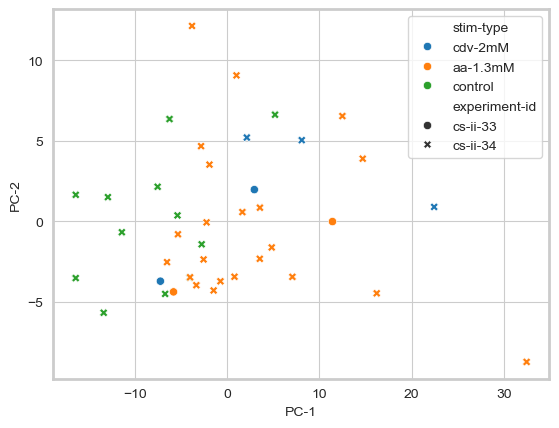

In [52]:
%matplotlib inline
sns.scatterplot(
    data=cluster_pivot_new_df,
    x='PC-1',
    y='PC-2',
    hue=STIM_TYPE_CN,
    style=EXPERIMENT_ID_CN)
plt.show()

#### Perform _t_-SNE

In [53]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity=4, n_iter=100000, learning_rate=10, n_iter_without_progress=10000, min_grad_norm=1e-10,
            init='random', method='exact')
tsne_data = tsne.fit_transform(scaled_data)

tsne_data_df = (
    pd.DataFrame(
        tsne_data,
        index=nice_mi,
        columns=['t-SNE-1', 't-SNE-2'])
    .reset_index())
tsne_data_df.info()
tsne_data_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41 entries, 0 to 40
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   stim-type           41 non-null     object 
 1   stimulus-direction  41 non-null     object 
 2   unique-trial-id     41 non-null     object 
 3   experiment-id       41 non-null     object 
 4   t-SNE-1             41 non-null     float32
 5   t-SNE-2             41 non-null     float32
dtypes: float32(2), object(4)
memory usage: 1.7+ KB


,stim-type,stimulus-direction,unique-trial-id,experiment-id,t-SNE-1,t-SNE-2
0,cdv-2mM,both,cs-ii-33_189_16,cs-ii-33,311.953430,-176.799667
1,aa-1.3mM,both,cs-ii-33_189_18,cs-ii-33,-281.038239,-17.747654
2,aa-1.3mM,both,cs-ii-33_189_20,cs-ii-33,357.942566,-191.603714
3,cdv-2mM,both,cs-ii-33_189_22,cs-ii-33,-91.239227,89.893974
4,control,left,cs-ii-34_202_1,cs-ii-34,-195.492645,-11.724844


matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.


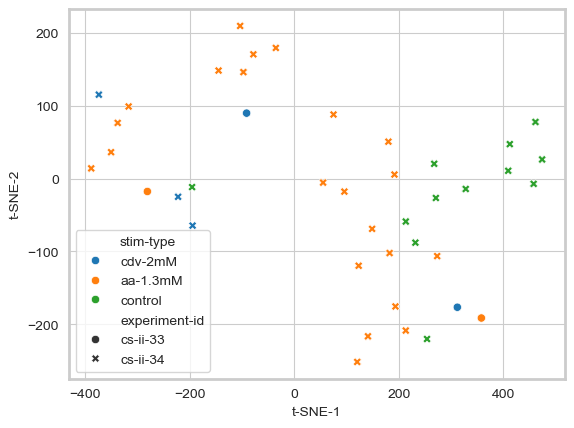

In [54]:
%matplotlib inline
sns.scatterplot(
    data=tsne_data_df,
    x='t-SNE-1',
    y='t-SNE-2',
    hue=STIM_TYPE_CN,
    style=EXPERIMENT_ID_CN)
plt.show()

### Determine Statistically Significant Regions

In [105]:
time_bins = pd.IntervalIndex.from_tuples(
    [(-20, -1), (1, 20), (REF_STIM_TIME + 1, REF_STIM_TIME + 20)])
pre_stim_time_bin = time_bins[0]
time_bins, pre_stim_time_bin

(IntervalIndex([(-20, -1], (1, 20], (31, 50]], dtype='interval[int64, right]'),
 Interval(-20, -1, closed='right'))

In [106]:
TIME_BIN_CN = 'time-bin'
stim_seq_df[TIME_BIN_CN] = pd.cut(
    stim_seq_df[TIME_CN], bins=time_bins)
binned_stim_seq_df = (
    stim_seq_df
    .dropna(subset=[TIME_BIN_CN]))

In [107]:
time_bin_df = (
    binned_stim_seq_df
    .groupby([
        TIME_BIN_CN, 
        REGION_CN, 
        LAT_SIDE_CN,
        STIM_TYPE_CN, 
        SPATIAL_LAYOUT_CN,
        EXPERIMENT_ID_CN,
        RUN_ID_CN,
        STIM_STEP_INDEX_CN],
        observed=True)
    .agg({DF_BY_F_CN: 'mean'})
    .reset_index()
    .dropna())

time_bin_df.info()
time_bin_df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 64410 entries, 0 to 72077
Data columns (total 9 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   time-bin            64410 non-null  category
 1   region              64410 non-null  object  
 2   lateral-side        64410 non-null  object  
 3   stim-type           64410 non-null  object  
 4   stimulus-direction  64410 non-null  object  
 5   experiment-id       64410 non-null  object  
 6   run-id              64410 non-null  int64   
 7   stim-step-index     64410 non-null  int64   
 8   delta-f-over-f      64410 non-null  float64 
dtypes: category(1), float64(1), int64(2), object(5)
memory usage: 4.5+ MB


,time-bin,region,lateral-side,stim-type,stimulus-direction,experiment-id,run-id,stim-step-index,delta-f-over-f
0,"(-20, -1]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-33,189,18,0.026979
1,"(-20, -1]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-33,189,20,0.103439
2,"(-20, -1]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-34,204,5,0.077659
3,"(-20, -1]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-34,204,11,0.162752
4,"(-20, -1]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",left,aa-1.3mM,both,cs-ii-34,205,5,0.097788


In [108]:
unique_time_bins = time_bin_df[TIME_BIN_CN].unique()
unique_regions = time_bin_df[REGION_CN].unique()
unique_stim_directions = time_bin_df[SPATIAL_LAYOUT_CN].unique()
unique_stim_types = time_bin_df[STIM_TYPE_CN].unique()

iterator = it.product(
    ((x, time_bin_df[TIME_BIN_CN] == x) 
     for x in unique_time_bins),
    ((x, time_bin_df[REGION_CN] == x) 
     for x in unique_regions),
    ((x, time_bin_df[SPATIAL_LAYOUT_CN] == x) 
     for x in unique_stim_directions),
    ((x, time_bin_df[STIM_TYPE_CN] == x) 
     for x in unique_stim_types))

comparison_list = ['L', 'R', 'X']
comparison_lut = {
    'L': 'left',
    'R': 'right',
    'X': 'both'}

output_list = []

pre_stim_select = time_bin_df[TIME_BIN_CN] == pre_stim_time_bin

for selection_tuple in iterator:                
    ((time_bin, time_bin_select), 
     (region, region_select),
     (stim_dir, stim_dir_select),
     (stim_type, stim_type_select)) = selection_tuple
    
    if time_bin == pre_stim_time_bin:
        continue
    
    base_select = region_select & stim_dir_select & stim_type_select
    
    for comparison_select in comparison_list:
        test_select = time_bin_select
        
        if comparison_select in ('L', 'R'):     
            test_side = comparison_lut[comparison_select]
            ref_side = test_side
            ref_bin = pre_stim_time_bin
            ref_select = pre_stim_select
            test_side_select = time_bin_df[LAT_SIDE_CN] == test_side
            ref_side_select = test_side_select
        elif comparison_select == 'X':
            continue  
            # FIXME - currently skipping cross comparison
            test_side = 'right'
            ref_side = 'left'
            ref_bin = time_bin
            ref_select = time_bin_select
            test_side_select = time_bin_df[LAT_SIDE_CN] == test_side
            ref_side_select = time_bin_df[LAT_SIDE_CN] == ref_side
        else:
            raise RuntimeError('Invalid comparison select value encountered.')
        
        test_row_select = base_select & test_select & test_side_select
        ref_row_select = base_select & ref_select & ref_side_select
       
        test_values = time_bin_df.loc[test_row_select, DF_BY_F_CN].dropna()
        ref_values = time_bin_df.loc[ref_row_select, DF_BY_F_CN].dropna()
        
        if test_values.empty or ref_values.empty:
            continue
        
        effect_size = test_values.mean() - ref_values.mean()
        stat_result = scipy.stats.ttest_ind(
            test_values, ref_values, equal_var=False)            
        
        results_dict = {
            TIME_BIN_CN: time_bin,
            REGION_CN: region,
            SPATIAL_LAYOUT_CN: stim_dir,
            STIM_TYPE_CN: stim_type,
            'test_side': test_side,
            'ref_side': ref_side,
            'ref_time_bin': ref_bin,
            'n-test': test_values.size,
            'n-ref': ref_values.size,
            'effect-size': effect_size,
            't-statistic': stat_result.statistic,
            'p-value': stat_result.pvalue}
        
        output_list.append(results_dict)
    
stats_comparison_df = pd.DataFrame(output_list)

stats_comparison_df['neg-log10-p'] = -1 * np.log10(stats_comparison_df['p-value'])

stats_comparison_df.info()
stats_comparison_df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7672 entries, 0 to 7671
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype                 
---  ------              --------------  -----                 
 0   time-bin            7672 non-null   interval[int64, right]
 1   region              7672 non-null   object                
 2   stimulus-direction  7672 non-null   object                
 3   stim-type           7672 non-null   object                
 4   test_side           7672 non-null   object                
 5   ref_side            7672 non-null   object                
 6   ref_time_bin        7672 non-null   interval[int64, right]
 7   n-test              7672 non-null   int64                 
 8   n-ref               7672 non-null   int64                 
 9   effect-size         7672 non-null   float64               
 10  t-statistic         7672 non-null   float64               
 11  p-value             7672 non-null   float64             

,time-bin,region,stimulus-direction,stim-type,test_side,ref_side,ref_time_bin,n-test,n-ref,effect-size,t-statistic,p-value,neg-log10-p
0,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,aa-1.3mM,left,left,"(-20, -1]",12,12,0.031299,1.171637,0.257028,0.590019
1,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,aa-1.3mM,right,right,"(-20, -1]",12,12,0.008721,0.379081,0.708263,0.149805
2,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,cdv-2mM,left,left,"(-20, -1]",5,5,0.035791,1.048028,0.329173,0.482576
3,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,cdv-2mM,right,right,"(-20, -1]",5,5,0.052674,1.978756,0.083797,1.076773
4,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,control,left,left,"(-20, -1]",4,4,-0.017545,-0.358277,0.732407,0.135248
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7667,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",left,control,right,right,"(-20, -1]",4,4,-0.147292,-0.590471,0.576867,0.238924
7668,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",right,aa-1.3mM,left,left,"(-20, -1]",2,2,0.041298,0.479598,0.714978,0.145707
7669,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",right,aa-1.3mM,right,right,"(-20, -1]",2,2,0.069118,1.607752,0.346790,0.459934
7670,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",right,control,left,left,"(-20, -1]",4,4,-0.021463,-0.388704,0.711045,0.148103


In [109]:
stats_comparison_df['test_type'] = pd.NA
same_select = (
        stats_comparison_df['test_side'] == stats_comparison_df['ref_side'])
stats_comparison_df.loc[same_select, 'test_type'] = (
        stats_comparison_df.loc[same_select, 'test_side'])
stats_comparison_df.loc[~same_select, 'test_type'] = 'cross'
stats_comparison_df = stats_comparison_df.dropna()
stats_comparison_df.info()
stats_comparison_df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7672 entries, 0 to 7671
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype                 
---  ------              --------------  -----                 
 0   time-bin            7672 non-null   interval[int64, right]
 1   region              7672 non-null   object                
 2   stimulus-direction  7672 non-null   object                
 3   stim-type           7672 non-null   object                
 4   test_side           7672 non-null   object                
 5   ref_side            7672 non-null   object                
 6   ref_time_bin        7672 non-null   interval[int64, right]
 7   n-test              7672 non-null   int64                 
 8   n-ref               7672 non-null   int64                 
 9   effect-size         7672 non-null   float64               
 10  t-statistic         7672 non-null   float64               
 11  p-value             7672 non-null   float64             

,time-bin,region,stimulus-direction,stim-type,test_side,ref_side,ref_time_bin,n-test,n-ref,effect-size,t-statistic,p-value,neg-log10-p,test_type
0,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,aa-1.3mM,left,left,"(-20, -1]",12,12,0.031299,1.171637,0.257028,0.590019,left
1,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,aa-1.3mM,right,right,"(-20, -1]",12,12,0.008721,0.379081,0.708263,0.149805,right
2,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,cdv-2mM,left,left,"(-20, -1]",5,5,0.035791,1.048028,0.329173,0.482576,left
3,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,cdv-2mM,right,right,"(-20, -1]",5,5,0.052674,1.978756,0.083797,1.076773,right
4,"(1, 20]","6.7FDhcrtR-Gal4 Cluster 1, Rhombencephalon",both,control,left,left,"(-20, -1]",4,4,-0.017545,-0.358277,0.732407,0.135248,left
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7667,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",left,control,right,right,"(-20, -1]",4,4,-0.147292,-0.590471,0.576867,0.238924,right
7668,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",right,aa-1.3mM,left,left,"(-20, -1]",2,2,0.041298,0.479598,0.714978,0.145707,left
7669,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",right,aa-1.3mM,right,right,"(-20, -1]",2,2,0.069118,1.607752,0.346790,0.459934,right
7670,"(31, 50]","X Vagus motorneuron cluster, Rhombencephalon",right,control,left,left,"(-20, -1]",4,4,-0.021463,-0.388704,0.711045,0.148103,left


In [110]:
log_p_cutoff = 2
effect_size_cutoff = 0.15

significant_select = (
    (stats_comparison_df['neg-log10-p'] > log_p_cutoff)
    & (stats_comparison_df['effect-size'].abs() > effect_size_cutoff))

significant_stats_comparison_df = (
    stats_comparison_df.loc[significant_select, :]
    .copy())

insignificant_stats_comparison_df = (
    stats_comparison_df.loc[~significant_select, :]
    .copy())

significant_stats_comparison_df.info()
significant_stats_comparison_df


<class 'pandas.core.frame.DataFrame'>
Int64Index: 31 entries, 156 to 7636
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype                 
---  ------              --------------  -----                 
 0   time-bin            31 non-null     interval[int64, right]
 1   region              31 non-null     object                
 2   stimulus-direction  31 non-null     object                
 3   stim-type           31 non-null     object                
 4   test_side           31 non-null     object                
 5   ref_side            31 non-null     object                
 6   ref_time_bin        31 non-null     interval[int64, right]
 7   n-test              31 non-null     int64                 
 8   n-ref               31 non-null     int64                 
 9   effect-size         31 non-null     float64               
 10  t-statistic         31 non-null     float64               
 11  p-value             31 non-null     float64             

,time-bin,region,stimulus-direction,stim-type,test_side,ref_side,ref_time_bin,n-test,n-ref,effect-size,t-statistic,p-value,neg-log10-p,test_type
156,"(1, 20]","Anterior Commisure, Telencephalon",both,cdv-2mM,left,left,"(-20, -1]",5,5,0.181258,3.800809,0.006360,2.196514,left
157,"(1, 20]","Anterior Commisure, Telencephalon",both,cdv-2mM,right,right,"(-20, -1]",5,5,0.159450,4.481810,0.002242,2.649343,right
199,"(1, 20]","Anterior preoptic dopaminergic cluster, Diencephalon",both,cdv-2mM,right,right,"(-20, -1]",5,5,0.179488,3.955025,0.004269,2.369630,right
1507,"(1, 20]","Isl1 cluster 2, Telencephalon",both,cdv-2mM,left,left,"(-20, -1]",5,5,0.180251,4.098184,0.006295,2.201024,left
1508,"(1, 20]","Isl1 cluster 2, Telencephalon",both,cdv-2mM,right,right,"(-20, -1]",5,5,0.183651,4.271541,0.002732,2.563546,right
2056,"(1, 20]","Olfactory bulb dopaminergic neuron areas, Telencephalon",both,control,right,right,"(-20, -1]",4,4,0.159240,6.161086,0.002515,2.599465,right
2058,"(1, 20]","Olfactory bulb dopaminergic neuron areas, Telencephalon",left,aa-1.3mM,right,right,"(-20, -1]",6,6,0.189851,3.843118,0.004304,2.366159,right
2581,"(1, 20]","Preoptic Otpb Cluster, Diencephalon",both,cdv-2mM,left,left,"(-20, -1]",5,5,0.151747,5.172311,0.002531,2.596649,left
2582,"(1, 20]","Preoptic Otpb Cluster, Diencephalon",both,cdv-2mM,right,right,"(-20, -1]",5,5,0.153811,5.226136,0.000840,3.075593,right
2595,"(1, 20]","Preoptic area Vglut2 cluster, Diencephalon",both,cdv-2mM,left,left,"(-20, -1]",5,5,0.161639,4.516452,0.002356,2.627738,left


#### Latex Table for Significant Stats

In [134]:
csutils.touchdir(os.path.join(multi_experiment_output_dir, 'tables'))

time_bin_label_dict = {
    time_bins[0]: 'Pre-Stim.',
    time_bins[1]: 'Stim.',
    time_bins[2]: 'Post-Stim.'}

def time_bin_formatter(val):
    return time_bin_label_dict[val]

def stim_type_map(val):
    return {
        'control': 2,
        'cdv-2mM': 0,
        'aa-1.3mM': 1}[val]

def stim_type_formatter(val):
    return {
        'control': 'Control',
        'cdv-2mM': 'Cadaverine',
        'aa-1.3mM': 'Amino Acid'}[val]

sig_data = (
    significant_stats_comparison_df
    [[STIM_TYPE_CN, 'stimulus-direction', 'test_side', REGION_CN, TIME_BIN_CN, 'effect-size', 'neg-log10-p']]
    .sort_values(by='neg-log10-p', ascending=False, kind='stable')
    .sort_values(by='stim-type', key=lambda col: col.map(stim_type_map), kind='stable')
    .reset_index())
sig_data[STIM_TYPE_CN] = sig_data[STIM_TYPE_CN].apply(stim_type_formatter)

sig_data = (
    sig_data
    .set_index([STIM_TYPE_CN, 'index'])
)

part_a = np.arange(sig_data.loc['Cadaverine'].shape[0]) + 1
part_b = np.arange(sig_data.loc['Amino Acid'].shape[0]) + 1
part_c = np.arange(sig_data.loc['Control'].shape[0]) + 1

tuples = [('Cadaverine', x) for x in part_a]
tuples.extend([('Amino Acid', x) for x in part_b])
tuples.extend([('Control', x) for x in part_c])
sig_data.index = pd.MultiIndex.from_tuples(tuples, names=['Stim. Type', ''])

sig_data

stimulus-direction test_side  \
Stim. Type                                   
Cadaverine 1                both      left   
           2                both     right   
           3                both      left   
           4                both      left   
           5                both      left   
           6                both     right   
           7                both      left   
           8                both      left   
           9                both     right   
           10               both      left   
           11               both     right   
           12               both      left   
           13               both      left   
           14               both     right   
Amino Acid 1                left      left   
           2                left     right   
           3                left      left   
           4                left      left   
           5                both      left   
           6                left     right   
           7                left      left   
           8                left      left   
           9                left     right   
           10               left      left   
           11               left     right   
           12               both     right   
           13               left      left   
Control    1                both     right   
           2                both     right   
           3               right     right   
           4                both      left   

                                                                region  \
Stim. Type                                                               
Cadaverine 1            Subpallial dopaminergic cluster, Telencephalon   
           2                       Preoptic Otpb Cluster, Diencephalon   
           3                             S1181t Cluster, Telencephalon   
           4                  Subpallial Otpb Cluster 2, Telencephalon   
           5                              Vmat2 cluster, Telencephalon   
           6                         Anterior Commisure, Telencephalon   
           7                Preoptic area Vglut2 cluster, Diencephalon   
           8                       Preoptic Otpb Cluster, Diencephalon   
           9                             Isl1 cluster 2, Telencephalon   
           10               Preoptic area Vglut2 cluster, Diencephalon   
           11     Anterior preoptic dopaminergic cluster, Diencephalon   
           12                            Isl1 cluster 2, Telencephalon   
           13                        Anterior Commisure, Telencephalon   
           14               Preoptic area Vglut2 cluster, Diencephalon   
Amino Acid 1                             Isl1 cluster 2, Telencephalon   
           2                             Olfactory Bulb, Telencephalon   
           3                              Otpb Cluster 1, Diencephalon   
           4            Subpallial dopaminergic cluster, Telencephalon   
           5            Subpallial dopaminergic cluster, Telencephalon   
           6   Olfactory bulb dopaminergic neuron areas, Telencephalon   
           7                              Vmat2 cluster, Telencephalon   
           8                             Olfactory Bulb, Telencephalon   
           9   Olfactory bulb dopaminergic neuron areas, Telencephalon   
           10                            S1181t Cluster, Telencephalon   
           11           Subpallial dopaminergic cluster, Telencephalon   
           12                                    RoM1, Rhombencephalon   
           13                            Olfactory Epithelium, Ganglia   
Control    1            Subpallial dopaminergic cluster, Telencephalon   
           2   Olfactory bulb dopaminergic neuron areas, Telencephalon   
           3                             Torus Lateralis, Diencephalon   
           4            Subpallial dopaminergic cluster, Telencephalon   

               time-bin  effect-size  neg-log10-p  


In [135]:
styler = (
    sig_data
    .style
    .format({
        'stim-type': stim_type_formatter,
        'effect-size': lambda s: '{:+.1f}\%'.format(s * 100),
        'neg-log10-p': '{:.1f}',
        TIME_BIN_CN: time_bin_formatter})
    .relabel_index(['Stim. Dir.', 'Region Side', 'Region name', 'Time Bin', r'$\Delta \left(\Delta F / F\right)$', r'$-log_{{10}}\left(p\right)$'],
                   axis='columns')
)

styler.to_latex(
    buf=os.path.join(multi_experiment_output_dir, 'tables', 'stimulation-bidir-odors-significant-regions.tex'),
    siunitx=True,
    hrules=True,
    caption='Brain regions and time windows with significant responses to bilateral stimulation with cadaverine, amino acid, and control stimuli.')

styler

In [75]:
significant_stats_comparison_df[STIM_TYPE_CN].value_counts()

cdv-2mM     14
aa-1.3mM    13
control      4
Name: stim-type, dtype: int64

In [76]:
insignificant_stats_comparison_df[STIM_TYPE_CN].value_counts()

aa-1.3mM    3303
control     3188
cdv-2mM     1150
Name: stim-type, dtype: int64

In [77]:
significant_stats_comparison_df[REGION_CN].value_counts()

Subpallial dopaminergic cluster, Telencephalon             6
Isl1 cluster 2, Telencephalon                              3
Olfactory bulb dopaminergic neuron areas, Telencephalon    3
Preoptic area Vglut2 cluster, Diencephalon                 3
Anterior Commisure, Telencephalon                          2
Preoptic Otpb Cluster, Diencephalon                        2
S1181t Cluster, Telencephalon                              2
Vmat2 cluster, Telencephalon                               2
Olfactory Bulb, Telencephalon                              2
Anterior preoptic dopaminergic cluster, Diencephalon       1
Subpallial Otpb Cluster 2, Telencephalon                   1
Olfactory Epithelium, Ganglia                              1
Otpb Cluster 1, Diencephalon                               1
RoM1, Rhombencephalon                                      1
Torus Lateralis, Diencephalon                              1
Name: region, dtype: int64

In [78]:
selected_regions_for_plots = [
    'Olfactory Bulb, Telencephalon',
    'Subpallial dopaminergic cluster, Telencephalon', 
    'Preoptic Otpb Cluster, Diencephalon',
    'Isl1 cluster 2, Telencephalon']

selected_region_dict = {
    x: i for i, x in enumerate(selected_regions_for_plots)}

In [79]:
UNIQUE_STIM_TRIAL_CN = 'unique-stim-trial-id'
stim_seq_df[UNIQUE_STIM_TRIAL_CN] = (
    stim_seq_df[EXPERIMENT_ID_CN].astype(str) 
    + '-r' + stim_seq_df[RUN_ID_CN].astype(str)
    + '-s' + stim_seq_df[STIM_STEP_INDEX_CN].astype(str))
stim_seq_df.info()
stim_seq_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14415600 entries, 0 to 14415599
Data columns (total 12 columns):
 #   Column                Dtype   
---  ------                -----   
 0   time                  float64 
 1   region                object  
 2   lateral-side          object  
 3   experiment-id         object  
 4   run-id                int64   
 5   delta-f-over-f        float64 
 6   stimulus-direction    object  
 7   stim-type             object  
 8   duration_s            float64 
 9   stim-step-index       int64   
 10  time-bin              category
 11  unique-stim-trial-id  object  
dtypes: category(1), float64(3), int64(2), object(6)
memory usage: 1.2+ GB


,time,region,lateral-side,experiment-id,run-id,delta-f-over-f,stimulus-direction,stim-type,duration_s,stim-step-index,time-bin,unique-stim-trial-id
0,-30.0,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,1.150050,both,cdv-2mM,30.0,16,NaN,cs-ii-33-r189-s16
1,-29.8,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.961090,both,cdv-2mM,30.0,16,NaN,cs-ii-33-r189-s16
2,-29.6,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.772131,both,cdv-2mM,30.0,16,NaN,cs-ii-33-r189-s16
3,-29.4,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.583172,both,cdv-2mM,30.0,16,NaN,cs-ii-33-r189-s16
4,-29.2,"Mauthner Cell Axon Cap, Rhombencephalon",left,cs-ii-33,189,0.381100,both,cdv-2mM,30.0,16,NaN,cs-ii-33-r189-s16


In [80]:
stim_seq_df[DF_BY_F_CN].isna().sum()

2280837

#### Preview Volcano Plots

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.font_manager (1411): DEBUG : findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\STIXNonUni.ttf', name='STIXNonUnicode', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\\repos\\zmia\\envs\\zmia-env-everything-3.10-v3\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-BoldOblique.ttf', name='DejaVu Sans Mono', style='oblique', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
matplotlib.font_manager (1423): DEBUG : findfont: score(FontEntry(fname='I:\\CorbanSwain\

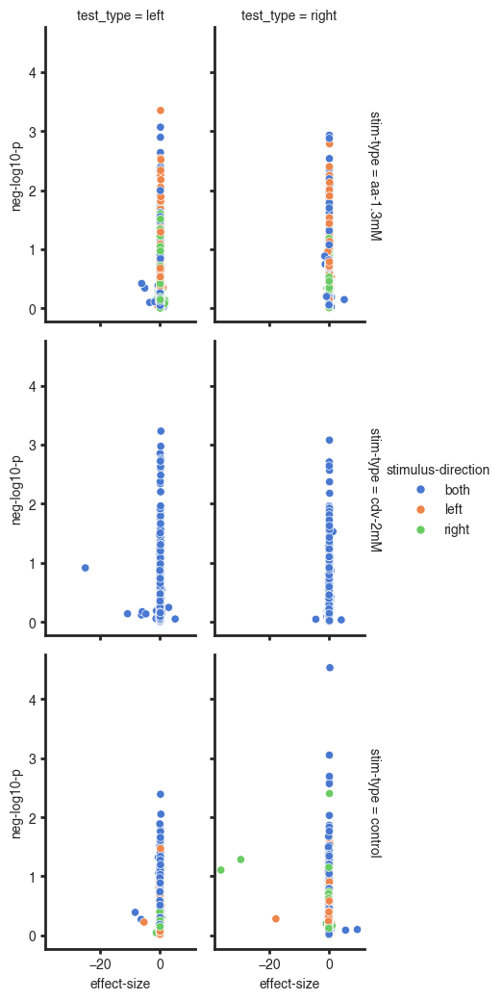

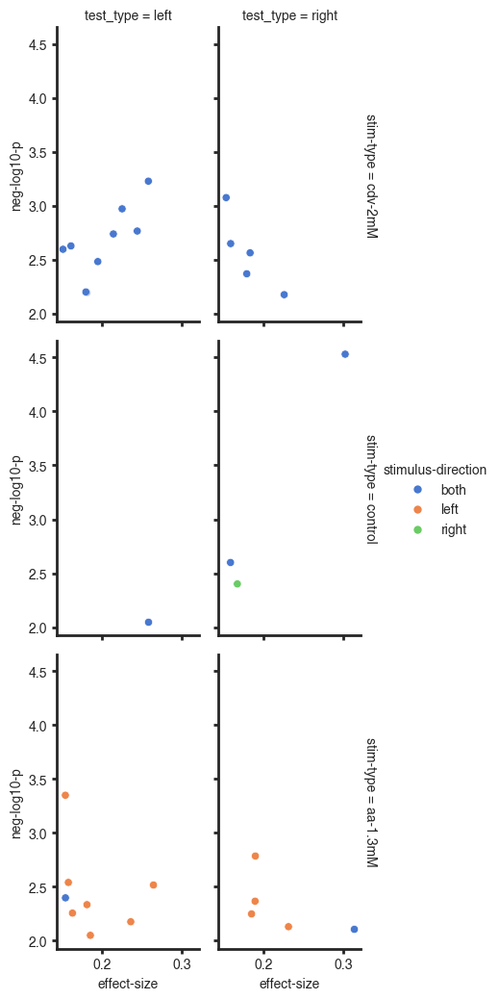

In [81]:
%matplotlib inline
sns.relplot(
    stats_comparison_df,
    x='effect-size',
    y='neg-log10-p',
    col='test_type',
    hue='stimulus-direction',
    row='stim-type',
    aspect=0.6,
    height=3.5,
    facet_kws=dict(
        margin_titles=True,
    ),
)

plt.show()

sns.relplot(
    significant_stats_comparison_df,
    x='effect-size',
    y='neg-log10-p',
    col='test_type',
    hue='stimulus-direction',
    row='stim-type',
    aspect=0.6,
    height=3.5,
    facet_kws=dict(
        margin_titles=True,
    ),
)
plt.show()

### Synchronize Tail Bouts to Stimulus

In [82]:
bout_dfs = []
for row_index, stim_log_row in stim_log_subset_df.iterrows():
    log.info(f'{stim_log_row[EXPERIMENT_ID_CN] = }, {stim_log_row[RUN_ID_CN] = }')
    
    bout_subset_df = (
        swim_bout_stat_df.loc[
        (swim_bout_stat_df[EXPERIMENT_ID_CN] == stim_log_row[EXPERIMENT_ID_CN])
        & (swim_bout_stat_df[RUN_ID_CN] == stim_log_row[RUN_ID_CN]), 
        :]
        .copy())
    
    bout_subset_df[BOUT_TIMESTAMP_CN] = (
        bout_subset_df[BOUT_TIMESTAMP_CN]
        .sub(stim_log_row[REL_START_TIME_CN]))
        
    stim_duration = stim_log_row[STIM_DURATION_CN]            
    actual_end_time = stim_duration + time_post_stim
    
    bout_subset_df = (
        bout_subset_df.loc[
        bout_subset_df[BOUT_TIMESTAMP_CN]
        .between(-1 * time_pre_stim_start, actual_end_time), 
        :])
    
    # fictive time remapping to `REF_STIM_TIME` length stim
    if stim_duration > REF_STIM_TIME:
        drop_select = (
            bout_subset_df[BOUT_TIMESTAMP_CN]
            .between(REF_STIM_TIME, stim_duration, inclusive='right'))
        log.info(
            ' >>> Dropping {:d} bouts after REF_STIM_TIME on '
            '[{:.1f}, {:.1f}).', 
            drop_select.sum(), REF_STIM_TIME, stim_duration)
        bout_subset_df = (
            bout_subset_df.loc[~drop_select, :])
    
    row_select = (
        bout_subset_df[BOUT_TIMESTAMP_CN]
        .gt(stim_duration))
    bout_subset_df.loc[row_select, BOUT_TIMESTAMP_CN] = (
        bout_subset_df
        .loc[row_select, BOUT_TIMESTAMP_CN]
        .sub(stim_duration)
        .add(REF_STIM_TIME))

    bout_subset_df[STIM_STEP_INDEX_CN] = stim_log_row[STIM_STEP_INDEX_CN]
    bout_subset_df[STIM_TYPE_CN] = stim_log_row[STIM_TYPE_CN]
    bout_subset_df[STIM_DURATION_CN] = stim_log_row[STIM_DURATION_CN]
    bout_subset_df[SPATIAL_LAYOUT_CN] = stim_log_row[SPATIAL_LAYOUT_CN]
    bout_dfs.append(bout_subset_df)
    
stim_sync_bout_df = pd.concat(bout_dfs, axis=0, ignore_index=True)
stim_sync_bout_df.info()
stim_sync_bout_df

local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 188
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 188
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 188
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 188
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 189
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 189
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : stim_log_row[EXPERIMENT_ID_CN] = 'cs-ii-33', stim_log_row[RUN_ID_CN] = 189
local-nb_cs-ii-[29,33,34]_integration_figures ( 

,experiment-id,run-id,fish_id,bout_index,bout_timestamp,bout_framestamp,bout_duration,bout_max_curvature,bout_max_angle_range,bout_duration_ms,unique_run_id,count_col,stim-step-index,stim-type,duration_s,stimulus-direction
0,cs-ii-33,188,cs-ii-33A,226,-28.283909,155853,0.156,0.006077,4.870688,156.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both
1,cs-ii-33,188,cs-ii-33A,227,-26.185909,156356,0.568,0.006768,5.443922,568.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both
2,cs-ii-33,188,cs-ii-33A,228,-23.957909,156892,0.172,0.006011,4.595050,172.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both
3,cs-ii-33,188,cs-ii-33A,229,-23.498909,157002,0.578,0.006601,6.130605,578.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both
4,cs-ii-33,188,cs-ii-33A,230,-20.090909,157832,0.482,0.005887,6.514415,482.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1104,cs-ii-34,209,cs-ii-34A,244,48.671518,248602,0.498,0.019569,86.517005,498.0,cs-ii-34_209,1,20,aa-1.3mM,30.0,both
1105,cs-ii-34,209,cs-ii-34A,245,79.626518,256191,0.228,0.017399,11.417671,228.0,cs-ii-34_209,1,20,aa-1.3mM,30.0,both
1106,cs-ii-34,209,cs-ii-34A,249,-29.079394,266282,0.870,0.674952,43.915599,870.0,cs-ii-34_209,1,22,cdv-2mM,30.0,both
1107,cs-ii-34,209,cs-ii-34A,250,7.566606,275233,0.322,0.023337,105.100079,322.0,cs-ii-34_209,1,22,cdv-2mM,30.0,both


### Tail Movement Statistics

In [83]:
x = 30
time_bins_tail = pd.IntervalIndex.from_tuples(
    [(-1 * x, -1), (1, x), (REF_STIM_TIME + 1, REF_STIM_TIME + x)])
pre_stim_time_bin = time_bins_tail[0]
stim_sync_bout_df[TIME_BIN_CN] = (
    pd.cut(
        stim_sync_bout_df[BOUT_TIMESTAMP_CN],
        bins=time_bins_tail))

binned_stim_seq_bout_df = stim_sync_bout_df.dropna(subset=[TIME_BIN_CN])

In [84]:
agg_sync_bout_df = (
    binned_stim_seq_bout_df
    .groupby(
        [UNIQUE_RUN_ID_CN, STIM_STEP_INDEX_CN, TIME_BIN_CN,
         STIM_TYPE_CN, SPATIAL_LAYOUT_CN],
        observed=True)
    .agg({BOUT_INDEX_CN: 'count', BOUT_MAX_ANGLE_CN: 'mean'})
    .reset_index())

runs_with_bouts = (
    agg_sync_bout_df
    .loc[agg_sync_bout_df[BOUT_INDEX_CN].ge(1), UNIQUE_RUN_ID_CN]
    .unique())

select = agg_sync_bout_df[UNIQUE_RUN_ID_CN].isin(runs_with_bouts)
log.info(f'Keeping {select.sum()} / {select.size} runs with bouts.')
agg_sync_bout_df = (
    agg_sync_bout_df
    .loc[select, :])
agg_sync_bout_df.info()
agg_sync_bout_df

local-nb_cs-ii-[29,33,34]_integration_figures (  16): INFO : Keeping 101 / 101 runs with bouts.
<class 'pandas.core.frame.DataFrame'>
Int64Index: 101 entries, 0 to 100
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   unique_run_id         101 non-null    object  
 1   stim-step-index       101 non-null    int64   
 2   time-bin              101 non-null    category
 3   stim-type             101 non-null    object  
 4   stimulus-direction    101 non-null    object  
 5   bout_index            101 non-null    int64   
 6   bout_max_angle_range  101 non-null    float64 
dtypes: category(1), float64(1), int64(2), object(3)
memory usage: 5.8+ KB


,unique_run_id,stim-step-index,time-bin,stim-type,stimulus-direction,bout_index,bout_max_angle_range
0,cs-ii-33_188,16,"(-30, -1]",cdv-2mM,both,14,5.386434
1,cs-ii-33_188,16,"(1, 30]",cdv-2mM,both,16,12.211993
2,cs-ii-33_188,16,"(31, 60]",cdv-2mM,both,17,5.739974
3,cs-ii-33_188,18,"(-30, -1]",aa-1.3mM,both,14,5.532497
4,cs-ii-33_188,18,"(1, 30]",aa-1.3mM,both,19,4.917389
...,...,...,...,...,...,...,...
96,cs-ii-34_209,20,"(-30, -1]",aa-1.3mM,both,13,12.497857
97,cs-ii-34_209,20,"(1, 30]",aa-1.3mM,both,5,6.959153
98,cs-ii-34_209,20,"(31, 60]",aa-1.3mM,both,1,86.517005
99,cs-ii-34_209,22,"(-30, -1]",cdv-2mM,both,1,43.915599


In [85]:
large_bout_cutoff = 15
agg_sync_large_bout_df = (
    binned_stim_seq_bout_df    
    .loc[binned_stim_seq_bout_df[BOUT_MAX_ANGLE_CN].ge(large_bout_cutoff), :]
    .groupby(
        [UNIQUE_RUN_ID_CN, STIM_STEP_INDEX_CN, TIME_BIN_CN,
         STIM_TYPE_CN, SPATIAL_LAYOUT_CN],
        observed=True)
    .agg({BOUT_INDEX_CN: 'count', BOUT_MAX_ANGLE_CN: 'mean'})
    .reset_index())

agg_sync_large_bout_df = (
    agg_sync_large_bout_df
    .loc[agg_sync_large_bout_df[UNIQUE_RUN_ID_CN].isin(runs_with_bouts), :])
agg_sync_large_bout_df.info()
agg_sync_large_bout_df

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70 entries, 0 to 69
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   unique_run_id         70 non-null     object  
 1   stim-step-index       70 non-null     int64   
 2   time-bin              70 non-null     category
 3   stim-type             70 non-null     object  
 4   stimulus-direction    70 non-null     object  
 5   bout_index            70 non-null     int64   
 6   bout_max_angle_range  70 non-null     float64 
dtypes: category(1), float64(1), int64(2), object(3)
memory usage: 4.0+ KB


,unique_run_id,stim-step-index,time-bin,stim-type,stimulus-direction,bout_index,bout_max_angle_range
0,cs-ii-33_188,16,"(1, 30]",cdv-2mM,both,3,41.458326
1,cs-ii-33_188,18,"(31, 60]",aa-1.3mM,both,1,32.494211
2,cs-ii-33_188,20,"(-30, -1]",aa-1.3mM,both,4,30.308477
3,cs-ii-33_188,22,"(-30, -1]",cdv-2mM,both,4,25.632174
4,cs-ii-33_188,22,"(1, 30]",cdv-2mM,both,3,17.424268
...,...,...,...,...,...,...,...
65,cs-ii-34_209,16,"(1, 30]",cdv-2mM,both,3,44.791626
66,cs-ii-34_209,20,"(-30, -1]",aa-1.3mM,both,2,41.650111
67,cs-ii-34_209,20,"(31, 60]",aa-1.3mM,both,1,86.517005
68,cs-ii-34_209,22,"(-30, -1]",cdv-2mM,both,1,43.915599


In [86]:
agg_labels = ['all', f'gt{large_bout_cutoff:d}deg']

ref_interval = pre_stim_time_bin



output_results = []
for i, agg_df in enumerate((agg_sync_bout_df, agg_sync_large_bout_df)):
    log.info(f'Processing agg={agg_labels[i]} data.')    
    
    pre_stim_select = agg_df[TIME_BIN_CN] == ref_interval
    for time_interval in time_bins_tail:
        if time_interval == pre_stim_time_bin:
            continue        
        log.info(f'Processing time interval {time_interval}.')
        current_interval_select = agg_df[TIME_BIN_CN] == time_interval
        
        iterator = it.product(
            agg_sync_bout_df[STIM_TYPE_CN].unique(),
            agg_sync_bout_df[SPATIAL_LAYOUT_CN].unique())
        
        for stim_type, stim_dir in iterator:
            log.info(f'Processing {stim_type} {stim_dir}.')
            stim_type_select = agg_df[STIM_TYPE_CN] == stim_type
            stim_dir_select = agg_df[SPATIAL_LAYOUT_CN] == stim_dir
            stim_class_select = stim_type_select & stim_dir_select
            
            ref_subset = agg_df.loc[pre_stim_select & stim_class_select, :]      
            subset = agg_df.loc[current_interval_select & stim_class_select, :]
        
            test_count_list = subset[BOUT_INDEX_CN]
            ref_count_list = ref_subset[BOUT_INDEX_CN]
            
            if test_count_list.size <= 1 or ref_count_list.size <= 1:
                log.info(' >>> Skipping due to insufficient data. '
                         'Test: {:d}, Ref: {:d}.',
                         test_count_list.size, ref_count_list.size)
                continue
            log.info(' >>> Test: {:d}, Ref: {:d}.',                        
                     test_count_list.size, ref_count_list.size)
        
            stats_result = scipy.stats.ttest_ind(
                subset[BOUT_INDEX_CN], ref_subset[BOUT_INDEX_CN], equal_var=False)
            
            output_results.append({
                'time-interval': time_interval,
                't-statistic': stats_result.statistic,
                'p-value': stats_result.pvalue,
                'avg-bout-count': ref_count_list.mean(),
                'effect-size': test_count_list.mean() - ref_count_list.mean(),
                'test-interval': time_interval,
                'ref_interval': ref_interval,
                'n-test': test_count_list.size,
                'n-ref': ref_count_list.size,
                STIM_TYPE_CN: stim_type,
                SPATIAL_LAYOUT_CN: stim_dir,
                'agg_class': agg_labels[i],
            })
    
tail_movement_stats_df = pd.DataFrame(output_results)
tail_movement_stats_df

local-nb_cs-ii-[29,33,34]_integration_figures (   9): INFO : Processing agg=all data.
local-nb_cs-ii-[29,33,34]_integration_figures (  15): INFO : Processing time interval (1, 30].
local-nb_cs-ii-[29,33,34]_integration_figures (  23): INFO : Processing cdv-2mM both.
local-nb_cs-ii-[29,33,34]_integration_figures (  39): INFO :  >>> Test: 9, Ref: 6.
local-nb_cs-ii-[29,33,34]_integration_figures (  23): INFO : Processing cdv-2mM left.
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO :  >>> Skipping due to insufficient data. Test: 1, Ref: 1.
local-nb_cs-ii-[29,33,34]_integration_figures (  23): INFO : Processing cdv-2mM right.
local-nb_cs-ii-[29,33,34]_integration_figures (  35): INFO :  >>> Skipping due to insufficient data. Test: 0, Ref: 0.
local-nb_cs-ii-[29,33,34]_integration_figures (  23): INFO : Processing aa-1.3mM both.
local-nb_cs-ii-[29,33,34]_integration_figures (  39): INFO :  >>> Test: 11, Ref: 10.
local-nb_cs-ii-[29,33,34]_integration_figures (  23): INFO : Processi

I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\scipy\stats\_axis_nan_policy.py:531: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



,time-interval,t-statistic,p-value,avg-bout-count,effect-size,test-interval,ref_interval,n-test,n-ref,stim-type,stimulus-direction,agg_class
0,"(1, 30]",-0.787834,0.449409,14.500000,-4.277778,"(1, 30]","(-30, -1]",9,6,cdv-2mM,both,all
1,"(1, 30]",-0.151438,0.881232,11.900000,-0.627273,"(1, 30]","(-30, -1]",11,10,aa-1.3mM,both,all
2,"(1, 30]",-0.556711,0.619926,2.333333,-0.533333,"(1, 30]","(-30, -1]",5,3,aa-1.3mM,left,all
3,"(1, 30]",1.666667,0.344042,1.000000,2.500000,"(1, 30]","(-30, -1]",2,2,aa-1.3mM,right,all
4,"(1, 30]",-1.782266,0.124984,5.500000,-3.000000,"(1, 30]","(-30, -1]",4,4,control,both,all
5,"(1, 30]",0.164399,0.880223,2.500000,0.166667,"(1, 30]","(-30, -1]",3,2,control,left,all
6,"(31, 60]",-0.201440,0.844440,14.500000,-1.333333,"(31, 60]","(-30, -1]",6,6,cdv-2mM,both,all
7,"(31, 60]",-0.216432,0.830844,11.900000,-0.900000,"(31, 60]","(-30, -1]",12,10,aa-1.3mM,both,all
8,"(31, 60]",0.353553,0.750738,2.333333,0.333333,"(31, 60]","(-30, -1]",3,3,aa-1.3mM,left,all
9,"(31, 60]",4.242641,0.023981,1.000000,3.000000,"(31, 60]","(-30, -1]",4,2,aa-1.3mM,right,all


In [87]:
tail_movement_stats_df.query('`p-value` < 0.1')

,time-interval,t-statistic,p-value,avg-bout-count,effect-size,test-interval,ref_interval,n-test,n-ref,stim-type,stimulus-direction,agg_class
9,"(31, 60]",4.242641,0.023981,1.000000,3.000000,"(31, 60]","(-30, -1]",4,2,aa-1.3mM,right,all
18,"(31, 60]",-2.310161,0.050899,3.571429,-1.857143,"(31, 60]","(-30, -1]",7,7,aa-1.3mM,both,gt15deg


### Tail Movement Data by Fish ID

In [140]:
# get run durations
run_duration_dict = {}
unique_run_ids = swim_bout_stat_df[UNIQUE_RUN_ID_CN].unique()

stim_log_df_local = stimulation_log_df.copy()
stim_log_df_local[UNIQUE_RUN_ID_CN] = (
    stim_log_df_local[EXPERIMENT_ID_CN].astype(str)
    + '_' + stim_log_df_local[RUN_ID_CN].astype(str))

for unique_run_id in unique_run_ids:
    log.info(f'Processing {unique_run_id}.')
    run_select = stim_log_df_local.loc[stim_log_df_local[UNIQUE_RUN_ID_CN] == unique_run_id, :]
    last_step_select = run_select.loc[run_select[STIM_STEP_INDEX_CN].idxmax(), :]
    total_stim_duration = last_step_select[REL_START_TIME_CN] + last_step_select[STIM_DURATION_CN]
    run_duration_dict[unique_run_id] = total_stim_duration

run_duration_dict

local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-29_395.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-29_396.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-29_399.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-33_189.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-33_195.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-33_188.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-34_202.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-34_203.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-34_204.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-34_205.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): INFO : Processing cs-ii-34_206.
local-nb_cs-ii-[29,33,34]_integration_figures (  11): 

{'cs-ii-29_395': 840.002296900001,
 'cs-ii-29_396': 839.9999447999999,
 'cs-ii-29_399': 840.0042758,
 'cs-ii-33_189': 1268.0055185999954,
 'cs-ii-33_195': 1268.004687,
 'cs-ii-33_188': 1268.0106734,
 'cs-ii-34_202': 780.0031015,
 'cs-ii-34_203': 780.0035463999998,
 'cs-ii-34_204': 780.0017938000001,
 'cs-ii-34_205': 780.0028774000002,
 'cs-ii-34_206': 780.0044877,
 'cs-ii-34_207': 780.0022599000004,
 'cs-ii-34_208': 1268.0091768000002,
 'cs-ii-34_209': 1268.0068352999988}

In [146]:
row_list = []
for unique_run_id in unique_run_ids:
    log.info(f'Processing {unique_run_id}.')
    run_select = swim_bout_stat_df.loc[swim_bout_stat_df[UNIQUE_RUN_ID_CN] == unique_run_id, :]
    run_duration = run_duration_dict[unique_run_id]

    swim_bout_frequency = run_select.shape[0] / (run_duration / 60)
    log.info(f' >>> {swim_bout_frequency:.2f} bouts/min.')

    row_dict = {
        UNIQUE_RUN_ID_CN: unique_run_id,
        'bout-count': run_select.shape[0],
        'duration': run_duration,
        'bout-frequency': swim_bout_frequency,
        'fish-id': run_select['fish_id'].iloc[0],
    }
    row_list.append(row_dict)

bout_stat_df = pd.DataFrame(row_list)
bout_stat_df['fish-id'] = bout_stat_df['fish-id'].astype('category')
bout_stat_df.info()
bout_stat_df.head()

local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : Processing cs-ii-29_395.
local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO :  >>> 0.29 bouts/min.
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : Processing cs-ii-29_396.
local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO :  >>> 1.14 bouts/min.
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : Processing cs-ii-29_399.
local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO :  >>> 0.50 bouts/min.
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : Processing cs-ii-33_189.
local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO :  >>> 47.51 bouts/min.
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : Processing cs-ii-33_195.
local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO :  >>> 3.64 bouts/min.
local-nb_cs-ii-[29,33,34]_integration_figures (   3): INFO : Processing cs-ii-33_188.
local-nb_cs-ii-[29,33,34]_integration_figures (   8): INFO :  >>> 33.22 b

,unique_run_id,bout-count,duration,bout-frequency,fish-id
0,cs-ii-29_395,4,840.002297,0.285714,cs-ii-29B
1,cs-ii-29_396,16,839.999945,1.142857,cs-ii-29B
2,cs-ii-29_399,7,840.004276,0.499997,cs-ii-29B
3,cs-ii-33_189,1004,1268.005519,47.507680,cs-ii-33A
4,cs-ii-33_195,77,1268.004687,3.643520,cs-ii-33A



## Plots for Figure
### Heatmap Plots

In [197]:
anteroposterior_series = (
    activity_traces_df
    .groupby(REGION_CN, observed=True)
    [AP_POS_CN]
    .mean())

rename_dict = {
    'Neurons with descending projections labelled by spinal backfills, Spinal Cord':
    'Spinal backfill, Spinal Cord',}

resorted_regions = anteroposterior_series.sort_values().index

min_val = anteroposterior_series.min()
max_val = anteroposterior_series.max()

cmap = mpl.cm.ScalarMappable(
    norm=mpl.colors.Normalize(vmin=min_val, vmax=max_val),
    cmap='turbo')

color_series = anteroposterior_series.apply(cmap.to_rgba)
color_series

region
Mauthner Cell Axon Cap, Rhombencephalon     (0.8753, 0.87267, 0.21555, 1.0)
MiR2, Rhombencephalon                       (0.8987, 0.85087, 0.22038, 1.0)
Glyt2 Cluster 10, Rhombencephalon          (0.90605, 0.84337, 0.22188, 1.0)
Glyt2 Cluster 12, Rhombencephalon          (0.95039, 0.78823, 0.22831, 1.0)
RoL2, Rhombencephalon                      (0.76608, 0.94627, 0.20311, 1.0)
                                                         ...               
Spinal Cord                                 (0.51989, 0.02756, 0.0078, 1.0)
Neuropil Region 5, Rhombencephalon         (0.82333, 0.91253, 0.20663, 1.0)
Diencephalon                                (0.09958, 0.8904, 0.72393, 1.0)
Rhombomere 1, Rhombencephalon              (0.65394, 0.98775, 0.22835, 1.0)
Rhombencephalon                            (0.91317, 0.83576, 0.22328, 1.0)
Name: anteroposterior-position, Length: 293, dtype: object

In [204]:
df = pd.DataFrame(data=[[1], [2]], index=resorted_regions[:2])
df

,0
region,
"Lateral Line Neuromast N, Ganglia",1
"Olfactory Epithelium, Ganglia",2


In [206]:
df = df.reindex(resorted_regions[:4])
df

,0
region,
"Lateral Line Neuromast N, Ganglia",1.0
"Olfactory Epithelium, Ganglia",2.0
"Olfactory Bulb, Telencephalon",NaN
"Olfactory bulb dopaminergic neuron areas, Telencephalon",NaN


In [213]:
def subfig_heatmap_odor_traces():
    stim_types = stim_seq_df[STIM_TYPE_CN].unique()
    for stim_type in stim_types:
        subset_df = (
            stim_seq_df
            .loc[(stim_seq_df[STIM_TYPE_CN] == stim_type)
                 & (stim_seq_df[SPATIAL_LAYOUT_CN] == 'both'), :]
            .groupby([REGION_CN, LAT_SIDE_CN, TIME_CN])
            .agg({DF_BY_F_CN: 'mean'})
            .reset_index()
        )

        for side in ['left', 'right']:
            subsubset_df = (
                subset_df
                .loc[subset_df[LAT_SIDE_CN] == side, :]
            )
            pivot = (
                subsubset_df
                .pivot(
                    index=TIME_CN,
                    columns=REGION_CN,
                    values=DF_BY_F_CN)
            )
            pivot = (
                pivot
                .div(pivot.max(axis=0), axis=1)
                .reindex(columns=resorted_regions)
            )

            clustergrid = sns.clustermap(
                pivot.T,
                cmap='rocket',
                vmin=0,
                metric='correlation',
                col_cluster=False,
                row_cluster=False,
                row_colors=color_series[resorted_regions],
                figsize=(4, 4),
                yticklabels='auto',
                xticklabels=False)

            ax_hmap = clustergrid.ax_heatmap

            log.info(f'{ax_hmap.get_xlim() = }')

            ax_hmap.set_xlabel('Time (s)')
            ax_hmap.tick_params(
                axis='y',
                length=5,
                labelsize='small',
                width=0.5)
            num_elements = pivot.shape[0] * 1.0
            duration = 120.0
            ax_hmap.set_xticks([
                0.,
                num_elements/duration * 30.,
                num_elements/duration * 60.,
                num_elements])
            ax_hmap.set_xticklabels(['-30', '0', '30', '90'])
            ax_hmap.spines['bottom'].set_visible(True)

            log.info(f'{ax_hmap.get_xlim()}')

            plt.setp(ax_hmap.get_xticklabels(),
                     rotation='horizontal')

            yield f'cs-ii-[33,34]_heatmap-traces_brain-{side}_odor-{stim_type}', clustergrid.figure

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x000002370C047370>
local-nb_cs-ii-[29,33,34]_integration_figures (  45): INFO : ax_hmap.get_xlim() = (0.0, 600.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  63): INFO : (0.0, 600.0)


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:1113: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



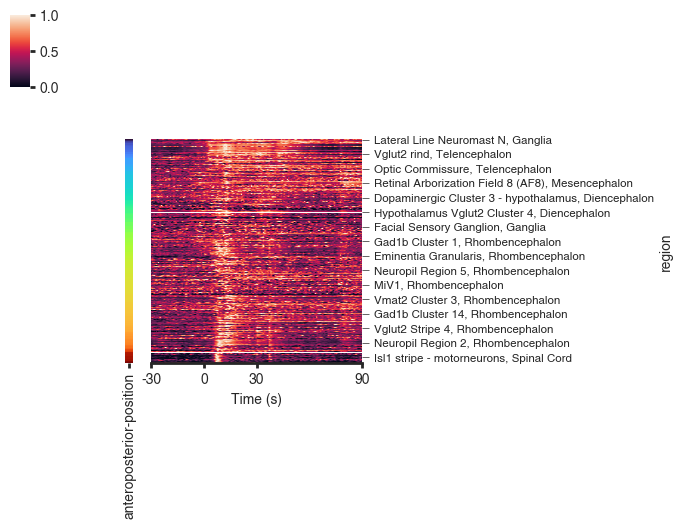

matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x000002366078D2D0>
local-nb_cs-ii-[29,33,34]_integration_figures (  45): INFO : ax_hmap.get_xlim() = (0.0, 600.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  63): INFO : (0.0, 600.0)


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:1113: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



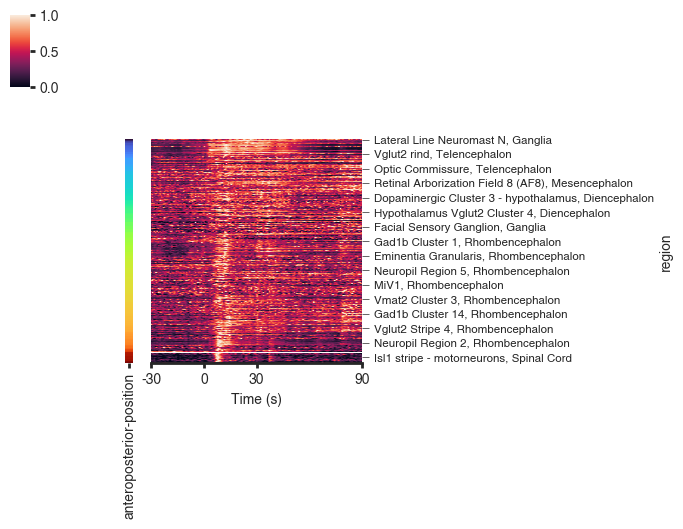

matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x000002358B3020E0>
local-nb_cs-ii-[29,33,34]_integration_figures (  45): INFO : ax_hmap.get_xlim() = (0.0, 600.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  63): INFO : (0.0, 600.0)


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:1113: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



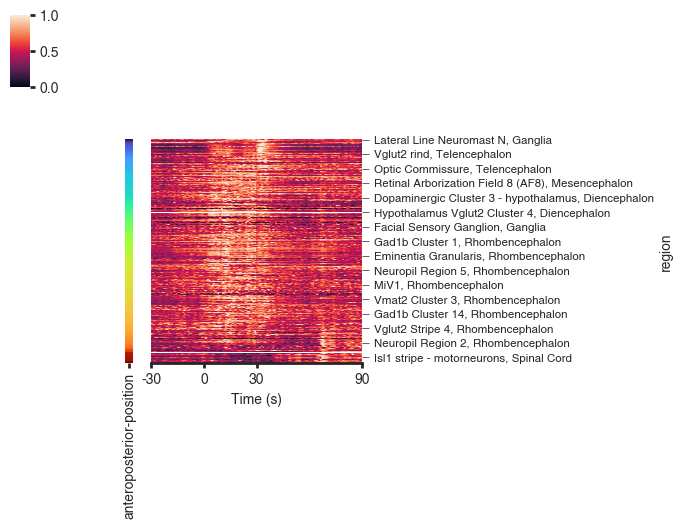

matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x0000023712A88310>
local-nb_cs-ii-[29,33,34]_integration_figures (  45): INFO : ax_hmap.get_xlim() = (0.0, 600.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  63): INFO : (0.0, 600.0)


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:1113: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



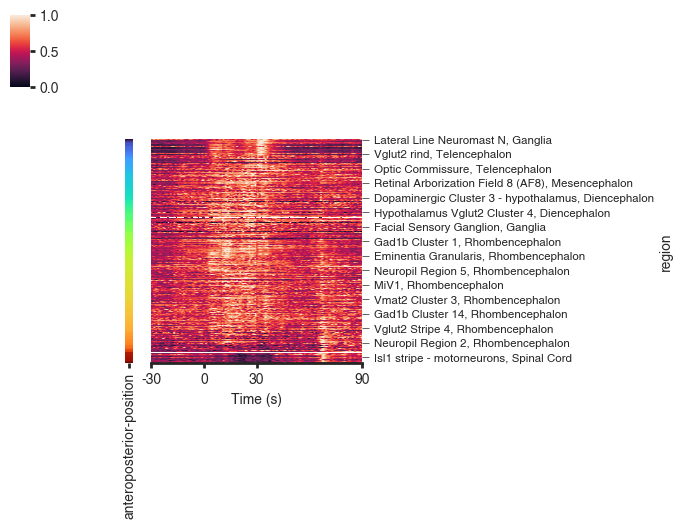

matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x0000023712ACE710>
local-nb_cs-ii-[29,33,34]_integration_figures (  45): INFO : ax_hmap.get_xlim() = (0.0, 600.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  63): INFO : (0.0, 600.0)


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:1113: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



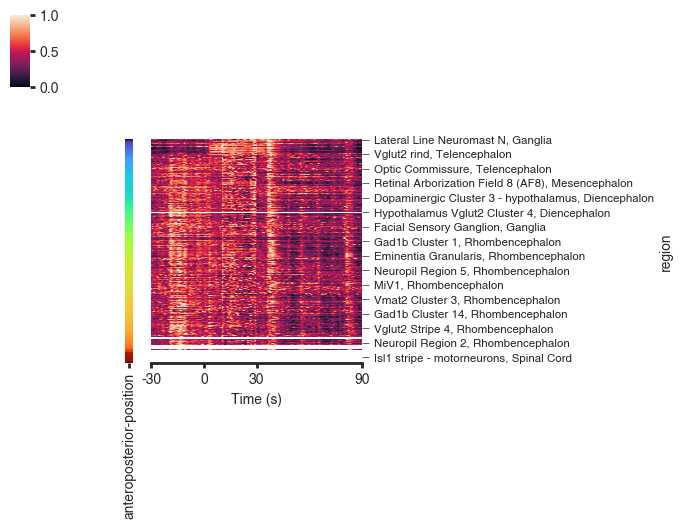

matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.AutoLocator object at 0x000002371403A110>
local-nb_cs-ii-[29,33,34]_integration_figures (  45): INFO : ax_hmap.get_xlim() = (0.0, 600.0)
local-nb_cs-ii-[29,33,34]_integration_figures (  63): INFO : (0.0, 600.0)


I:\CorbanSwain\repos\zmia\envs\zmia-env-everything-3.10-v3\lib\site-packages\seaborn\matrix.py:1113: UserWarning:

Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations



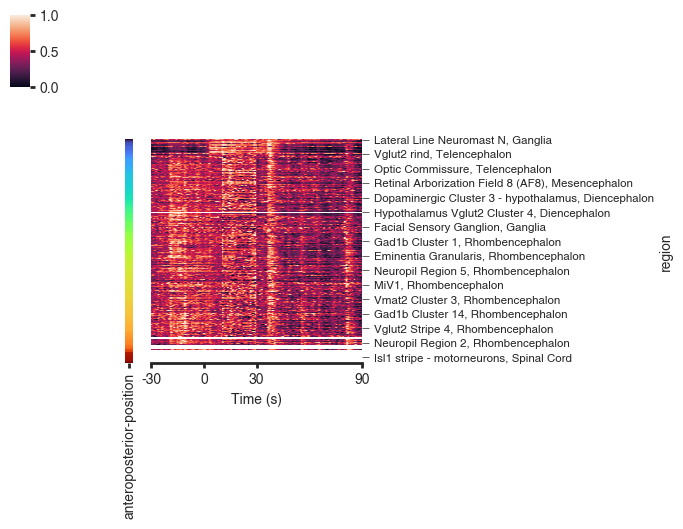

In [214]:
%matplotlib inline
for _, fig in subfig_heatmap_odor_traces():
    fig.set(facecolor='white')
    plt.show()

### Timecourse Plots

In [ ]:
(pd.DataFrame(
    data={'A': [1, np.nan, 3], 'B': [4, np.nan, np.nan]})
 .mean(axis=1))

In [ ]:
stim_types = stim_seq_df[STIM_TYPE_CN].unique()

region_select = stim_seq_df[REGION_CN].isin(selected_regions_for_plots)

axline_kws = {
    'color': 'k',
    'linestyle': ':',
    'linewidth': 1,
    'alpha': 0.5,
    'zorder': 0
}

def subfig_timecourse_lr():
    for stim_type in stim_types:
        log.info(f'Generating plots for {stim_type}.')

        subset_df = stim_seq_df.loc[
            (stim_seq_df[STIM_TYPE_CN] == stim_type)
            & region_select, :]
        
        facetgrid = sns.relplot(
            data=subset_df,
            x=TIME_CN,
            y=DF_BY_F_CN,
            hue=REGION_CN,
            hue_order=selected_regions_for_plots,
            palette='muted',
            col=LAT_SIDE_CN,
            row=SPATIAL_LAYOUT_CN,
            row_order=['left', 'right', 'both'],
            kind='line',
            errorbar=None,
            height=2.5/1.5,
            aspect=(4.0/1.5)/(2.5/1.5),
            zorder=10,
            facet_kws=dict(
                sharex=False,
                sharey=False,
                margin_titles=True,
            ),
            clip_on=False,
        )        
    
        def draw_all_lines(data, **kwargs):
            sns.lineplot(
                data=data,
                x=TIME_CN,
                y=DF_BY_F_CN,
                hue=REGION_CN,
                hue_order=selected_regions_for_plots,
                style=UNIQUE_STIM_TRIAL_CN,
                dashes=False,
                palette='muted',
                errorbar=None,
                alpha=0.1,
                linewidth=1,
                ax=plt.gca(),
                zorder=5,
                legend=False,                
            )
        facetgrid.map_dataframe(draw_all_lines)
    
        (facetgrid
         .map(plt.axvline, x=0, **axline_kws)
         .map(plt.axhline, y=0, **axline_kws)
         .map(plt.fill_between, x=[0, REF_STIM_TIME], y1=[-5, -5], y2=[5, 5], 
              color='k', alpha=0.1, linewidth=0, zorder=0)
         .set_axis_labels('', '')
         .set_titles(col_template='Brain {col_name}', row_template='{row_name} Stimulus')
         .set(xlim=(-1 * time_pre_stim_start, REF_STIM_TIME + time_post_stim),
              ylim=(-0.02, 0.7)))    
        facetgrid.figure.subplots_adjust(wspace=0.065, hspace=0)        
        
        ax: plt.Axes
        for (stim_side, lat_side), ax in facetgrid.axes_dict.items():
      
            is_bottom = stim_side == 'both'
            is_left = lat_side == 'left'                         
            
            if not (is_bottom or is_left):
                ax.axis('off')
                continue            
                
            if is_bottom:
                ax.set_xticks([-1 * time_pre_stim_start, 0, 
                               REF_STIM_TIME, REF_STIM_TIME + time_post_stim])                
            if is_left:
                ax.set_yticks([0, 0.2])  
                
            if is_bottom and is_left:
                ax.set_yticklabels(['0', '20'])
                ax.set_xlabel(f'Time (s) | {stim_type}', loc='center')
                ax.set_ylabel('$\mathdefault{\Delta F / F}$ (%)', loc='bottom')
                sns.despine(ax=ax, trim=True, right=True, top=True, offset=5)
                continue
                
            if not is_bottom:
                ax.set_xticks([])
                ax.set_yticklabels([])
                sns.despine(
                    ax=ax, trim=True, right=True, top=True, bottom=True, 
                    offset=5)
                
            if not is_left:
                ax.set_xticklabels([])
                ax.set_yticks([])
                sns.despine(
                    ax=ax, trim=True, right=True, top=True, left=True, 
                    offset=5)
        
        yield f'cs-ii-[33,34]_lr-activity-traces_{stim_type}', facetgrid.figure


fig_gen = subfig_timecourse_lr()        

In [ ]:
%matplotlib inline
for _, fig in fig_gen:
    fig.set(facecolor='white')

### Volcano Plots

In [ ]:
significant_stats_comparison_df

In [ ]:
axline_kws = {
    'color': 'k',
    'linestyle': ':',
    'linewidth': 1,
    'alpha': 0.5,
    'zorder': 1
}

time_bin_label_dict = {
    time_bins[0]: 'pre stim',
    time_bins[1]: 'stim',
    time_bins[2]: 'post stim'}



def subfig_volcano_lr():
    palette = sns.color_palette('muted')
    for stim_type in stim_types:
        log.info(f'Generating plots for {stim_type}.')                
        
        sig_subset_df = significant_stats_comparison_df.loc[
            significant_stats_comparison_df[STIM_TYPE_CN] == stim_type, :]
        insig_subset_df = insignificant_stats_comparison_df.loc[
            insignificant_stats_comparison_df[STIM_TYPE_CN] == stim_type, :]
        
        fig, ax = plt.subplots(
            1, 1,
            figsize=(2.5, 3),
            gridspec_kw=dict(
                bottom=0.2, top=0.95,
                left=0.2, right=0.95,
            ),
        )
        
        sns.scatterplot(
            ax=ax,
            data=sig_subset_df,
            x='effect-size',
            y='neg-log10-p',
            color='k',
            alpha=0.8,
            edgecolor='none',
            s=30)
        
        sns.scatterplot(
            ax=ax,
            data=insig_subset_df,
            x='effect-size',
            y='neg-log10-p',
            s=9,
            alpha=0.5,
            marker='o',
            facecolor='none',
            edgecolor='gray',
            linewidth=0.5)
            
        h_df = (
            sig_subset_df.loc[
                sig_subset_df[REGION_CN].isin(selected_regions_for_plots), :]
            .copy()
            .sort_values('neg-log10-p', ascending=True))
        h_df['sort-index'] = np.arange(h_df.shape[0])        
        
        for i, region in enumerate(selected_regions_for_plots):
            highlight_df = (
                sig_subset_df.loc[
                sig_subset_df[REGION_CN] == region,
                :])
            
            sns.scatterplot(
                ax=ax,
                data=highlight_df,
                x='effect-size',
                y='neg-log10-p',
                s=300,
                marker='*',
                edgecolor='k',
                linewidth=0.5,
                color=palette[i],
                zorder=20)
        
            for j, (row_index, s) in enumerate(highlight_df.iterrows()):
                log.info(f'Highlighting {s[TIME_BIN_CN] = }')                
                logp_val = s['neg-log10-p']
                effect_val = s['effect-size']                
                is_neg_effect = effect_val < 0
                sort_index = h_df.loc[row_index, 'sort-index']
                if is_neg_effect:
                    # ha = 'right'
                    offset_pos = [-45, 10]
                else:
                    # ha = 'left'
                    offset_pos = [
                        37, -15 + (13 * sort_index)]
                    
                if sort_index % 2 == 0:
                    offset_pos[0] *= -1
                    
                if 'cdv' in stim_type:
                    if sort_index == 0:
                        offset_pos[1] += -6
                    if sort_index == 2:
                        offset_pos[1] += -6
                    if sort_index > 2:
                        offset_pos[0] *= -1
                    
                if 'aa' in stim_type and sort_index < 2:
                    offset_pos[0] *= -1
                    offset_pos[1] -= 12
                    
                if 'con' in stim_type and sort_index == 0:
                    offset_pos[0] *= -1     
                    offset_pos[1] += -6
                        
                time_bin_label = time_bin_label_dict[s[TIME_BIN_CN]]
                brain_side_letter = s['test_side'][0].upper()
                stim_dir_letter = s[SPATIAL_LAYOUT_CN][0].upper()
                
                ax.annotate(
                    f'Br:{i + 1:d}{brain_side_letter:s}'
                    f'\nSt:{stim_dir_letter:s}'
                    f'\n{time_bin_label:s}',
                    (effect_val, logp_val),
                    xytext=offset_pos,
                    textcoords='offset points',
                    fontsize='small',
                    color='k',
                    ha='center',
                    va='center',
                    arrowprops=dict(
                        arrowstyle='->',
                        connectionstyle='arc3,rad=0.2',
                        color='k',
                        lw=1,
                        shrinkA=0,
                        shrinkB=9),
                    zorder=15,
                )                        
        
        ax.axhline(log_p_cutoff, **axline_kws)
        ax.axvline(-1 * effect_size_cutoff, **axline_kws)
        ax.axvline(effect_size_cutoff, **axline_kws)
        
        effect_size_cutoff_str = f'{effect_size_cutoff * 100:.0f}'
        
        ax.set(
            xlabel=r'$\mathdefault{\Delta\left(\Delta F / F\right)}$ (%)',
            ylabel=r'$\mathdefault{-\log_{10}\left(p\right)}$',
            xticks=[-0.5, -effect_size_cutoff, effect_size_cutoff, 0.5],
            xticklabels=[
                '$\mathdefault{-50}$',
                f'$\mathdefault{{-{effect_size_cutoff_str}}}$',
                f'$\mathdefault{{{effect_size_cutoff_str}}}$',
                '50'],
            yticks=[0, 2, 4, 6],
            xlim=(-0.90, 0.9),
            ylim=(-0.1, 6))
        sns.despine(
            ax=ax, trim=True, right=True, top=True)
        
        yield f'cs-ii-[33,34]_lr-activity-stat-volcano_{stim_type}', fig
        
fig_gen = subfig_volcano_lr()

In [ ]:
%matplotlib inline
for _, fig in fig_gen:
    fig.set(facecolor='white')

### Tail Movement Figures
#### Bouts over Time Swarm Plot

In [88]:
tail_movement_stats_df.head()

,time-interval,t-statistic,p-value,avg-bout-count,effect-size,test-interval,ref_interval,n-test,n-ref,stim-type,stimulus-direction,agg_class
0,"(1, 30]",-0.787834,0.449409,14.500000,-4.277778,"(1, 30]","(-30, -1]",9,6,cdv-2mM,both,all
1,"(1, 30]",-0.151438,0.881232,11.900000,-0.627273,"(1, 30]","(-30, -1]",11,10,aa-1.3mM,both,all
2,"(1, 30]",-0.556711,0.619926,2.333333,-0.533333,"(1, 30]","(-30, -1]",5,3,aa-1.3mM,left,all
3,"(1, 30]",1.666667,0.344042,1.000000,2.500000,"(1, 30]","(-30, -1]",2,2,aa-1.3mM,right,all
4,"(1, 30]",-1.782266,0.124984,5.500000,-3.000000,"(1, 30]","(-30, -1]",4,4,control,both,all


In [89]:
stim_sync_bout_df.head()

,experiment-id,run-id,fish_id,bout_index,bout_timestamp,bout_framestamp,bout_duration,bout_max_curvature,bout_max_angle_range,bout_duration_ms,unique_run_id,count_col,stim-step-index,stim-type,duration_s,stimulus-direction,time-bin
0,cs-ii-33,188,cs-ii-33A,226,-28.283909,155853,0.156,0.006077,4.870688,156.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both,"(-30, -1]"
1,cs-ii-33,188,cs-ii-33A,227,-26.185909,156356,0.568,0.006768,5.443922,568.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both,"(-30, -1]"
2,cs-ii-33,188,cs-ii-33A,228,-23.957909,156892,0.172,0.006011,4.595050,172.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both,"(-30, -1]"
3,cs-ii-33,188,cs-ii-33A,229,-23.498909,157002,0.578,0.006601,6.130605,578.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both,"(-30, -1]"
4,cs-ii-33,188,cs-ii-33A,230,-20.090909,157832,0.482,0.005887,6.514415,482.0,cs-ii-33_188,1,16,cdv-2mM,30.0,both,"(-30, -1]"


In [94]:
def swim_bout_timing():       
    sns_cmap = sns.color_palette('crest', as_cmap=True)
    
    for stim_type in stim_sync_bout_df[STIM_TYPE_CN].unique():
        
        if 'con' in stim_type:
            size = 9
        else:
            size = 3.8
        
        subset_df = stim_sync_bout_df.loc[
            stim_sync_bout_df[STIM_TYPE_CN] == stim_type, :]
        
        subset_df[SPATIAL_LAYOUT_CN] = (
            subset_df[SPATIAL_LAYOUT_CN]
            .astype(CategoricalDtype(categories=['left', 'right', 'both'])))
        
        subset_df = subset_df.copy()
        subset_df[BOUT_MAX_ANGLE_CN] = (
            subset_df[BOUT_MAX_ANGLE_CN]
            .clip(5, 185))
        
        fig, ax = plt.subplots(
            1, 1,
            figsize=(5.5, 3.5),
            gridspec_kw=dict(
                bottom=0.15, top=0.98,
                left=0.13, right=0.85,
            ),
        )
        
        sns.swarmplot(
            ax=ax,
            data=subset_df,
            x=BOUT_TIMESTAMP_CN,
            y=SPATIAL_LAYOUT_CN,
            hue=BOUT_MAX_ANGLE_CN,
            palette=sns_cmap,
            size=size,
            edgecolor='none',
            linewidth=0,
            legend=False,
            clip_on=False,
        )
        
        ax.set_ylim(*ax.get_ylim())
        ax.fill_between(
            x=[0, REF_STIM_TIME], y1=[-5, -5], y2=[5, 5], 
            color='k', alpha=0.1, linewidth=0, zorder=0)
        ax.axvline(
            0, color='k', linestyle=':', linewidth=1, zorder=1,
            alpha=0.5)
        ax.text(
            1, 1,
            f'Stimulus Type: {stim_type}',
            transform=ax.transAxes,            
            ha='right', va='top')
        
        ax.set(
            ylabel='Stimulus Direction',
            xticks=[
                -1 * time_pre_stim_start, 
                0, 
                REF_STIM_TIME, 
                REF_STIM_TIME + time_post_stim],        
            xlim=(-1 * time_pre_stim_start - 2, REF_STIM_TIME + time_post_stim + 2),
        )
        ax.set_xlabel('Time (s)')
        sns.despine(
            ax=ax, trim=True, right=True, top=True, offset=3)
        
        cax = fig.add_axes([.87, .25, .02, .65])
        cmap = mpl.cm.ScalarMappable(
            norm=mpl.colors.Normalize(
                vmin=subset_df[BOUT_MAX_ANGLE_CN].min(),
                vmax=subset_df[BOUT_MAX_ANGLE_CN].max()),
            cmap=sns_cmap,)
        cb = fig.colorbar(
            cmap,
            cax=cax, 
            orientation='vertical', 
            ticks=[10, 180],
            drawedges=False,
            label='Bout Angle Range ($\mathdefault{\degree}$)')        
        cb.outline.set_visible(False)
        sns.despine(
            ax=cax, 
            left=True, right=True, top=True, bottom=True)
        
        plt.show()
        yield f'cs-ii-[33,34]_swim-bout-timing_{stim_type}', fig
        
fig_gen = swim_bout_timing()

In [95]:
%matplotlib qt
for _, fig in fig_gen:
    fig.set(facecolor='white')
    plt.show()

matplotlib.pyplot ( 414): DEBUG : Loaded backend QtAgg version 5.15.4.
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.FixedLocator object at 0x0000025D75407D00>
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.FixedLocator object at 0x0000025CDAA5B610>
matplotlib.colorbar ( 859): DEBUG : locator: <matplotlib.ticker.FixedLocator object at 0x0000025CDAB03A60>


#### Bout Statistics Boxplots

In [ ]:
agg_sync_bout_df.head()

In [ ]:
def swim_bout_counts():   
    palette = sns.color_palette(
        [sns.color_palette('muted')[7],
         sns.color_palette('Paired')[0],
         sns.color_palette('Paired')[1]])
    
    for stim_type in stim_sync_bout_df[STIM_TYPE_CN].unique():
        subset_df = (
            agg_sync_bout_df
            .loc[agg_sync_bout_df[STIM_TYPE_CN] == stim_type, :])
        
        subset_df[SPATIAL_LAYOUT_CN] = (
            subset_df[SPATIAL_LAYOUT_CN]
            .astype(CategoricalDtype(categories=['left', 'right', 'both'])))
        subset_df[TIME_BIN_CN] = (
            subset_df[TIME_BIN_CN]
            .cat.rename_categories(['pre stim', 'stim', 'post stim']))
        
        fig, ax = plt.subplots(
            1, 1,
            figsize=(3, 3.5),
            gridspec_kw=dict(
                bottom=0.15, top=0.98,
                left=0.18, right=0.95,
            ),
        )
        
        sns.barplot(
            ax=ax,
            data=subset_df,
            x=BOUT_INDEX_CN,
            y=SPATIAL_LAYOUT_CN,
            hue=TIME_BIN_CN,
            palette=palette,
            linewidth=0,
            edgecolor='none',
            gap=0.15
        )
        
        sns.swarmplot(
            ax=ax,
            data=subset_df,
            x=BOUT_INDEX_CN,
            y=SPATIAL_LAYOUT_CN,
            hue=TIME_BIN_CN,
            palette=palette,
            dodge=True,
            size=3.9,
            edgecolor='k',
            linewidth=0.65,
            alpha=0.7,
            legend=False,
        )
        
        ax.set(
            xlabel='Number of Bouts',
            ylabel='',            
            xticks=[0, 30],
            xlim=(0, 35),
        )
        
        sns.despine(
            ax=ax, trim=True, right=True, top=True, offset=3)

        
        yield f'cs-ii-[33,34]_swim-bout-stats_{stim_type}', fig

fig_gen = swim_bout_counts()

In [ ]:
%matplotlib inline
for _, fig in fig_gen:
    fig.set(facecolor='white')


#### Bout Frequency by Fish Plots

In [181]:
def bout_freq_plot():

    fig, ax = plt.subplots(
        1, 1,
        figsize=(4, 3.5),
        gridspec_kw=dict(
            bottom=0.15, top=0.98,
            left=0.18, right=0.95,
        ),
    )

    sns.boxplot(
        ax=ax,
        data=bout_stat_df,
        x='bout-frequency',
        y='fish-id',
        gap=0.15,
        color='0.8',
        linewidth=1
    )

    sns.swarmplot(
        ax=ax,
        data=bout_stat_df,
        x='bout-frequency',
        y='fish-id',
        dodge=True,
        size=8,
        color='k',
        linewidth=0.5,
        alpha=1,
    )

    ax.set(
        xlabel='Bout Frequency (bouts/min)',
        ylabel='',
        xticks=[0.1, 1, 10, 100],
        xlim=(0.1, 100),
        xscale='log',
    )

    sns.despine(
            ax=ax, trim=True, right=True, top=True, offset=3)

    yield f'cs-ii-[33,34]_swim-bout-stats', fig

fig_gen = bout_freq_plot()

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.
matplotlib.ticker (2343): DEBUG : vmin 0.1 vmax 100.0
matplotlib.ticker (2392): DEBUG : ticklocs array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03])
matplotlib.ticker (2343): DEBUG : vmin 0.1 vmax 100.0
matplotlib.ticker (2392): DEBUG : ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 7.e-01, 8.e-01, 9.e-01,
       2.e+00, 3.e+00, 4.e+00, 5.e+00, 6.e+00, 7.e+00, 8.e+00, 9.e+00,
       2.e+01, 3.e+01, 4.e+01, 5.e+01, 6.e+01, 7.e+01, 8.e+01, 9.e+01,
       2.e+02, 3.e+02, 4.e+02, 5.e+02, 6.e+02, 7.e+02, 8.e+02, 9.e+02,
       2.e+03, 3.e+03, 4.e+03, 5.e+03, 6.e+03, 7.e+03, 8.e+03, 9.e+03])
matplotlib.ticker (2343): DEBUG : vmin 0.1 vmax 100.0
matplotlib.ticker (2392): DEBUG : ticklocs array([2.e-02, 3.e-02, 4.e-02, 5.e-02, 6.e-02, 7.e-02, 8.e-02, 9.e-02,
       2.e-01, 3.e-01, 4.e-01, 5.e-01, 6.e-01, 

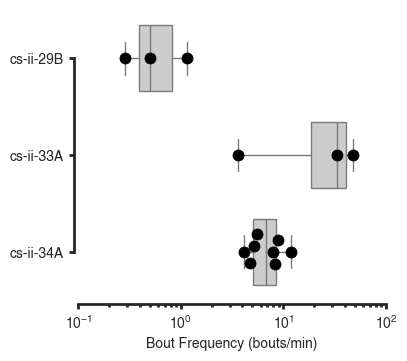

In [182]:
%matplotlib inline

for _, fig in fig_gen:
    fig.set(facecolor='white')
    plt.show()

#### Bout Magnitude by Fish Plots

In [185]:
def bout_mag_by_fish_plot():
    sns_cmap = sns.color_palette('crest', as_cmap=True)

    swim_bout_stat_df_local = swim_bout_stat_df.copy()
    swim_bout_stat_df_local['fish_id'] = swim_bout_stat_df_local['fish_id'].astype('category')
    swim_bout_stat_df_local['tail-angle-bounded'] = swim_bout_stat_df_local[BOUT_MAX_ANGLE_CN].clip(5, 185)

    fig, ax = plt.subplots(
        1, 1,
        figsize=(7, 3.5),
        gridspec_kw=dict(
            bottom=0.15, top=0.98,
            left=0.18, right=0.95,
        ),
    )

    sns.stripplot(
        ax=ax,
        data=swim_bout_stat_df_local,
        x=BOUT_MAX_ANGLE_CN,
        y='fish_id',
        hue='tail-angle-bounded',
        palette=sns_cmap,
        size=5,
        jitter=0.30,
        alpha=0.5,
        edgecolor='k',
        linewidth=0.25,
        legend=False,
        clip_on=False,
    )

    ax.set(
        xlabel='Bout Max Tail Angle ($\mathdefault{\degree}$)',
        ylabel='',
        xticks=[0, 90, 180, 270],
    )

    sns.despine(
            ax=ax, trim=True, right=True, top=True, offset=3)

    yield f'cs-ii-[33,34]_swim-bout-mag-by-fish', fig

fig_gen = bout_mag_by_fish_plot()

matplotlib.pyplot ( 414): DEBUG : Loaded backend module://matplotlib_inline.backend_inline version unknown.


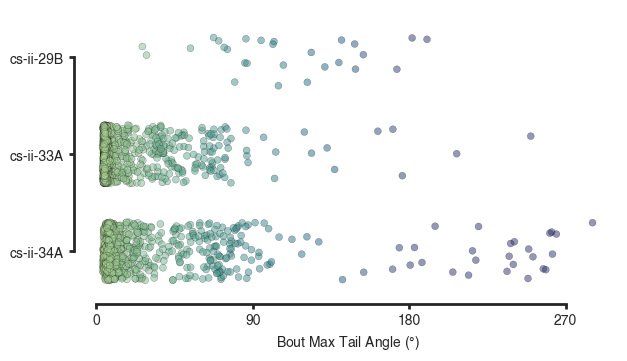

In [186]:
%matplotlib inline
for _, fig in fig_gen:
    fig.set(facecolor='white')
    plt.show()

### Dimensionality Reduction

In [55]:
%matplotlib qt

def subfig_dim_reduction():
    methods = [
        ('pca', cluster_pivot_new_df, ('PC-1', 'PC-2')),
        ('tsne', tsne_data_df, ('t-SNE-1', 't-SNE-2'))]

    for method_name, method_df, (x_label, y_label) in methods:
         for vis_type in ('odor', 'experiment'):
            fig, ax = plt.subplots(
                1, 1,
                figsize=(4.5/1.2, 4.0/1.2),
                gridspec_kw=dict(
                    bottom=0.15, top=0.98,
                    left=0.18, right=0.95,
                ),
            )

            method_df = method_df.copy()
            method_df = method_df.rename(columns={SPATIAL_LAYOUT_CN: 'Stim. Direction',
                                                  STIM_TYPE_CN: 'Stim. Type',
                                                  EXPERIMENT_ID_CN: 'Experiment ID'})

            if vis_type == 'odor':
                kwargs = dict(
                    hue='Stim. Type',
                    style='Stim. Direction',
                    palette='muted',
                )
            else:
                palette = sns.color_palette([sns.color_palette('muted')[i] for i in [3, 9]])
                kwargs = dict(
                    hue='Experiment ID',
                    palette=palette,
                )

            scatter = sns.scatterplot(
                ax=ax,
                data=method_df,
                x=x_label,
                y=y_label,
                **kwargs,
                s=80,
                edgecolor='k',
                linewidth=0.5,
                alpha=0.8,
                legend='full',
                zorder=10,
            )

            if method_name == 'pca':
                ax.axvline(
                    0, color='k', linestyle='--', linewidth=1, zorder=1,
                    alpha=0.3)
                ax.axhline(
                    0, color='k', linestyle='--', linewidth=1, zorder=1,
                    alpha=0.3)

            sns.despine(
                ax=ax, right=True, top=True, offset=3)
            ax.set(
                xticks=[], yticks=[],
            )

            yield f'cs-ii-[33,34]_dim-reduction_{method_name}_{vis_type}', fig


matplotlib.pyplot ( 414): DEBUG : Loaded backend QtAgg version 5.15.4.


In [56]:
%matplotlib qt
for _, fig in subfig_dim_reduction():
    fig.set(facecolor='white')
    plt.show()

matplotlib.pyplot ( 414): DEBUG : Loaded backend QtAgg version 5.15.4.


### Save All Plots

In [309]:
all_subfigs = it.chain(
    # subfig_timecourse_lr(),
    # subfig_volcano_lr(),
    # swim_bout_timing(),
    # swim_bout_counts(),
    # bout_freq_plot(),
    # bout_mag_by_fish_plot(),
    # subfig_heatmap_odor_traces(),
    subfig_dim_reduction()
)

output_dir = os.path.join(multi_experiment_output_dir,
                          'cs-ii-[33,34]_integrated-analysis-figures')
csutils.touchdir(output_dir)

overwrite = True # <<<<<<<<<<<<<<< FALSE (only change temporarily)

for fig_name, fig in all_subfigs:
    for ext in ('png', 'pdf'):
        fig_path = os.path.join(
            output_dir, 
            f'{ext.upper()}s', 
            f'{fig_name}.{ext}')
        csutils.touchdir(os.path.dirname(fig_path))
        if not os.path.exists(fig_path) or overwrite:
            fig.savefig(
                fig_path, dpi=300,
                bbox_inches='tight', pad_inches=0.25)
    plt.close(fig)

matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.backends.backend_pdf ( 918): DEBUG : Assigning font /F1 = 'C:\\Windows\\Fonts\\Linotype - HelveticaLTPro-Roman.otf'
matplotlib.backends.backend_pdf ( 964): DEBUG : Embedding font C:\Windows\Fonts\Linotype - HelveticaLTPro-Roman.otf.
matplotlib.backends.backend_pdf ( 971): DEBUG : Writing TrueType font.
matplotlib.backends.backend_pdf ( 918): DEBUG : Assigni